In [ ]:
import pandas as pd
from phe import paillier
import random
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import json
import requests
import numpy as np

import hashlib


In [ ]:
!pip install phe


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.7/53.7 kB 1.8 MB/s eta 0:00:00


# **IMPLEMENTING THE PBFT PROTOCOL ALONG WITH ZERO KNOWLEDGE PROOF**

In [2]:
import pandas as pd
import random

# Load the dataset
df = pd.read_csv('/content/sample_data/0819_UkraineCombinedTweetsDeduped.csv',sep=',', encoding='utf-8', on_bad_lines='skip')

# Drop the specified row (example: row at index 32939)
df = df.drop(32939)

# Create a new column 'is_fake' with random 0s and 1s
df['is_fake'] = [random.choice([0, 1]) for _ in range(len(df))]

# Create a new column 'not_fake' which is the inverse of 'is_fake'
df['not_fake'] = [1 - x for x in df['is_fake']]

# Display the first few rows of the updated DataFrame
print(df.head())

   Unnamed: 0               userid         username  \
0           0            173212647   JoeMokolobetsi   
1           1            335041409  XclusivasPuebla   
2           2  1512400441103032323  ShelterAnimalUA   
3           3  1356632630662430722  DogandCatHelpe1   
4           4             20297125   ElMananaOnline   

                                            acctdesc        location  \
0  Yeshua Hamashiach is THE answer | Romans 10:9-...    Afrika Borwa   
1  Somos el periódico  #ExclusivasPuebla| Investi...  Puebla, México   
2  Shelter for abandoned dogs and cats. 1400 dogs...         Ukraine   
3  Shelter for abandoned dogs and cats. 1400 dogs...         Ukraine   
4  Las mejores noticias de los dos Laredos y el m...    Nuevo Laredo   

   following  followers  totaltweets               usercreatedts  \
0        219        197         4789  2010-07-31 19:09:22.000000   
1       1419       6402        70267  2011-07-14 02:02:24.000000   
2        782        109         

# **INCORPORATING HOMOMORPHIC ENCRYPTION**



--- Consensus Round 1 ---
Node 1 generates proof: fed741cd5f147f571b8b29f34600b52465c951f27d10c0412b6381b3b384f78c
Node 0 verifies proof: fed741cd5f147f571b8b29f34600b52465c951f27d10c0412b6381b3b384f78c against expected: fed741cd5f147f571b8b29f34600b52465c951f27d10c0412b6381b3b384f78c
Validation time: 0.92 seconds
Node 2 verifies proof: fed741cd5f147f571b8b29f34600b52465c951f27d10c0412b6381b3b384f78c against expected: fed741cd5f147f571b8b29f34600b52465c951f27d10c0412b6381b3b384f78c
Validation time: 1.36 seconds
Node 3 verifies proof: fed741cd5f147f571b8b29f34600b52465c951f27d10c0412b6381b3b384f78c against expected: fed741cd5f147f571b8b29f34600b52465c951f27d10c0412b6381b3b384f78c
Validation time: 1.60 seconds
Node 4 verifies proof: fed741cd5f147f571b8b29f34600b52465c951f27d10c0412b6381b3b384f78c against expected: fed741cd5f147f571b8b29f34600b52465c951f27d10c0412b6381b3b384f78c
Validation time: 1.22 seconds
Block added to the blockchain.
Node 3 was slow in validation and loses 10 reputa

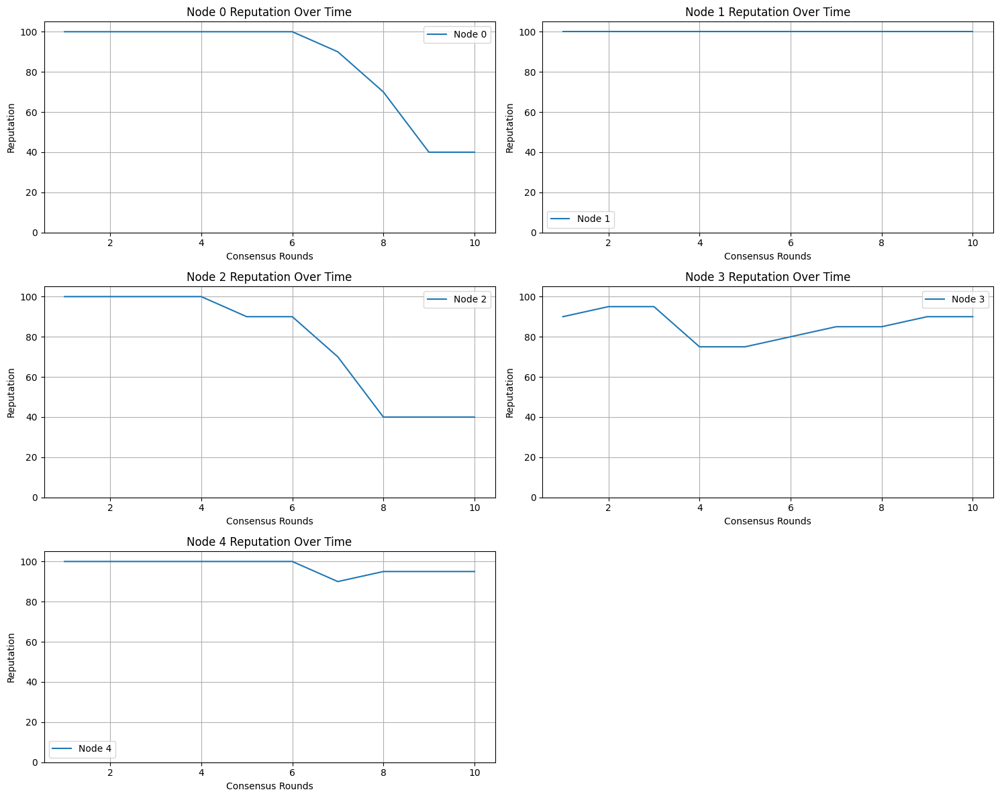


Node Performance Data:
   Round  Node 0  Node 1  Node 2  Node 3  Node 4
0      1     100     100     100      90     100
1      2     100     100     100      95     100
2      3     100     100     100      95     100
3      4     100     100     100      75     100
4      5     100     100      90      75     100
5      6     100     100      90      80     100
6      7      90     100      70      85      90
7      8      70     100      40      85      95
8      9      40     100      40      90      95
9     10      40     100      40      90      95


In [ ]:
import random
import hashlib
import tenseal as ts
import time
import matplotlib.pyplot as plt
import pandas as pd

class Node:
    def __init__(self, node_id, context):
        self.node_id = node_id
        self.reputation = 100
        self.is_malicious = False
        self.context = context
        self.reputation_history = []
        self.malicious_count = 0
        self.validation_times = []

    def propose_block(self, blockchain, tweets):
        is_fake_values = [tweet['is_fake'] for tweet in tweets]
        encrypted_tweets = ts.ckks_vector(self.context, is_fake_values)

        one_vector = ts.ckks_vector(self.context, [1] * len(tweets))
        valid_tweets = one_vector - encrypted_tweets
        valid_tweet_count = valid_tweets.sum()

        total_tweets = ts.ckks_vector(self.context, [len(tweets)])

        proof = self.generate_proof(valid_tweet_count, total_tweets)

        blockchain.append((encrypted_tweets, valid_tweet_count, total_tweets, proof))

        return valid_tweet_count, total_tweets

    def generate_proof(self, encrypted_count, encrypted_total):
        proof_data = str(encrypted_count) + str(encrypted_total)
        proof = hashlib.sha256(proof_data.encode()).hexdigest()
        print(f"Node {self.node_id} generates proof: {proof}")
        return proof

    def verify_proof(self, proof, encrypted_count, encrypted_total):
        validation_time = random.uniform(0.1, 2.0)
        time.sleep(validation_time)

        self.validation_times.append(validation_time)

        proof_data = str(encrypted_count) + str(encrypted_total)
        expected_proof = hashlib.sha256(proof_data.encode()).hexdigest()
        print(f"Node {self.node_id} verifies proof: {proof} against expected: {expected_proof}")
        print(f"Validation time: {validation_time:.2f} seconds")
        return proof == expected_proof, validation_time

    def update_reputation(self, score):
        self.reputation += score
        self.reputation = max(0, min(100, self.reputation))
        self.reputation_history.append(self.reputation)

class BlockchainNetwork:
    def __init__(self, num_nodes):
        self.context = ts.context(ts.SCHEME_TYPE.CKKS, poly_modulus_degree=8192, coeff_mod_bit_sizes=[60, 40, 40, 60])
        self.context.global_scale = 2**40
        self.context.generate_galois_keys()
        self.nodes = [Node(i, self.context) for i in range(num_nodes)]
        self.blockchain = []
        self.total_valid_tweets = ts.ckks_vector(self.context, [0])
        self.total_tweets = ts.ckks_vector(self.context, [0])
        self.validation_time_threshold = 1.5

    def consensus(self, tweets):
        current_total_tweets = len(tweets)
        current_valid_tweets = sum(tweet['is_fake'] == 0 for tweet in tweets)

        self.total_tweets += ts.ckks_vector(self.context, [current_total_tweets])
        self.total_valid_tweets += ts.ckks_vector(self.context, [current_valid_tweets])

        eligible_nodes = [node for node in self.nodes if node.reputation >= 50]
        if len(eligible_nodes) < 1:
            print("Not enough eligible nodes for consensus.")
            return

        primary_node = random.choices(eligible_nodes, weights=[node.reputation for node in eligible_nodes], k=1)[0]

        encrypted_count, encrypted_total = primary_node.propose_block(self.blockchain, tweets)

        malicious_detected = False
        slow_validators = []
        for node in eligible_nodes:
            if node != primary_node:
                is_valid, validation_time = node.verify_proof(self.blockchain[-1][3], encrypted_count, encrypted_total)
                if not is_valid:
                    primary_node.is_malicious = True
                    primary_node.malicious_count += 1
                    malicious_detected = True
                    print(f"Node {node.node_id} detected an invalid proof and reported Node {primary_node.node_id} as malicious.")
                    break
                if validation_time > self.validation_time_threshold:
                    slow_validators.append(node)

        if malicious_detected:
            reputation_loss = -20 * primary_node.malicious_count
            primary_node.update_reputation(reputation_loss)
            print(f"Node {primary_node.node_id} loses {-reputation_loss} reputation points.")
        else:
            print(f"Block added to the blockchain.")
            primary_node.update_reputation(5)

        for node in slow_validators:
            node.malicious_count += 1
            reputation_loss = -10 * node.malicious_count
            node.update_reputation(reputation_loss)
            print(f"Node {node.node_id} was slow in validation and loses {-reputation_loss} reputation points.")

        for node in self.nodes:
            if node not in slow_validators and node != primary_node:
                node.update_reputation(0)

    def print_performance_summary(self):
        print("\nPerformance Summary of Nodes:")
        for node in self.nodes:
            status = "Malicious" if node.is_malicious else "Honest"
            avg_validation_time = sum(node.validation_times) / len(node.validation_times) if node.validation_times else 0
            print(f"Node {node.node_id}: Reputation = {node.reputation}, Status = {status}, "
                  f"Malicious Count = {node.malicious_count}, Avg Validation Time = {avg_validation_time:.2f}s")

    def print_tweet_statistics(self):
        total_tweets = self.total_tweets.decrypt()[0]
        valid_tweets = self.total_valid_tweets.decrypt()[0]
        percentage_valid = (valid_tweets / total_tweets) * 100 if total_tweets > 0 else 0
        print(f"\nTweet Statistics:")
        print(f"Total Tweets Processed: {total_tweets:.0f}")
        print(f"Valid Tweets: {valid_tweets:.0f}")
        print(f"Percentage of Valid Tweets: {percentage_valid:.2f}%")

class NodePerformanceTracker:
    def __init__(self, num_nodes):
        self.num_nodes = num_nodes
        self.reputations = {i: [] for i in range(num_nodes)}
        self.rounds = 0

    def update(self, blockchain_network):
        self.rounds += 1
        for node in blockchain_network.nodes:
            self.reputations[node.node_id].append(node.reputation)

    def plot_individual_performances(self):
        fig, axes = plt.subplots(nrows=(self.num_nodes + 1) // 2, ncols=2, figsize=(15, 5 * self.num_nodes // 2))
        axes = axes.flatten()

        for node_id, reputation_history in self.reputations.items():
            ax = axes[node_id]
            ax.plot(range(1, self.rounds + 1), reputation_history, label=f'Node {node_id}')
            ax.set_title(f'Node {node_id} Reputation Over Time')
            ax.set_xlabel('Consensus Rounds')
            ax.set_ylabel('Reputation')
            ax.legend()
            ax.grid(True)
            ax.set_ylim(0, 105)

        for i in range(self.num_nodes, len(axes)):
            fig.delaxes(axes[i])

        plt.tight_layout()
        plt.show()

    def get_performance_data(self):
        data = {'Round': list(range(1, self.rounds + 1))}
        for node_id, reputation_history in self.reputations.items():
            data[f'Node {node_id}'] = reputation_history
        return pd.DataFrame(data)

# Main execution
if __name__ == "__main__":
    # Load and prepare tweets
    df = pd.read_csv('/content/sample_data/0819_UkraineCombinedTweetsDeduped.csv')
    selected_tweets = df.sample(30)
    tweets = [
        {'text': row['text'], 'is_fake': random.choice([0, 1])}
        for _, row in selected_tweets.iterrows()
    ]

    # Initialize blockchain network and performance tracker
    blockchain_network = BlockchainNetwork(5)
    performance_tracker = NodePerformanceTracker(5)

    # Run consensus for 10 rounds
    for round_number in range(10):
        print(f"\n--- Consensus Round {round_number + 1} ---")
        blockchain_network.consensus(tweets)
        blockchain_network.print_performance_summary()
        performance_tracker.update(blockchain_network)

    # Print final tweet statistics
    blockchain_network.print_tweet_statistics()

    # Plot individual node performances
    performance_tracker.plot_individual_performances()

    # Get and print performance data
    performance_data = performance_tracker.get_performance_data()
    print("\nNode Performance Data:")
    print(performance_data)

In [ ]:
!pip install tenseal


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 30.0 MB/s eta 0:00:00


# WITH HYPERLEDGER LATENCY AND THROUGHPUT


--- Consensus Round 1 ---
Node 0 generates proof: 144ce052b2136a4eb46688d726abed5c8d0fd3c28f9a2770f12ed51db075f770
Node 1 verifies proof: 144ce052b2136a4eb46688d726abed5c8d0fd3c28f9a2770f12ed51db075f770 against expected: 144ce052b2136a4eb46688d726abed5c8d0fd3c28f9a2770f12ed51db075f770
Validation time: 1.54 seconds
Node 2 verifies proof: 144ce052b2136a4eb46688d726abed5c8d0fd3c28f9a2770f12ed51db075f770 against expected: 144ce052b2136a4eb46688d726abed5c8d0fd3c28f9a2770f12ed51db075f770
Validation time: 0.90 seconds
Node 3 verifies proof: 144ce052b2136a4eb46688d726abed5c8d0fd3c28f9a2770f12ed51db075f770 against expected: 144ce052b2136a4eb46688d726abed5c8d0fd3c28f9a2770f12ed51db075f770
Validation time: 0.98 seconds
Node 4 verifies proof: 144ce052b2136a4eb46688d726abed5c8d0fd3c28f9a2770f12ed51db075f770 against expected: 144ce052b2136a4eb46688d726abed5c8d0fd3c28f9a2770f12ed51db075f770
Validation time: 1.62 seconds
Block added to the blockchain.
Node 1 was slow in validation and loses 10 reputa

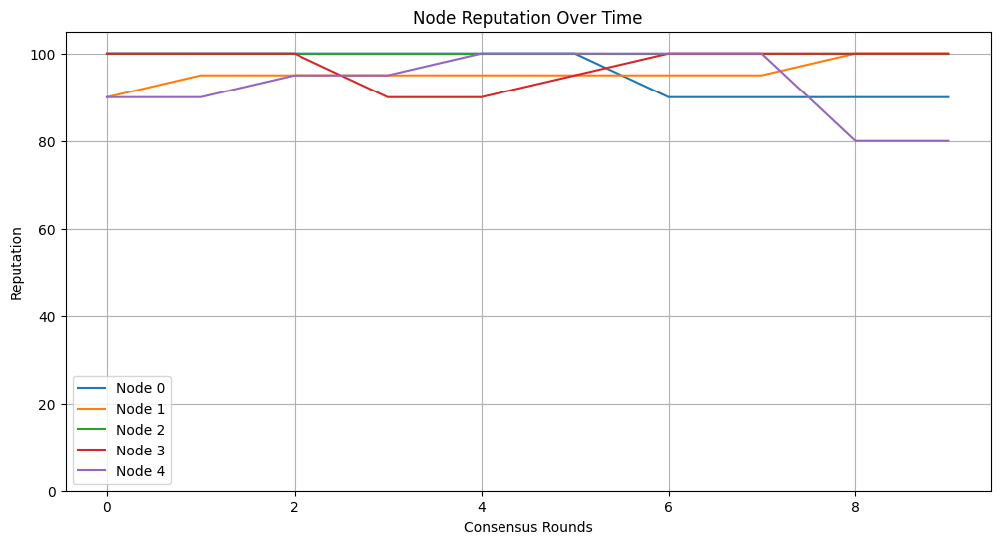

Total time taken for 500 blocks with 0.5 seconds average latency: 313.38 secs
Total time taken for 500 blocks with 2 seconds average latency: 1249.52 secs
Total time taken for 500 blocks with 5 seconds average latency: 3094.29 secs
Total time taken for 1000 blocks with 0.5 seconds average latency: 627.08 secs
Total time taken for 1000 blocks with 2 seconds average latency: 2520.31 secs
Total time taken for 1000 blocks with 5 seconds average latency: 6278.95 secs
Total time taken for 2000 blocks with 0.5 seconds average latency: 1251.43 secs
Total time taken for 2000 blocks with 2 seconds average latency: 4992.21 secs
Total time taken for 2000 blocks with 5 seconds average latency: 12464.67 secs


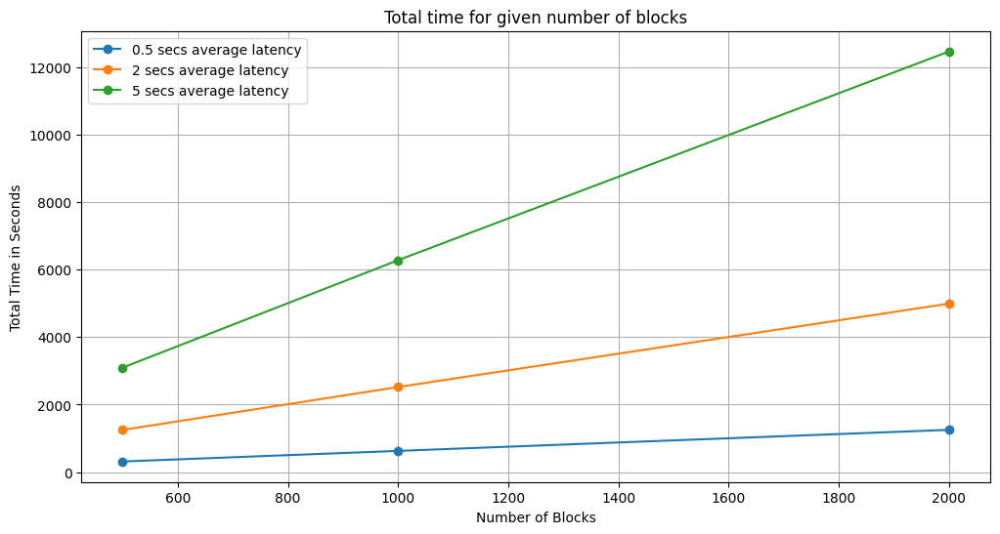

In [ ]:
import random
import hashlib
import tenseal as ts
import time
import matplotlib.pyplot as plt
from collections import deque
import pandas as pd

class Node:
    def __init__(self, node_id, context):
        self.node_id = node_id
        self.reputation = 100  # Initialize reputation
        self.is_malicious = False  # Flag for malicious behavior
        self.context = context
        self.reputation_history = []  # To track reputation over time
        self.malicious_count = 0  # Count of times node has been detected as malicious
        self.validation_times = []  # Track validation times
        self.block_creation_times = []  # Track block creation times

    def propose_block(self, blockchain, tweets):
        start_time = time.time()
        is_fake_values = [tweet['is_fake'] for tweet in tweets]
        encrypted_tweets = ts.ckks_vector(self.context, is_fake_values)

        one_vector = ts.ckks_vector(self.context, [1] * len(tweets))
        valid_tweets = one_vector - encrypted_tweets
        valid_tweet_count = valid_tweets.sum()

        total_tweets = ts.ckks_vector(self.context, [len(tweets)])

        proof = self.generate_proof(valid_tweet_count, total_tweets)

        blockchain.append((encrypted_tweets, valid_tweet_count, total_tweets, proof))

        end_time = time.time()
        block_creation_time = end_time - start_time
        self.block_creation_times.append(block_creation_time)
        return valid_tweet_count, total_tweets, block_creation_time

    def generate_proof(self, encrypted_count, encrypted_total):
        proof_data = str(encrypted_count) + str(encrypted_total)
        proof = hashlib.sha256(proof_data.encode()).hexdigest()
        print(f"Node {self.node_id} generates proof: {proof}")
        return proof

    def verify_proof(self, proof, encrypted_count, encrypted_total):
        validation_time = random.uniform(0.1, 2.0)
        time.sleep(validation_time)

        self.validation_times.append(validation_time)

        proof_data = str(encrypted_count) + str(encrypted_total)
        expected_proof = hashlib.sha256(proof_data.encode()).hexdigest()
        print(f"Node {self.node_id} verifies proof: {proof} against expected: {expected_proof}")
        print(f"Validation time: {validation_time:.2f} seconds")
        return proof == expected_proof, validation_time

    def update_reputation(self, score):
        self.reputation += score
        self.reputation = max(0, min(100, self.reputation))
        self.reputation_history.append(self.reputation)

class BlockchainNetwork:
    def __init__(self, num_nodes):
        self.context = ts.context(ts.SCHEME_TYPE.CKKS, poly_modulus_degree=8192, coeff_mod_bit_sizes=[60, 40, 40, 60])
        self.context.global_scale = 2**40
        self.context.generate_galois_keys()
        self.nodes = [Node(i, self.context) for i in range(num_nodes)]
        self.blockchain = []
        self.total_valid_tweets = ts.ckks_vector(self.context, [0])
        self.total_tweets = ts.ckks_vector(self.context, [0])
        self.validation_time_threshold = 1.5  # Threshold for considering a node potentially malicious
        self.block_creation_time_threshold = 1.0  # Threshold for considering a node slow in block creation
        self.latencies = deque(maxlen=1000)
        self.throughputs = deque(maxlen=1000)

    def consensus(self, tweets):
        start_time = time.time()

        current_total_tweets = len(tweets)
        current_valid_tweets = sum(tweet['is_fake'] == 0 for tweet in tweets)

        self.total_tweets += ts.ckks_vector(self.context, [current_total_tweets])
        self.total_valid_tweets += ts.ckks_vector(self.context, [current_valid_tweets])

        eligible_nodes = [node for node in self.nodes if node.reputation >= 50]
        if len(eligible_nodes) < 1:
            print("Not enough eligible nodes for consensus.")
            return

        primary_node = random.choices(eligible_nodes, weights=[node.reputation for node in eligible_nodes], k=1)[0]

        encrypted_count, encrypted_total, block_creation_time = primary_node.propose_block(self.blockchain, tweets)

        malicious_detected = False
        slow_validators = []
        for node in eligible_nodes:
            if node != primary_node:
                is_valid, validation_time = node.verify_proof(self.blockchain[-1][3], encrypted_count, encrypted_total)
                if not is_valid:
                    primary_node.is_malicious = True
                    primary_node.malicious_count += 1
                    malicious_detected = True
                    print(f"Node {node.node_id} detected an invalid proof and reported Node {primary_node.node_id} as malicious.")
                    break
                if validation_time > self.validation_time_threshold:
                    slow_validators.append(node)

        if malicious_detected:
            reputation_loss = -20 * primary_node.malicious_count
            primary_node.update_reputation(reputation_loss)
            print(f"Node {primary_node.node_id} loses {-reputation_loss} reputation points.")
        else:
            print(f"Block added to the blockchain.")
            primary_node.update_reputation(5)

        for node in slow_validators:
            node.malicious_count += 1
            reputation_loss = -10 * node.malicious_count
            node.update_reputation(reputation_loss)
            print(f"Node {node.node_id} was slow in validation and loses {-reputation_loss} reputation points.")

        if block_creation_time > self.block_creation_time_threshold:
            primary_node.update_reputation(-10)
            print(f"Node {primary_node.node_id} was slow in block creation and loses 10 reputation points.")

        for node in self.nodes:
            if node not in slow_validators and node != primary_node:
                node.update_reputation(0)

        end_time = time.time()
        total_latency = end_time - start_time
        self.latencies.append(total_latency)

        throughput = len(tweets) / total_latency
        self.throughputs.append(throughput)

    def print_performance_summary(self):
        print("\nPerformance Summary of Nodes:")
        for node in self.nodes:
            status = "Malicious" if node.is_malicious else "Honest"
            avg_validation_time = sum(node.validation_times) / len(node.validation_times) if node.validation_times else 0
            avg_block_creation_time = sum(node.block_creation_times) / len(node.block_creation_times) if node.block_creation_times else 0
            print(f"Node {node.node_id}: Reputation = {node.reputation}, Status = {status}, "
                  f"Malicious Count = {node.malicious_count}, Avg Validation Time = {avg_validation_time:.2f}s, "
                  f"Avg Block Creation Time = {avg_block_creation_time:.2f}s")

    def print_tweet_statistics(self):
        total_tweets = self.total_tweets.decrypt()[0]
        valid_tweets = self.total_valid_tweets.decrypt()[0]
        percentage_valid = (valid_tweets / total_tweets) * 100 if total_tweets > 0 else 0
        print(f"\nTweet Statistics:")
        print(f"Total Tweets Processed: {total_tweets:.0f}")
        print(f"Valid Tweets: {valid_tweets:.0f}")
        print(f"Percentage of Valid Tweets: {percentage_valid:.2f}%")

    def print_latency_throughput_stats(self):
        avg_latency = sum(self.latencies) / len(self.latencies) if self.latencies else 0
        avg_throughput = sum(self.throughputs) / len(self.throughputs) if self.throughputs else 0
        print(f"\nLatency and Throughput Statistics:")
        print(f"Average Latency: {avg_latency:.2f} seconds")
        print(f"Average Throughput: {avg_throughput:.2f} tweets per second")

    def plot_node_performance(self):
        plt.figure(figsize=(12, 6))
        for node in self.nodes:
            plt.plot(range(len(node.reputation_history)), node.reputation_history, label=f'Node {node.node_id}')

        plt.title('Node Reputation Over Time')
        plt.xlabel('Consensus Rounds')
        plt.ylabel('Reputation')
        plt.legend()
        plt.grid(True)
        plt.ylim(0, 105)
        plt.show()

    def simulate_latency(self, n, average_latency):
        total_time = 0
        for i in range(n):
            block_latency = random.uniform(0.8 * average_latency, 1.2 * average_latency)
            block_latency *= (1 + (i / n) * 0.5)
            total_time += block_latency
        return total_time

    def run_latency_simulation(self, n_list, average_latency_list):
        results = {}
        for n in n_list:
            for average_latency in average_latency_list:
                try:
                    total_time = self.simulate_latency(n, average_latency)
                    print(f"Total time taken for {n} blocks with {average_latency} seconds average latency: {total_time:.2f} secs")
                    results[(n, average_latency)] = total_time
                except RuntimeError as re:
                    print("Runtime Error:", re)
        return results

    def plot_latency_results(self, results, n_list, average_latency_list):
        plt.figure(figsize=(12, 6))
        for latency in average_latency_list:
            latencies = [results[(n, latency)] for n in n_list]
            plt.plot(n_list, latencies, marker='o', label=f'{latency} secs average latency')

        plt.xlabel("Number of Blocks")
        plt.ylabel("Total Time in Seconds")
        plt.title("Total time for given number of blocks")
        plt.legend()
        plt.grid(True)
        plt.show()

# Load the dataset
df = pd.read_csv('/content/sample_data/0819_UkraineCombinedTweetsDeduped.csv')

# Drop rows with missing values in the 'text' column
df = df.dropna(subset=['text'])

# Select 30 random tweets from the dataset
selected_tweets = df.sample(30)
tweets = [{'text': row['text'], 'is_fake': random.choice([0, 1])} for index, row in selected_tweets.iterrows()]

# Example usage
blockchain_network = BlockchainNetwork(5)

# Run the original consensus simulation
for round_number in range(10):
    print(f"\n--- Consensus Round {round_number + 1} ---")
    blockchain_network.consensus(tweets)
    blockchain_network.print_performance_summary()

blockchain_network.print_tweet_statistics()
blockchain_network.print_latency_throughput_stats()
blockchain_network.plot_node_performance()

# Run latency simulation with realistic values
n_list = [500, 1000, 2000]
average_latency_list = [0.5, 2, 5]

results = blockchain_network.run_latency_simulation(n_list, average_latency_list)

# Plot latency results
blockchain_network.plot_latency_results(results, n_list, average_latency_list)


In [4]:
!pip install tenseal

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 20.8 MB/s eta 0:00:00


# **WHEN PRIMARY NODE IS CHANGED EACH CONSESNUS ROUND :**


--- Consensus Round 1 ---

Primary Node for this round: Node 2
Primary Node Reputation: 100
Primary Node Malicious Count: 0
Node 2 generates proof: c9b03cb5942cd8d606a1bac59004124a2e865176b1219d4cea1e8a9dafede002
Node 0 verifies proof: c9b03cb5942cd8d606a1bac59004124a2e865176b1219d4cea1e8a9dafede002 against expected: c9b03cb5942cd8d606a1bac59004124a2e865176b1219d4cea1e8a9dafede002
Validation time: 0.000015 seconds
Node 1 verifies proof: c9b03cb5942cd8d606a1bac59004124a2e865176b1219d4cea1e8a9dafede002 against expected: c9b03cb5942cd8d606a1bac59004124a2e865176b1219d4cea1e8a9dafede002
Validation time: 0.000026 seconds
Node 3 verifies proof: c9b03cb5942cd8d606a1bac59004124a2e865176b1219d4cea1e8a9dafede002 against expected: c9b03cb5942cd8d606a1bac59004124a2e865176b1219d4cea1e8a9dafede002
Validation time: 0.000025 seconds
Node 4 verifies proof: c9b03cb5942cd8d606a1bac59004124a2e865176b1219d4cea1e8a9dafede002 against expected: c9b03cb5942cd8d606a1bac59004124a2e865176b1219d4cea1e8a9dafede002


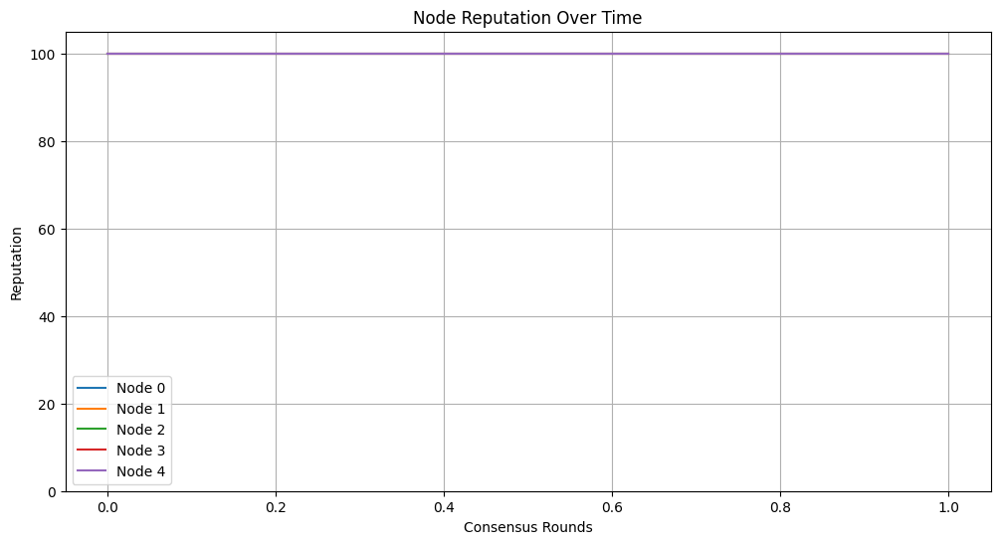


Leader Performance Summary:
Node 2:
 Times as leader: 1
 Average Latency: 0.080235 seconds
 Average Throughput: 199.42 tweets per second
 Average Reputation: 92.44
 Total Malicious Detections: 0


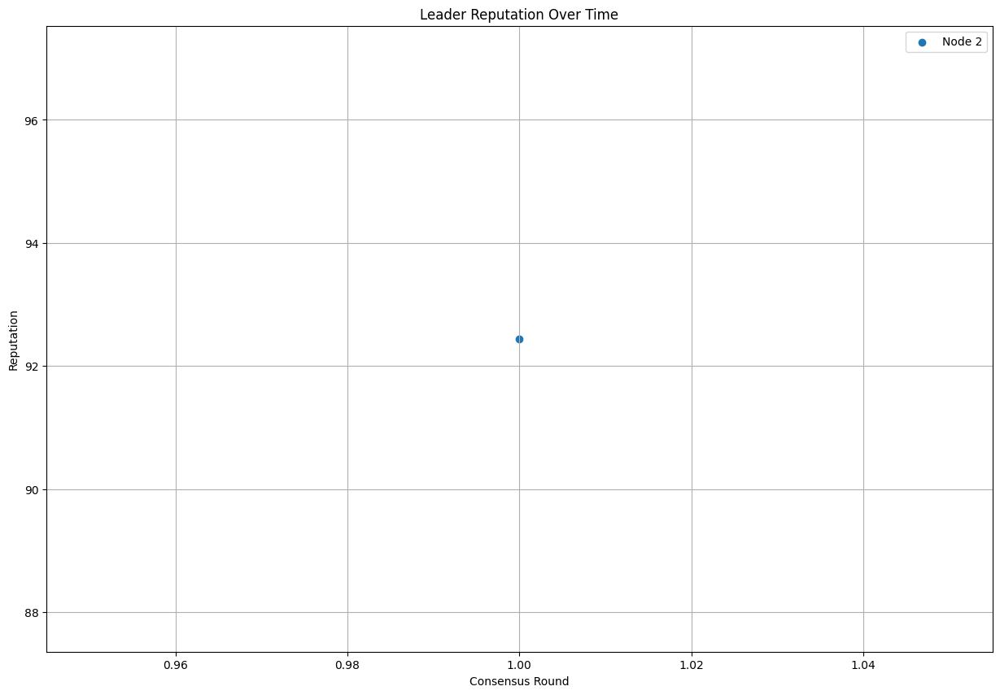


--- Consensus Round 2 ---

Primary Node for this round: Node 0
Primary Node Reputation: 100
Primary Node Malicious Count: 0
Node 0 generates proof: 6893e3e3cc74286bb80b25d7f3b1313a8dd15c499ba1a693ff89125f571c00a4
Node 1 verifies proof: 6893e3e3cc74286bb80b25d7f3b1313a8dd15c499ba1a693ff89125f571c00a4 against expected: 6893e3e3cc74286bb80b25d7f3b1313a8dd15c499ba1a693ff89125f571c00a4
Validation time: 0.000011 seconds
Node 2 verifies proof: 6893e3e3cc74286bb80b25d7f3b1313a8dd15c499ba1a693ff89125f571c00a4 against expected: 6893e3e3cc74286bb80b25d7f3b1313a8dd15c499ba1a693ff89125f571c00a4
Validation time: 0.000010 seconds
Node 3 verifies proof: 6893e3e3cc74286bb80b25d7f3b1313a8dd15c499ba1a693ff89125f571c00a4 against expected: 6893e3e3cc74286bb80b25d7f3b1313a8dd15c499ba1a693ff89125f571c00a4
Validation time: 0.000006 seconds
Node 4 verifies proof: 6893e3e3cc74286bb80b25d7f3b1313a8dd15c499ba1a693ff89125f571c00a4 against expected: 6893e3e3cc74286bb80b25d7f3b1313a8dd15c499ba1a693ff89125f571c00a4


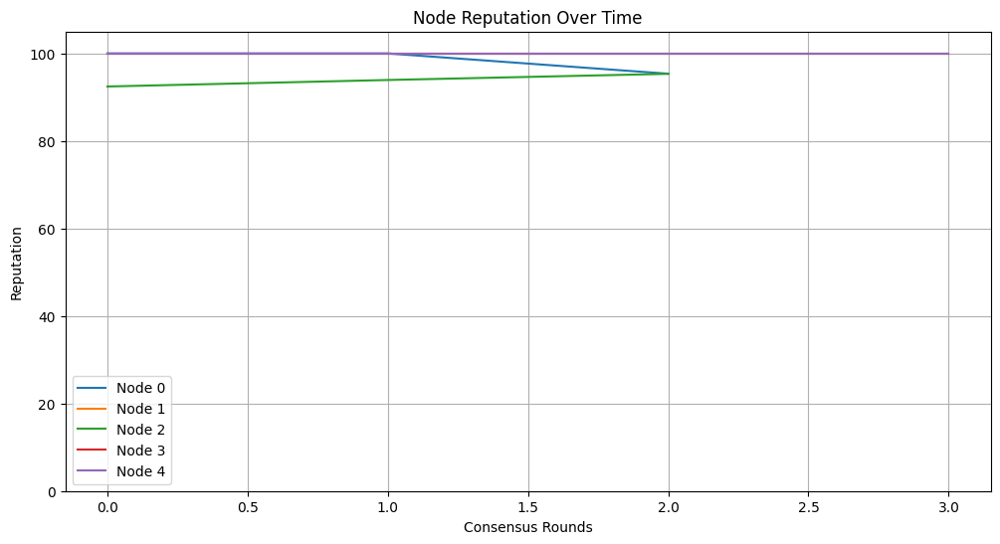


Leader Performance Summary:
Node 2:
 Times as leader: 1
 Average Latency: 0.080235 seconds
 Average Throughput: 199.42 tweets per second
 Average Reputation: 92.44
 Total Malicious Detections: 0
Node 0:
 Times as leader: 1
 Average Latency: 0.093432 seconds
 Average Throughput: 171.25 tweets per second
 Average Reputation: 95.36
 Total Malicious Detections: 0


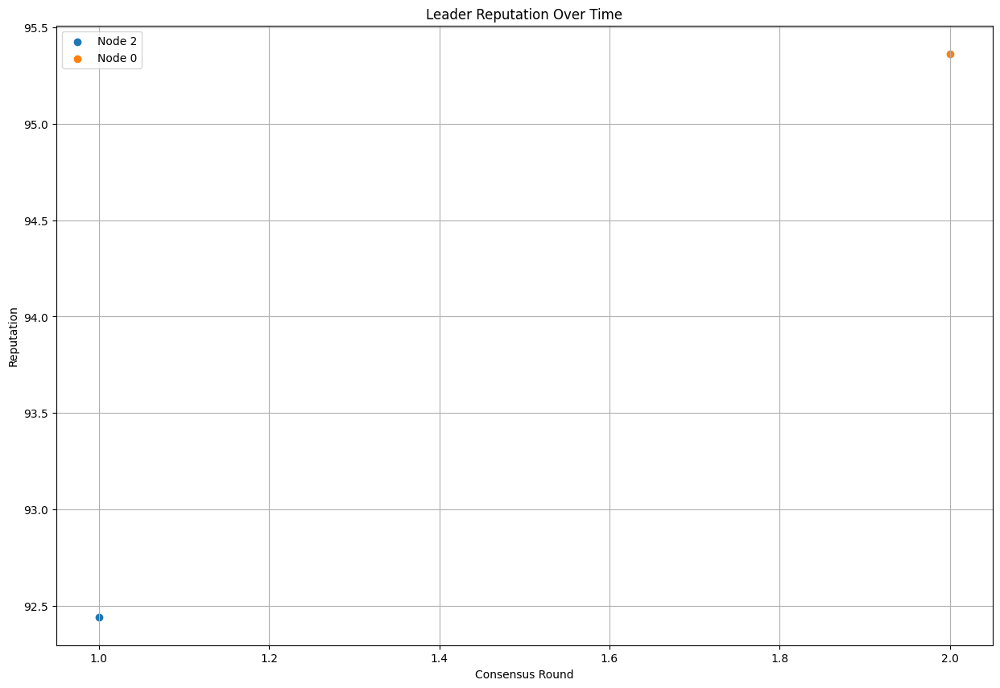


--- Consensus Round 3 ---

Primary Node for this round: Node 4
Primary Node Reputation: 100
Primary Node Malicious Count: 0
Node 4 generates proof: f5d73377d945f29a5967ad0b6d821352738de6dd332c0f3a900baaf73440af50
Node 0 verifies proof: f5d73377d945f29a5967ad0b6d821352738de6dd332c0f3a900baaf73440af50 against expected: f5d73377d945f29a5967ad0b6d821352738de6dd332c0f3a900baaf73440af50
Validation time: 0.000040 seconds
Node 1 verifies proof: f5d73377d945f29a5967ad0b6d821352738de6dd332c0f3a900baaf73440af50 against expected: f5d73377d945f29a5967ad0b6d821352738de6dd332c0f3a900baaf73440af50
Validation time: 0.000011 seconds
Node 2 verifies proof: f5d73377d945f29a5967ad0b6d821352738de6dd332c0f3a900baaf73440af50 against expected: f5d73377d945f29a5967ad0b6d821352738de6dd332c0f3a900baaf73440af50
Validation time: 0.000016 seconds
Node 3 verifies proof: f5d73377d945f29a5967ad0b6d821352738de6dd332c0f3a900baaf73440af50 against expected: f5d73377d945f29a5967ad0b6d821352738de6dd332c0f3a900baaf73440af50


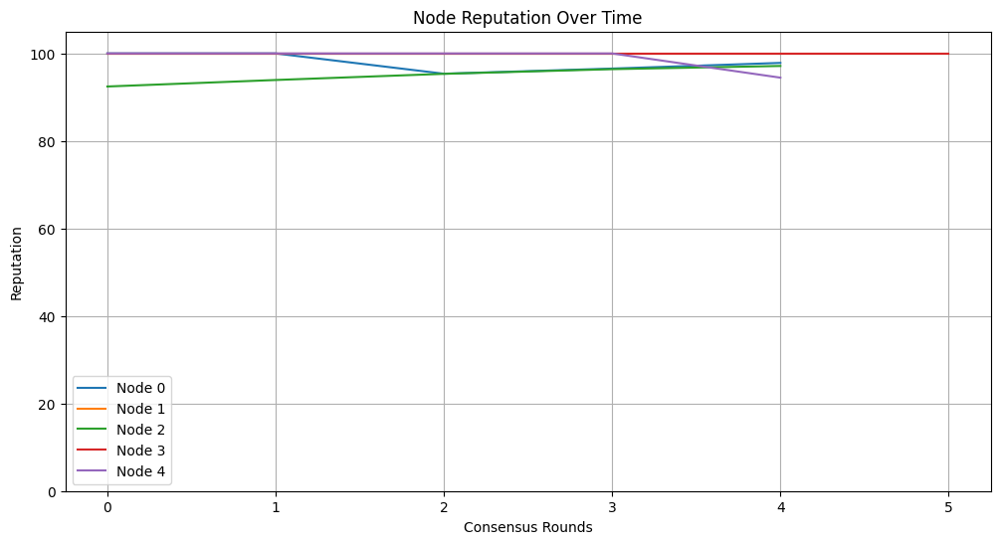


Leader Performance Summary:
Node 2:
 Times as leader: 1
 Average Latency: 0.080235 seconds
 Average Throughput: 199.42 tweets per second
 Average Reputation: 92.44
 Total Malicious Detections: 0
Node 0:
 Times as leader: 1
 Average Latency: 0.093432 seconds
 Average Throughput: 171.25 tweets per second
 Average Reputation: 95.36
 Total Malicious Detections: 0
Node 4:
 Times as leader: 1
 Average Latency: 0.113167 seconds
 Average Throughput: 141.38 tweets per second
 Average Reputation: 94.46
 Total Malicious Detections: 0


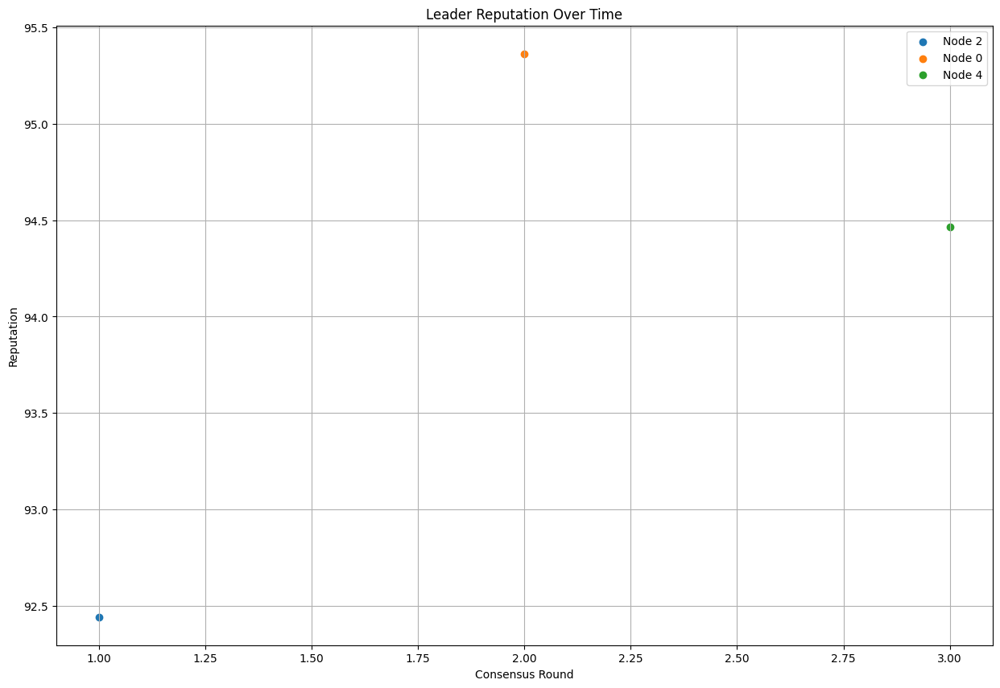


--- Consensus Round 4 ---

Primary Node for this round: Node 1
Primary Node Reputation: 100
Primary Node Malicious Count: 0
Node 1 generates proof: d9086e6074f5cc5f9cd1e679337b79c53244746040b454b1f41339c75a38a823
Node 0 verifies proof: d9086e6074f5cc5f9cd1e679337b79c53244746040b454b1f41339c75a38a823 against expected: d9086e6074f5cc5f9cd1e679337b79c53244746040b454b1f41339c75a38a823
Validation time: 0.000033 seconds
Node 2 verifies proof: d9086e6074f5cc5f9cd1e679337b79c53244746040b454b1f41339c75a38a823 against expected: d9086e6074f5cc5f9cd1e679337b79c53244746040b454b1f41339c75a38a823
Validation time: 0.000030 seconds
Node 3 verifies proof: d9086e6074f5cc5f9cd1e679337b79c53244746040b454b1f41339c75a38a823 against expected: d9086e6074f5cc5f9cd1e679337b79c53244746040b454b1f41339c75a38a823
Validation time: 0.000023 seconds
Node 4 verifies proof: d9086e6074f5cc5f9cd1e679337b79c53244746040b454b1f41339c75a38a823 against expected: d9086e6074f5cc5f9cd1e679337b79c53244746040b454b1f41339c75a38a823


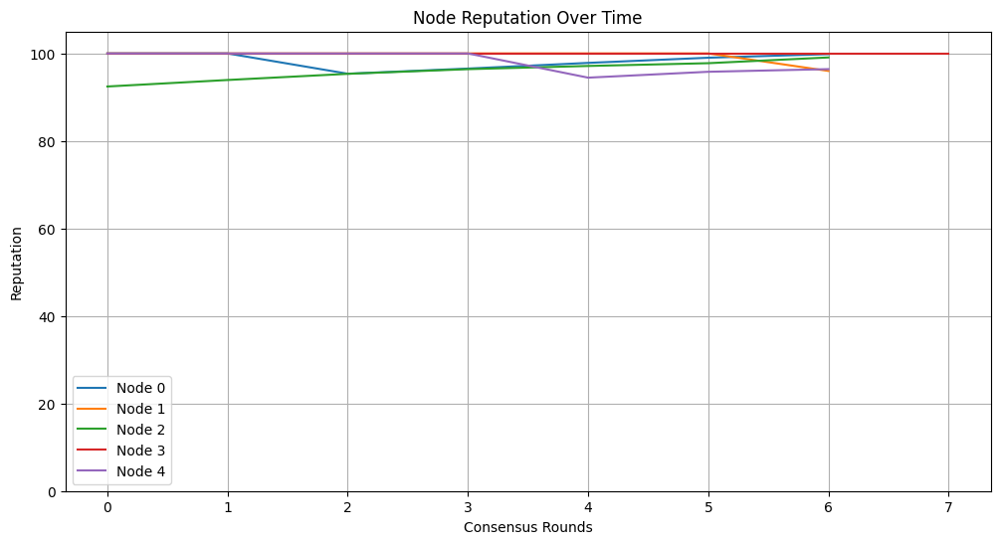


Leader Performance Summary:
Node 2:
 Times as leader: 1
 Average Latency: 0.080235 seconds
 Average Throughput: 199.42 tweets per second
 Average Reputation: 92.44
 Total Malicious Detections: 0
Node 0:
 Times as leader: 1
 Average Latency: 0.093432 seconds
 Average Throughput: 171.25 tweets per second
 Average Reputation: 95.36
 Total Malicious Detections: 0
Node 4:
 Times as leader: 1
 Average Latency: 0.113167 seconds
 Average Throughput: 141.38 tweets per second
 Average Reputation: 94.46
 Total Malicious Detections: 0
Node 1:
 Times as leader: 1
 Average Latency: 0.066438 seconds
 Average Throughput: 240.83 tweets per second
 Average Reputation: 96.00
 Total Malicious Detections: 0


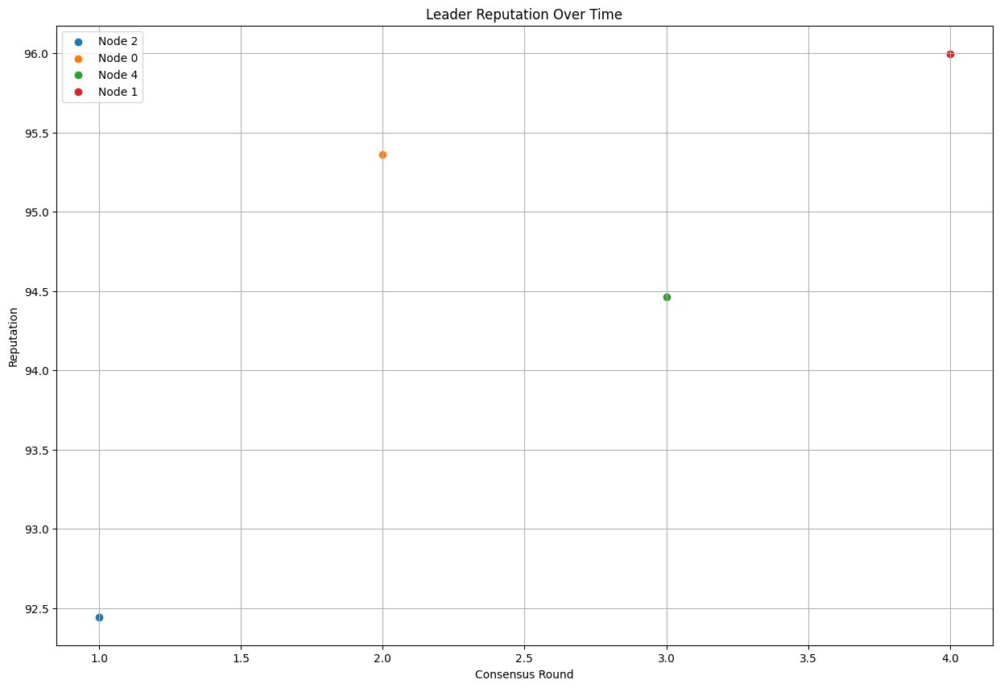


--- Consensus Round 5 ---

Primary Node for this round: Node 4
Primary Node Reputation: 96.41080426934879
Primary Node Malicious Count: 0
Node 4 generates proof: fdc8a09c7760146af935d94e2e04ab9eb846c33771c3bd78cf4d584ae9d64b40
Node 0 verifies proof: fdc8a09c7760146af935d94e2e04ab9eb846c33771c3bd78cf4d584ae9d64b40 against expected: fdc8a09c7760146af935d94e2e04ab9eb846c33771c3bd78cf4d584ae9d64b40
Validation time: 0.000050 seconds
Node 1 verifies proof: fdc8a09c7760146af935d94e2e04ab9eb846c33771c3bd78cf4d584ae9d64b40 against expected: fdc8a09c7760146af935d94e2e04ab9eb846c33771c3bd78cf4d584ae9d64b40
Validation time: 0.000023 seconds
Node 2 verifies proof: fdc8a09c7760146af935d94e2e04ab9eb846c33771c3bd78cf4d584ae9d64b40 against expected: fdc8a09c7760146af935d94e2e04ab9eb846c33771c3bd78cf4d584ae9d64b40
Validation time: 0.000021 seconds
Node 3 verifies proof: fdc8a09c7760146af935d94e2e04ab9eb846c33771c3bd78cf4d584ae9d64b40 against expected: fdc8a09c7760146af935d94e2e04ab9eb846c33771c3bd78cf4

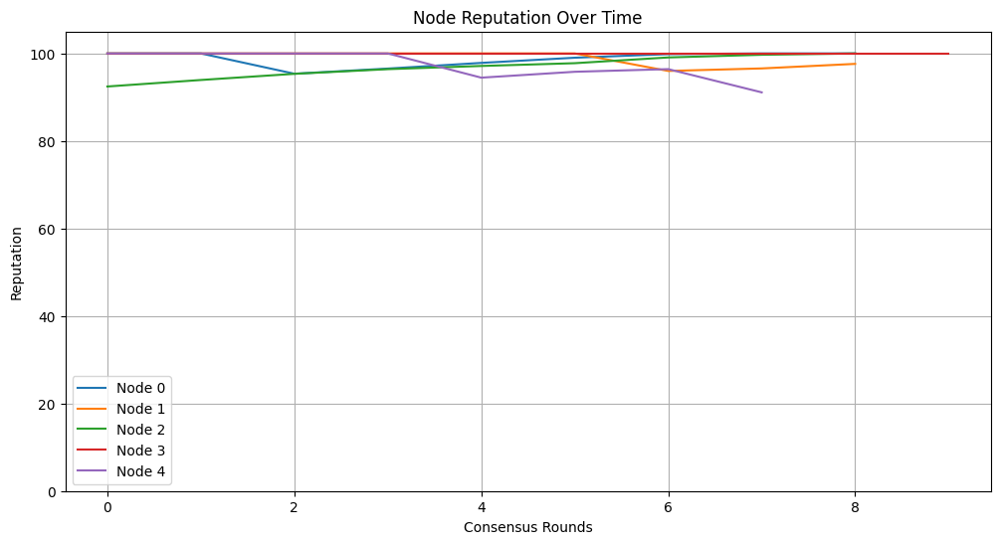


Leader Performance Summary:
Node 2:
 Times as leader: 1
 Average Latency: 0.080235 seconds
 Average Throughput: 199.42 tweets per second
 Average Reputation: 92.44
 Total Malicious Detections: 0
Node 0:
 Times as leader: 1
 Average Latency: 0.093432 seconds
 Average Throughput: 171.25 tweets per second
 Average Reputation: 95.36
 Total Malicious Detections: 0
Node 4:
 Times as leader: 2
 Average Latency: 0.088763 seconds
 Average Throughput: 195.00 tweets per second
 Average Reputation: 92.78
 Total Malicious Detections: 0
Node 1:
 Times as leader: 1
 Average Latency: 0.066438 seconds
 Average Throughput: 240.83 tweets per second
 Average Reputation: 96.00
 Total Malicious Detections: 0


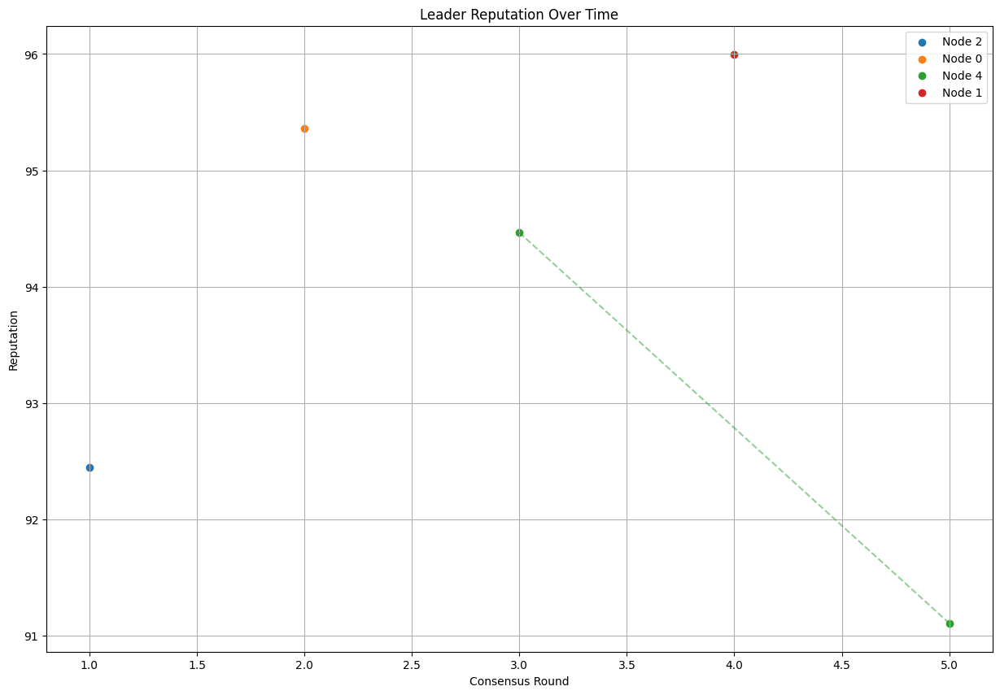


--- Consensus Round 6 ---

Primary Node for this round: Node 0
Primary Node Reputation: 100
Primary Node Malicious Count: 0
Node 0 generates proof: aa1030f4591e74ec5ed12c7bb019f626fd50415cc75b9bf6ba4ab0957bdd0bd0
Node 1 verifies proof: aa1030f4591e74ec5ed12c7bb019f626fd50415cc75b9bf6ba4ab0957bdd0bd0 against expected: aa1030f4591e74ec5ed12c7bb019f626fd50415cc75b9bf6ba4ab0957bdd0bd0
Validation time: 0.000045 seconds
Node 2 verifies proof: aa1030f4591e74ec5ed12c7bb019f626fd50415cc75b9bf6ba4ab0957bdd0bd0 against expected: aa1030f4591e74ec5ed12c7bb019f626fd50415cc75b9bf6ba4ab0957bdd0bd0
Validation time: 0.000012 seconds
Node 3 verifies proof: aa1030f4591e74ec5ed12c7bb019f626fd50415cc75b9bf6ba4ab0957bdd0bd0 against expected: aa1030f4591e74ec5ed12c7bb019f626fd50415cc75b9bf6ba4ab0957bdd0bd0
Validation time: 0.000007 seconds
Node 4 verifies proof: aa1030f4591e74ec5ed12c7bb019f626fd50415cc75b9bf6ba4ab0957bdd0bd0 against expected: aa1030f4591e74ec5ed12c7bb019f626fd50415cc75b9bf6ba4ab0957bdd0bd0


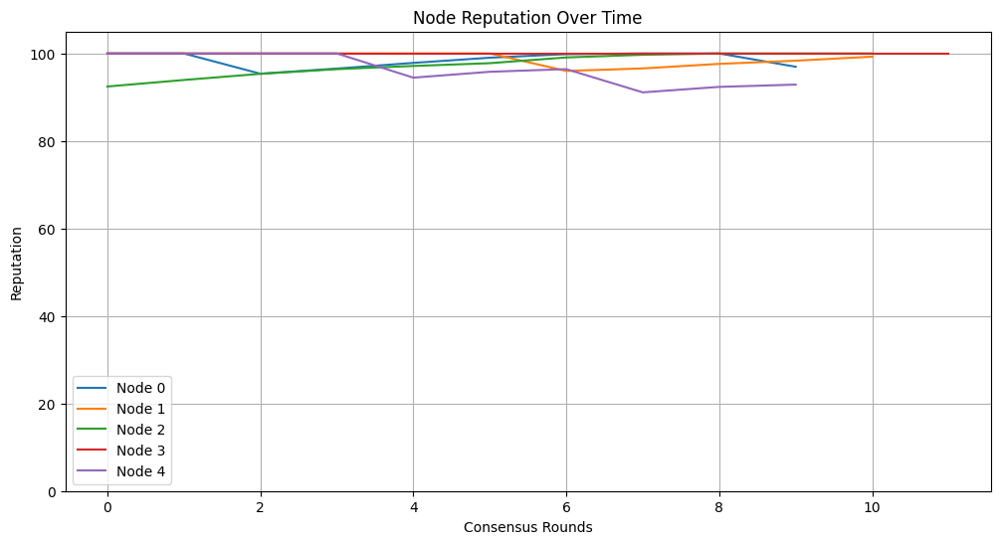


Leader Performance Summary:
Node 2:
 Times as leader: 1
 Average Latency: 0.080235 seconds
 Average Throughput: 199.42 tweets per second
 Average Reputation: 92.44
 Total Malicious Detections: 0
Node 0:
 Times as leader: 2
 Average Latency: 0.090318 seconds
 Average Throughput: 177.36 tweets per second
 Average Reputation: 96.16
 Total Malicious Detections: 0
Node 4:
 Times as leader: 2
 Average Latency: 0.088763 seconds
 Average Throughput: 195.00 tweets per second
 Average Reputation: 92.78
 Total Malicious Detections: 0
Node 1:
 Times as leader: 1
 Average Latency: 0.066438 seconds
 Average Throughput: 240.83 tweets per second
 Average Reputation: 96.00
 Total Malicious Detections: 0


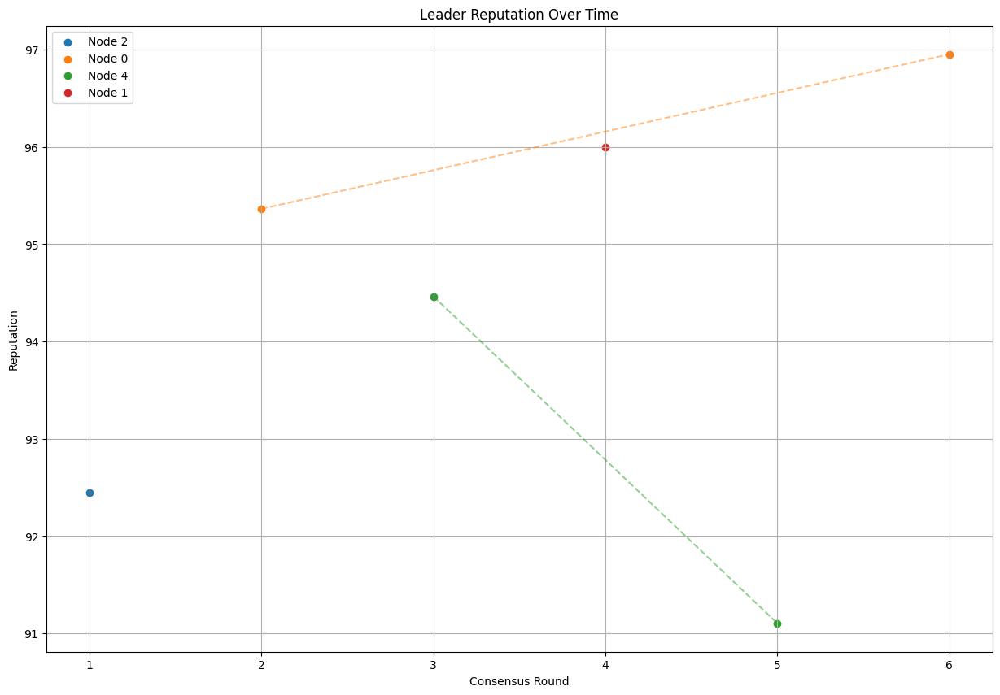


--- Consensus Round 7 ---

Primary Node for this round: Node 1
Primary Node Reputation: 99.2594973588532
Primary Node Malicious Count: 0
Node 1 generates proof: 693a7d5949639006ecd2c6317ed98e51ec38e5a1ad5f4d5e8ddafbbb90efd9a5
Node 0 verifies proof: 693a7d5949639006ecd2c6317ed98e51ec38e5a1ad5f4d5e8ddafbbb90efd9a5 against expected: 693a7d5949639006ecd2c6317ed98e51ec38e5a1ad5f4d5e8ddafbbb90efd9a5
Validation time: 0.000014 seconds
Node 2 verifies proof: 693a7d5949639006ecd2c6317ed98e51ec38e5a1ad5f4d5e8ddafbbb90efd9a5 against expected: 693a7d5949639006ecd2c6317ed98e51ec38e5a1ad5f4d5e8ddafbbb90efd9a5
Validation time: 0.000014 seconds
Node 3 verifies proof: 693a7d5949639006ecd2c6317ed98e51ec38e5a1ad5f4d5e8ddafbbb90efd9a5 against expected: 693a7d5949639006ecd2c6317ed98e51ec38e5a1ad5f4d5e8ddafbbb90efd9a5
Validation time: 0.000013 seconds
Node 4 verifies proof: 693a7d5949639006ecd2c6317ed98e51ec38e5a1ad5f4d5e8ddafbbb90efd9a5 against expected: 693a7d5949639006ecd2c6317ed98e51ec38e5a1ad5f4d5e8dda

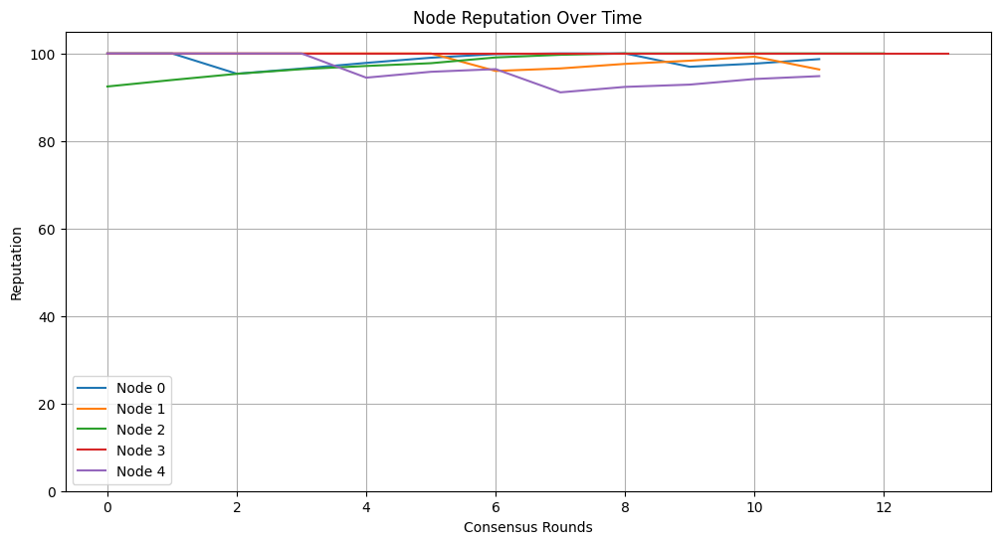


Leader Performance Summary:
Node 2:
 Times as leader: 1
 Average Latency: 0.080235 seconds
 Average Throughput: 199.42 tweets per second
 Average Reputation: 92.44
 Total Malicious Detections: 0
Node 0:
 Times as leader: 2
 Average Latency: 0.090318 seconds
 Average Throughput: 177.36 tweets per second
 Average Reputation: 96.16
 Total Malicious Detections: 0
Node 4:
 Times as leader: 2
 Average Latency: 0.088763 seconds
 Average Throughput: 195.00 tweets per second
 Average Reputation: 92.78
 Total Malicious Detections: 0
Node 1:
 Times as leader: 2
 Average Latency: 0.050570 seconds
 Average Throughput: 350.95 tweets per second
 Average Reputation: 96.17
 Total Malicious Detections: 0


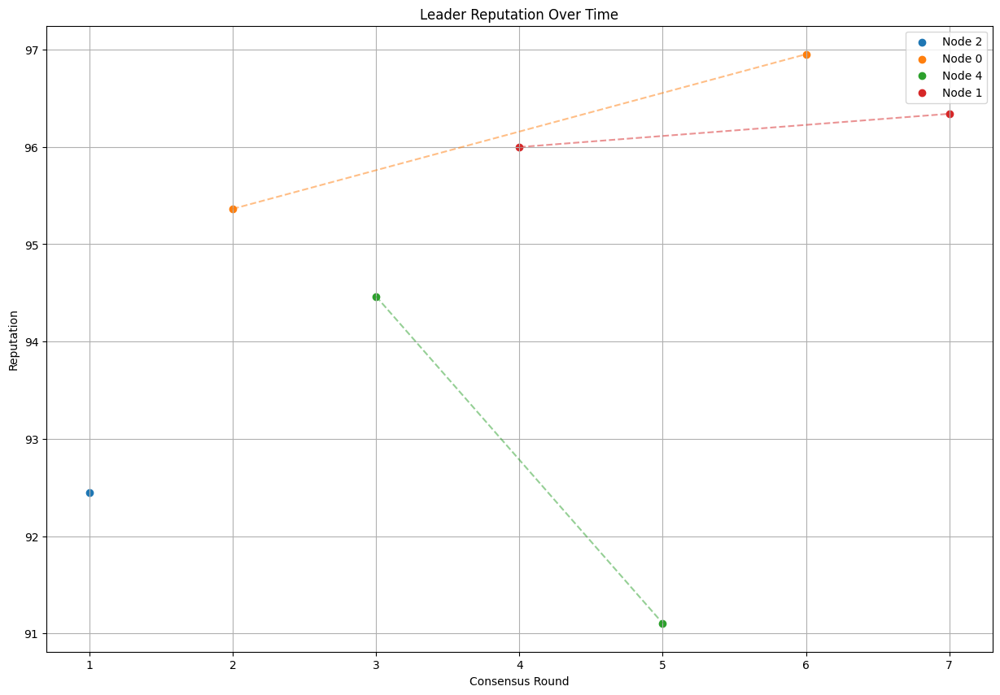


--- Consensus Round 8 ---

Primary Node for this round: Node 3
Primary Node Reputation: 100
Primary Node Malicious Count: 0
Node 3 generates proof: b8032d7546e0e7989f9dbc1d189f9eb0a26567dfb2809f9c3c50b3d4f667bb48
Node 0 verifies proof: b8032d7546e0e7989f9dbc1d189f9eb0a26567dfb2809f9c3c50b3d4f667bb48 against expected: b8032d7546e0e7989f9dbc1d189f9eb0a26567dfb2809f9c3c50b3d4f667bb48
Validation time: 0.000010 seconds
Node 1 verifies proof: b8032d7546e0e7989f9dbc1d189f9eb0a26567dfb2809f9c3c50b3d4f667bb48 against expected: b8032d7546e0e7989f9dbc1d189f9eb0a26567dfb2809f9c3c50b3d4f667bb48
Validation time: 0.000007 seconds
Node 2 verifies proof: b8032d7546e0e7989f9dbc1d189f9eb0a26567dfb2809f9c3c50b3d4f667bb48 against expected: b8032d7546e0e7989f9dbc1d189f9eb0a26567dfb2809f9c3c50b3d4f667bb48
Validation time: 0.000030 seconds
Node 4 verifies proof: b8032d7546e0e7989f9dbc1d189f9eb0a26567dfb2809f9c3c50b3d4f667bb48 against expected: b8032d7546e0e7989f9dbc1d189f9eb0a26567dfb2809f9c3c50b3d4f667bb48


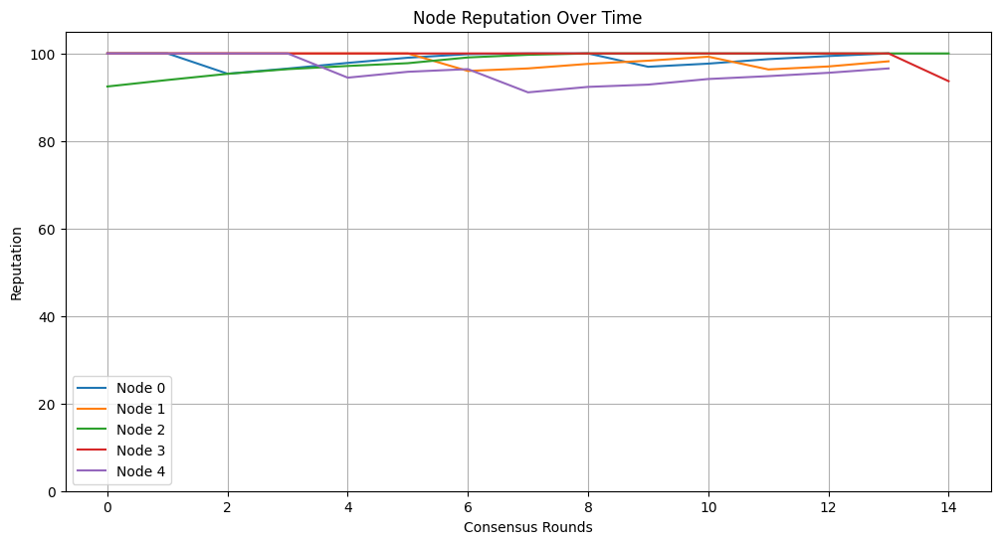


Leader Performance Summary:
Node 2:
 Times as leader: 1
 Average Latency: 0.080235 seconds
 Average Throughput: 199.42 tweets per second
 Average Reputation: 92.44
 Total Malicious Detections: 0
Node 0:
 Times as leader: 2
 Average Latency: 0.090318 seconds
 Average Throughput: 177.36 tweets per second
 Average Reputation: 96.16
 Total Malicious Detections: 0
Node 4:
 Times as leader: 2
 Average Latency: 0.088763 seconds
 Average Throughput: 195.00 tweets per second
 Average Reputation: 92.78
 Total Malicious Detections: 0
Node 1:
 Times as leader: 2
 Average Latency: 0.050570 seconds
 Average Throughput: 350.95 tweets per second
 Average Reputation: 96.17
 Total Malicious Detections: 0
Node 3:
 Times as leader: 1
 Average Latency: 0.034872 seconds
 Average Throughput: 458.83 tweets per second
 Average Reputation: 93.66
 Total Malicious Detections: 0


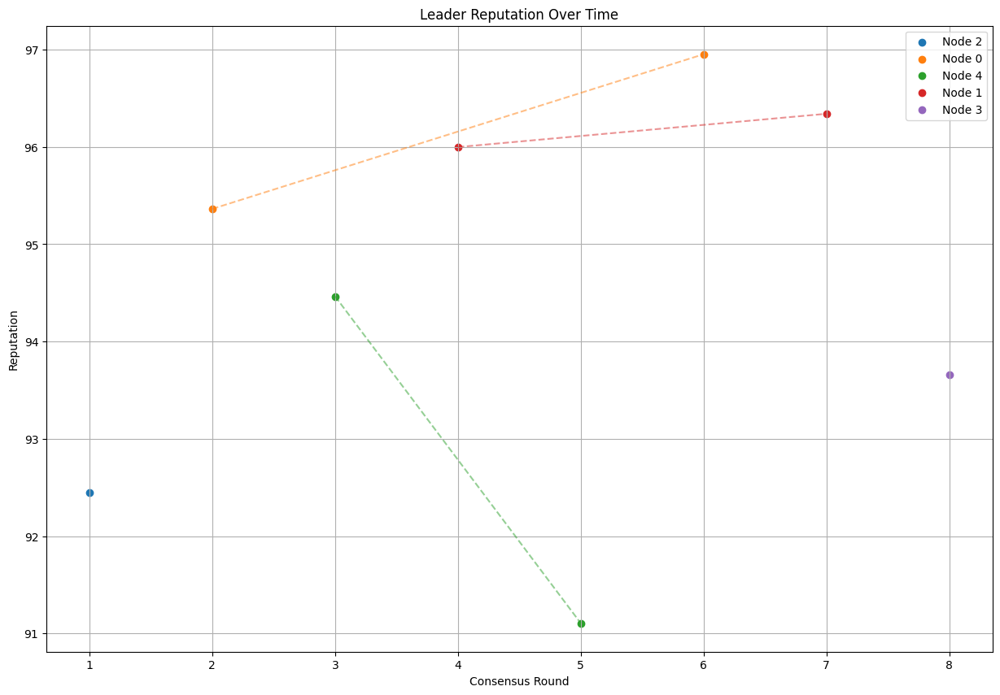


--- Consensus Round 9 ---

Primary Node for this round: Node 0
Primary Node Reputation: 100
Primary Node Malicious Count: 0
Node 0 generates proof: e3395d952369a440433f6bc00004a2d54d7f9e450f8343138d13276897156cd3
Node 1 verifies proof: e3395d952369a440433f6bc00004a2d54d7f9e450f8343138d13276897156cd3 against expected: e3395d952369a440433f6bc00004a2d54d7f9e450f8343138d13276897156cd3
Validation time: 0.000011 seconds
Node 2 verifies proof: e3395d952369a440433f6bc00004a2d54d7f9e450f8343138d13276897156cd3 against expected: e3395d952369a440433f6bc00004a2d54d7f9e450f8343138d13276897156cd3
Validation time: 0.000008 seconds
Node 3 verifies proof: e3395d952369a440433f6bc00004a2d54d7f9e450f8343138d13276897156cd3 against expected: e3395d952369a440433f6bc00004a2d54d7f9e450f8343138d13276897156cd3
Validation time: 0.000010 seconds
Node 4 verifies proof: e3395d952369a440433f6bc00004a2d54d7f9e450f8343138d13276897156cd3 against expected: e3395d952369a440433f6bc00004a2d54d7f9e450f8343138d13276897156cd3


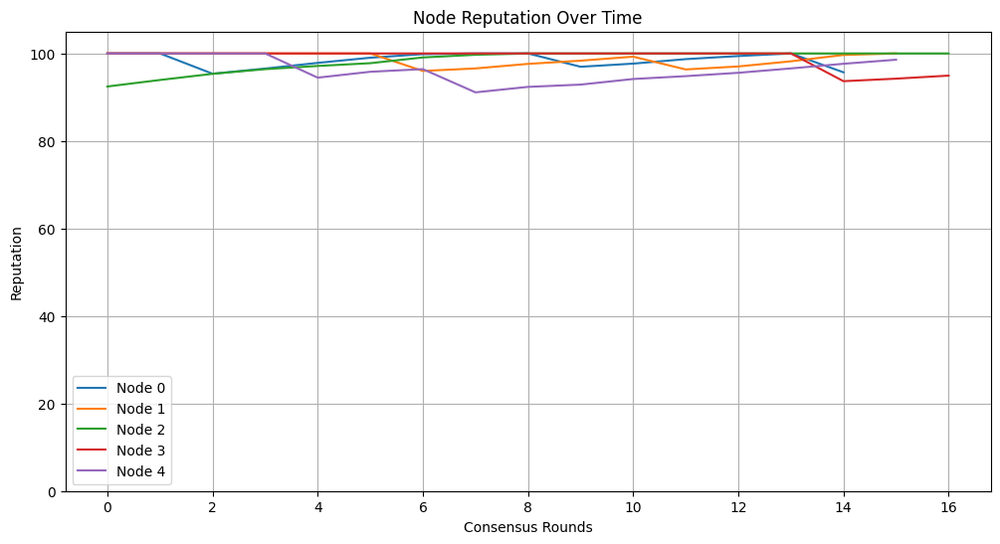


Leader Performance Summary:
Node 2:
 Times as leader: 1
 Average Latency: 0.080235 seconds
 Average Throughput: 199.42 tweets per second
 Average Reputation: 92.44
 Total Malicious Detections: 0
Node 0:
 Times as leader: 3
 Average Latency: 0.071225 seconds
 Average Throughput: 279.66 tweets per second
 Average Reputation: 96.00
 Total Malicious Detections: 0
Node 4:
 Times as leader: 2
 Average Latency: 0.088763 seconds
 Average Throughput: 195.00 tweets per second
 Average Reputation: 92.78
 Total Malicious Detections: 0
Node 1:
 Times as leader: 2
 Average Latency: 0.050570 seconds
 Average Throughput: 350.95 tweets per second
 Average Reputation: 96.17
 Total Malicious Detections: 0
Node 3:
 Times as leader: 1
 Average Latency: 0.034872 seconds
 Average Throughput: 458.83 tweets per second
 Average Reputation: 93.66
 Total Malicious Detections: 0


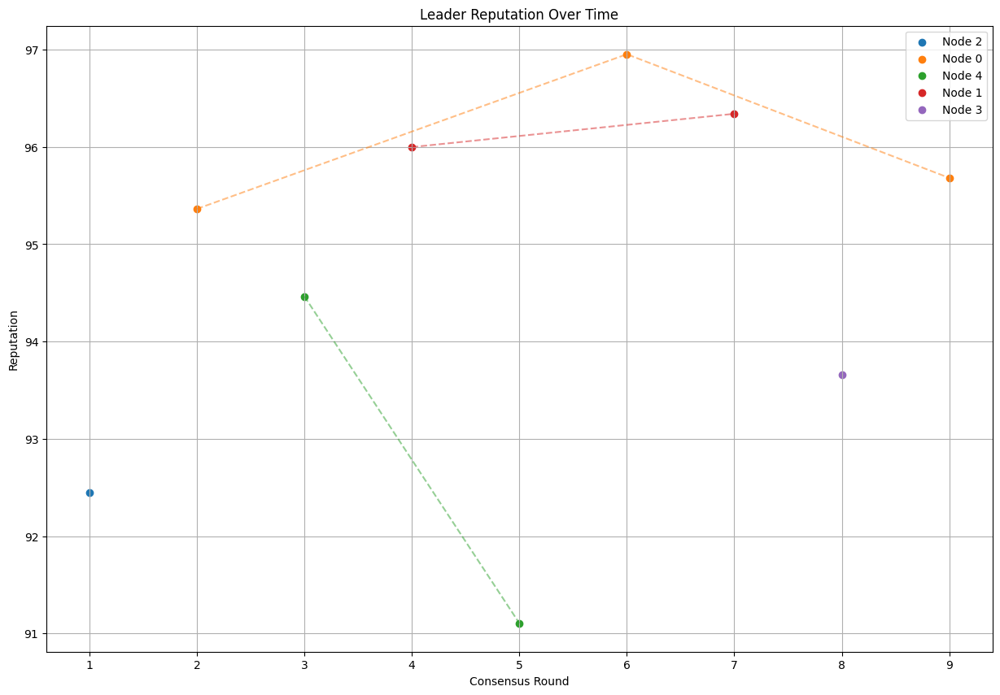


--- Consensus Round 10 ---

Primary Node for this round: Node 0
Primary Node Reputation: 95.6812032734226
Primary Node Malicious Count: 0
Node 0 generates proof: ed1ba9c07503b41ebb8cd8e79074b82239f1d6b807b4c246a3f6351a10c03801
Node 1 verifies proof: ed1ba9c07503b41ebb8cd8e79074b82239f1d6b807b4c246a3f6351a10c03801 against expected: ed1ba9c07503b41ebb8cd8e79074b82239f1d6b807b4c246a3f6351a10c03801
Validation time: 0.000008 seconds
Node 2 verifies proof: ed1ba9c07503b41ebb8cd8e79074b82239f1d6b807b4c246a3f6351a10c03801 against expected: ed1ba9c07503b41ebb8cd8e79074b82239f1d6b807b4c246a3f6351a10c03801
Validation time: 0.000008 seconds
Node 3 verifies proof: ed1ba9c07503b41ebb8cd8e79074b82239f1d6b807b4c246a3f6351a10c03801 against expected: ed1ba9c07503b41ebb8cd8e79074b82239f1d6b807b4c246a3f6351a10c03801
Validation time: 0.000007 seconds
Node 4 verifies proof: ed1ba9c07503b41ebb8cd8e79074b82239f1d6b807b4c246a3f6351a10c03801 against expected: ed1ba9c07503b41ebb8cd8e79074b82239f1d6b807b4c246a3f

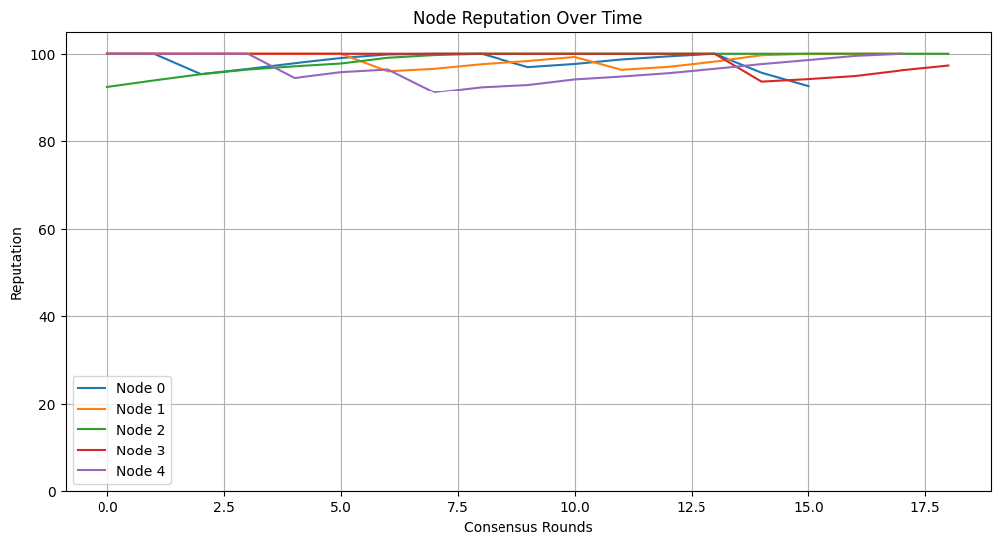


Leader Performance Summary:
Node 2:
 Times as leader: 1
 Average Latency: 0.080235 seconds
 Average Throughput: 199.42 tweets per second
 Average Reputation: 92.44
 Total Malicious Detections: 0
Node 0:
 Times as leader: 4
 Average Latency: 0.058999 seconds
 Average Throughput: 388.94 tweets per second
 Average Reputation: 95.16
 Total Malicious Detections: 0
Node 4:
 Times as leader: 2
 Average Latency: 0.088763 seconds
 Average Throughput: 195.00 tweets per second
 Average Reputation: 92.78
 Total Malicious Detections: 0
Node 1:
 Times as leader: 2
 Average Latency: 0.050570 seconds
 Average Throughput: 350.95 tweets per second
 Average Reputation: 96.17
 Total Malicious Detections: 0
Node 3:
 Times as leader: 1
 Average Latency: 0.034872 seconds
 Average Throughput: 458.83 tweets per second
 Average Reputation: 93.66
 Total Malicious Detections: 0


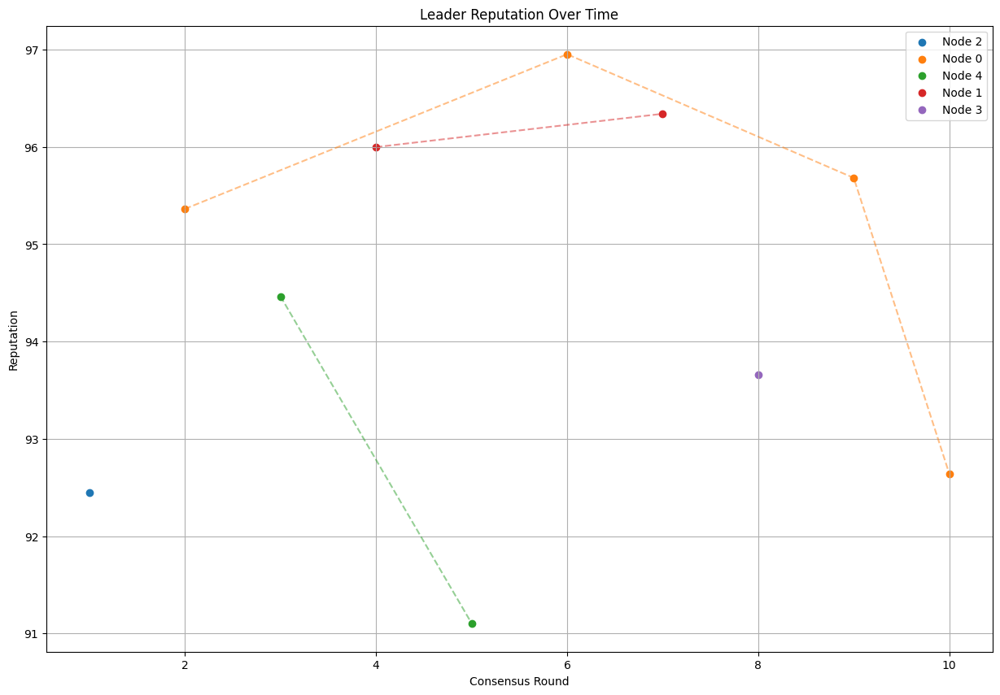


--- Consensus Round 11 ---

Primary Node for this round: Node 3
Primary Node Reputation: 97.31961139377965
Primary Node Malicious Count: 0
Node 3 generates proof: b534115c41df74586fdf8c00d2b2a178f2bdefc6cf254e652b0a91fdb1c4e712
Node 0 verifies proof: b534115c41df74586fdf8c00d2b2a178f2bdefc6cf254e652b0a91fdb1c4e712 against expected: b534115c41df74586fdf8c00d2b2a178f2bdefc6cf254e652b0a91fdb1c4e712
Validation time: 0.000022 seconds
Node 1 verifies proof: b534115c41df74586fdf8c00d2b2a178f2bdefc6cf254e652b0a91fdb1c4e712 against expected: b534115c41df74586fdf8c00d2b2a178f2bdefc6cf254e652b0a91fdb1c4e712
Validation time: 0.000017 seconds
Node 2 verifies proof: b534115c41df74586fdf8c00d2b2a178f2bdefc6cf254e652b0a91fdb1c4e712 against expected: b534115c41df74586fdf8c00d2b2a178f2bdefc6cf254e652b0a91fdb1c4e712
Validation time: 0.000015 seconds
Node 4 verifies proof: b534115c41df74586fdf8c00d2b2a178f2bdefc6cf254e652b0a91fdb1c4e712 against expected: b534115c41df74586fdf8c00d2b2a178f2bdefc6cf254e652b

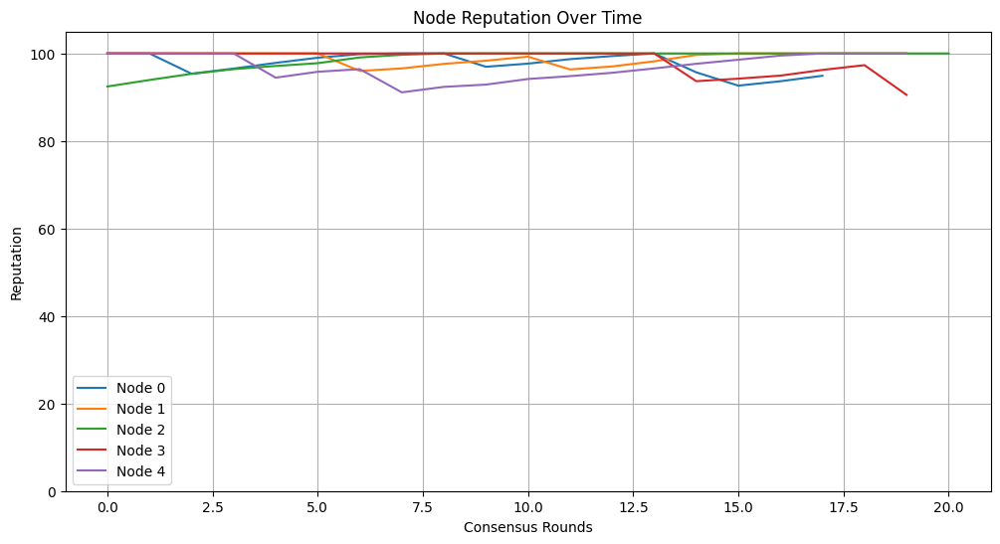


Leader Performance Summary:
Node 2:
 Times as leader: 1
 Average Latency: 0.080235 seconds
 Average Throughput: 199.42 tweets per second
 Average Reputation: 92.44
 Total Malicious Detections: 0
Node 0:
 Times as leader: 4
 Average Latency: 0.058999 seconds
 Average Throughput: 388.94 tweets per second
 Average Reputation: 95.16
 Total Malicious Detections: 0
Node 4:
 Times as leader: 2
 Average Latency: 0.088763 seconds
 Average Throughput: 195.00 tweets per second
 Average Reputation: 92.78
 Total Malicious Detections: 0
Node 1:
 Times as leader: 2
 Average Latency: 0.050570 seconds
 Average Throughput: 350.95 tweets per second
 Average Reputation: 96.17
 Total Malicious Detections: 0
Node 3:
 Times as leader: 2
 Average Latency: 0.037613 seconds
 Average Throughput: 427.66 tweets per second
 Average Reputation: 92.09
 Total Malicious Detections: 0


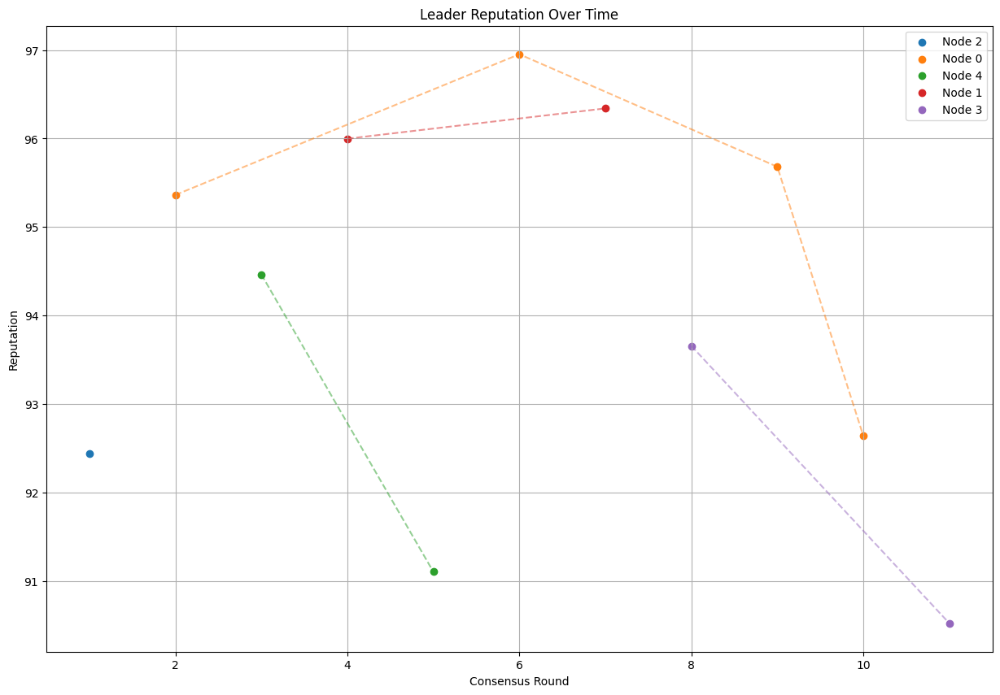


--- Consensus Round 12 ---

Primary Node for this round: Node 1
Primary Node Reputation: 100
Primary Node Malicious Count: 0
Node 1 generates proof: e1a6655115578ed10180ff17d36725a9717a42783f1579d96d9e46fb082d7540
Node 0 verifies proof: e1a6655115578ed10180ff17d36725a9717a42783f1579d96d9e46fb082d7540 against expected: e1a6655115578ed10180ff17d36725a9717a42783f1579d96d9e46fb082d7540
Validation time: 0.000031 seconds
Node 2 verifies proof: e1a6655115578ed10180ff17d36725a9717a42783f1579d96d9e46fb082d7540 against expected: e1a6655115578ed10180ff17d36725a9717a42783f1579d96d9e46fb082d7540
Validation time: 0.000036 seconds
Node 3 verifies proof: e1a6655115578ed10180ff17d36725a9717a42783f1579d96d9e46fb082d7540 against expected: e1a6655115578ed10180ff17d36725a9717a42783f1579d96d9e46fb082d7540
Validation time: 0.000027 seconds
Node 4 verifies proof: e1a6655115578ed10180ff17d36725a9717a42783f1579d96d9e46fb082d7540 against expected: e1a6655115578ed10180ff17d36725a9717a42783f1579d96d9e46fb082d7540

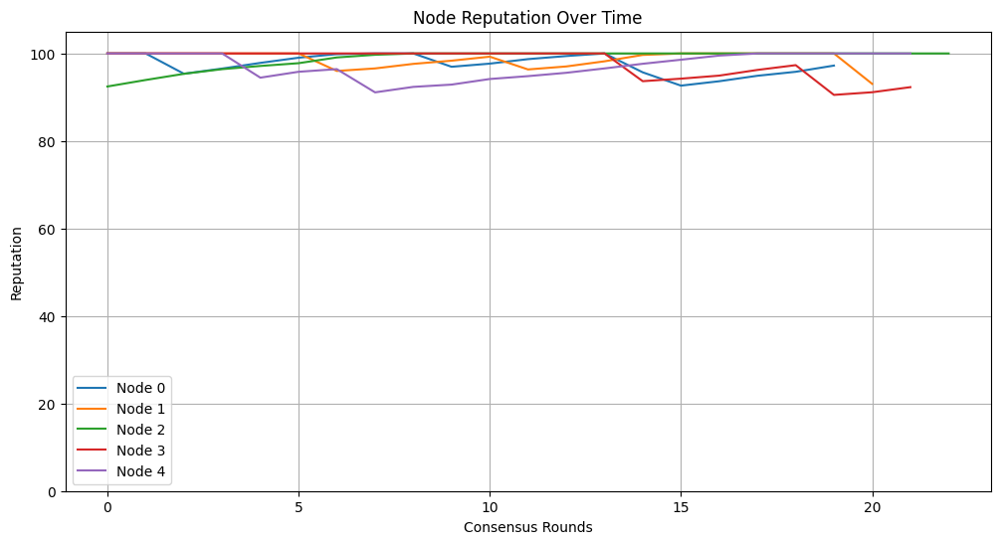


Leader Performance Summary:
Node 2:
 Times as leader: 1
 Average Latency: 0.080235 seconds
 Average Throughput: 199.42 tweets per second
 Average Reputation: 92.44
 Total Malicious Detections: 0
Node 0:
 Times as leader: 4
 Average Latency: 0.058999 seconds
 Average Throughput: 388.94 tweets per second
 Average Reputation: 95.16
 Total Malicious Detections: 0
Node 4:
 Times as leader: 2
 Average Latency: 0.088763 seconds
 Average Throughput: 195.00 tweets per second
 Average Reputation: 92.78
 Total Malicious Detections: 0
Node 1:
 Times as leader: 3
 Average Latency: 0.053658 seconds
 Average Throughput: 323.10 tweets per second
 Average Reputation: 95.13
 Total Malicious Detections: 0
Node 3:
 Times as leader: 2
 Average Latency: 0.037613 seconds
 Average Throughput: 427.66 tweets per second
 Average Reputation: 92.09
 Total Malicious Detections: 0


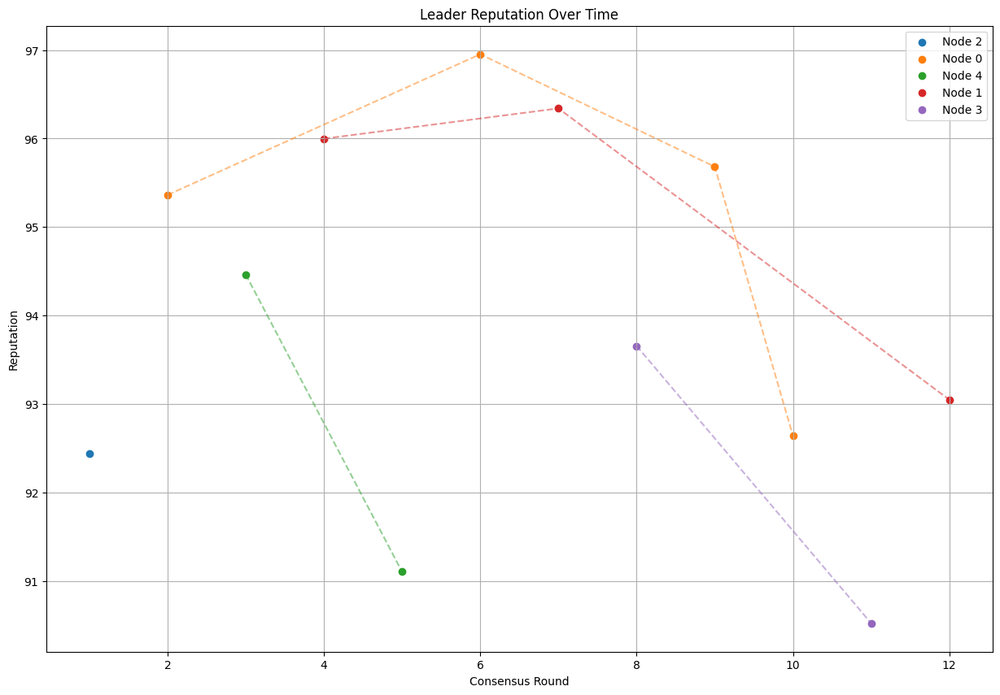


--- Consensus Round 13 ---

Primary Node for this round: Node 4
Primary Node Reputation: 100
Primary Node Malicious Count: 0
Node 4 generates proof: 0d1869b564a23fb942be418afef5789cfe77618ca467b4260c7e517896875897
Node 0 verifies proof: 0d1869b564a23fb942be418afef5789cfe77618ca467b4260c7e517896875897 against expected: 0d1869b564a23fb942be418afef5789cfe77618ca467b4260c7e517896875897
Validation time: 0.000033 seconds
Node 1 verifies proof: 0d1869b564a23fb942be418afef5789cfe77618ca467b4260c7e517896875897 against expected: 0d1869b564a23fb942be418afef5789cfe77618ca467b4260c7e517896875897
Validation time: 0.000023 seconds
Node 2 verifies proof: 0d1869b564a23fb942be418afef5789cfe77618ca467b4260c7e517896875897 against expected: 0d1869b564a23fb942be418afef5789cfe77618ca467b4260c7e517896875897
Validation time: 0.000018 seconds
Node 3 verifies proof: 0d1869b564a23fb942be418afef5789cfe77618ca467b4260c7e517896875897 against expected: 0d1869b564a23fb942be418afef5789cfe77618ca467b4260c7e517896875897

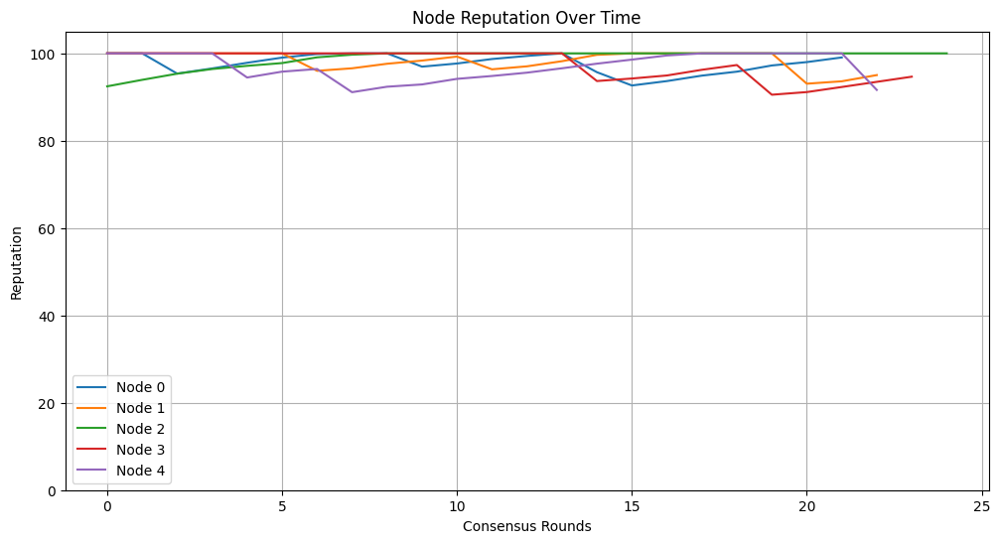


Leader Performance Summary:
Node 2:
 Times as leader: 1
 Average Latency: 0.080235 seconds
 Average Throughput: 199.42 tweets per second
 Average Reputation: 92.44
 Total Malicious Detections: 0
Node 0:
 Times as leader: 4
 Average Latency: 0.058999 seconds
 Average Throughput: 388.94 tweets per second
 Average Reputation: 95.16
 Total Malicious Detections: 0
Node 4:
 Times as leader: 3
 Average Latency: 0.069628 seconds
 Average Throughput: 300.06 tweets per second
 Average Reputation: 92.40
 Total Malicious Detections: 0
Node 1:
 Times as leader: 3
 Average Latency: 0.053658 seconds
 Average Throughput: 323.10 tweets per second
 Average Reputation: 95.13
 Total Malicious Detections: 0
Node 3:
 Times as leader: 2
 Average Latency: 0.037613 seconds
 Average Throughput: 427.66 tweets per second
 Average Reputation: 92.09
 Total Malicious Detections: 0


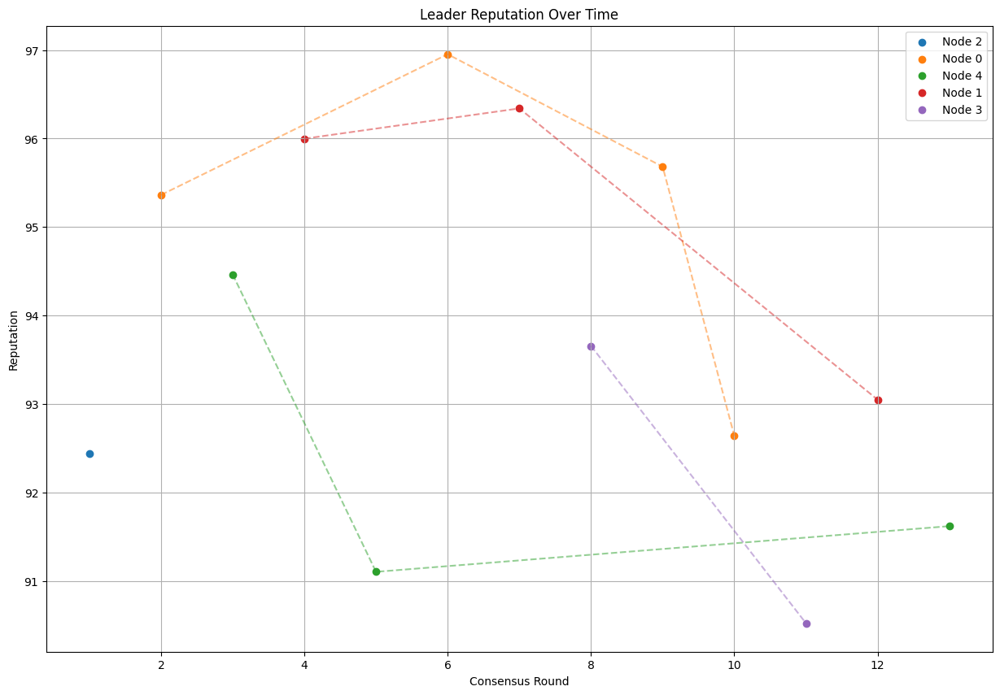


--- Consensus Round 14 ---

Primary Node for this round: Node 0
Primary Node Reputation: 99.05890159894561
Primary Node Malicious Count: 0
Node 0 generates proof: 76d37d8a6f892c977f7e5b1e11ac3ac9d6952d5e91aa41c0b1665b89de9181ff
Node 1 verifies proof: 76d37d8a6f892c977f7e5b1e11ac3ac9d6952d5e91aa41c0b1665b89de9181ff against expected: 76d37d8a6f892c977f7e5b1e11ac3ac9d6952d5e91aa41c0b1665b89de9181ff
Validation time: 0.000036 seconds
Node 2 verifies proof: 76d37d8a6f892c977f7e5b1e11ac3ac9d6952d5e91aa41c0b1665b89de9181ff against expected: 76d37d8a6f892c977f7e5b1e11ac3ac9d6952d5e91aa41c0b1665b89de9181ff
Validation time: 0.000019 seconds
Node 3 verifies proof: 76d37d8a6f892c977f7e5b1e11ac3ac9d6952d5e91aa41c0b1665b89de9181ff against expected: 76d37d8a6f892c977f7e5b1e11ac3ac9d6952d5e91aa41c0b1665b89de9181ff
Validation time: 0.000006 seconds
Node 4 verifies proof: 76d37d8a6f892c977f7e5b1e11ac3ac9d6952d5e91aa41c0b1665b89de9181ff against expected: 76d37d8a6f892c977f7e5b1e11ac3ac9d6952d5e91aa41c0b1

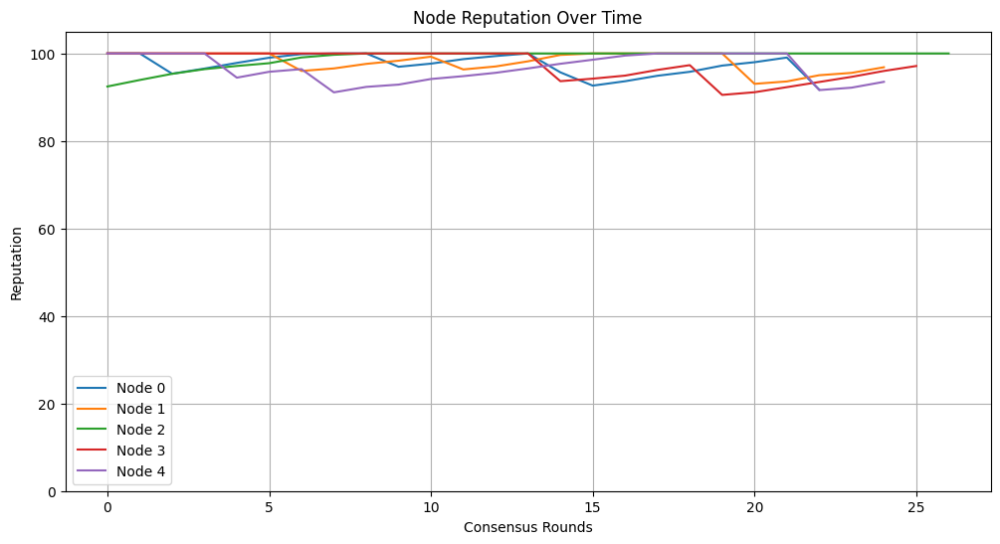


Leader Performance Summary:
Node 2:
 Times as leader: 1
 Average Latency: 0.080235 seconds
 Average Throughput: 199.42 tweets per second
 Average Reputation: 92.44
 Total Malicious Detections: 0
Node 0:
 Times as leader: 5
 Average Latency: 0.054637 seconds
 Average Throughput: 397.21 tweets per second
 Average Reputation: 94.48
 Total Malicious Detections: 0
Node 4:
 Times as leader: 3
 Average Latency: 0.069628 seconds
 Average Throughput: 300.06 tweets per second
 Average Reputation: 92.40
 Total Malicious Detections: 0
Node 1:
 Times as leader: 3
 Average Latency: 0.053658 seconds
 Average Throughput: 323.10 tweets per second
 Average Reputation: 95.13
 Total Malicious Detections: 0
Node 3:
 Times as leader: 2
 Average Latency: 0.037613 seconds
 Average Throughput: 427.66 tweets per second
 Average Reputation: 92.09
 Total Malicious Detections: 0


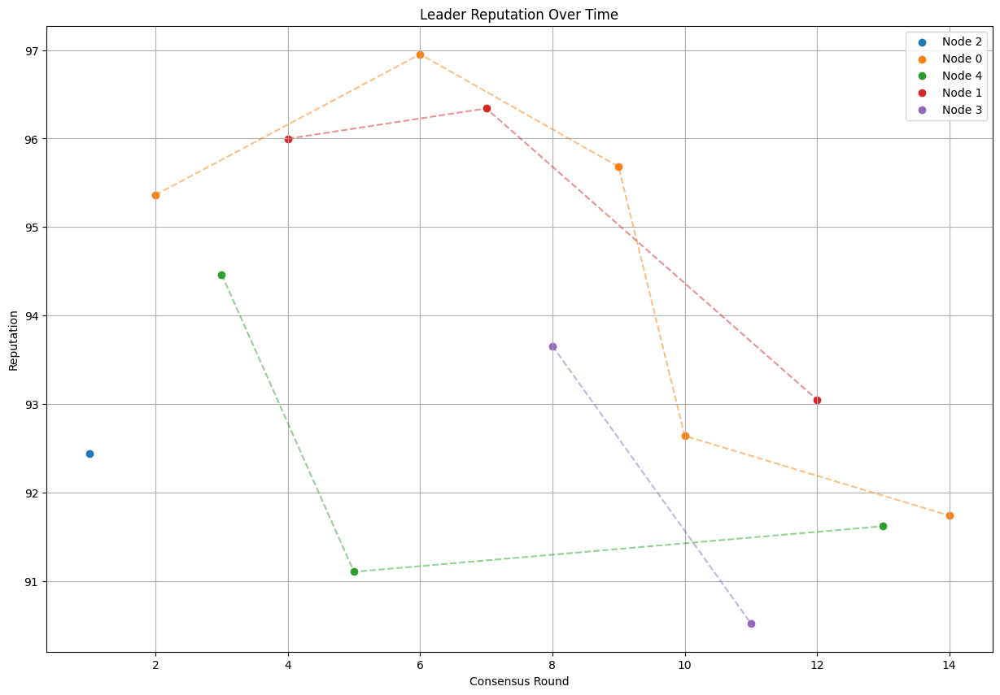


--- Consensus Round 15 ---

Primary Node for this round: Node 0
Primary Node Reputation: 91.74030923464544
Primary Node Malicious Count: 0
Node 0 generates proof: a8323aaaab61e34035e544227b50cc444a6284feac344a99d71543d52342b97f
Node 1 verifies proof: a8323aaaab61e34035e544227b50cc444a6284feac344a99d71543d52342b97f against expected: a8323aaaab61e34035e544227b50cc444a6284feac344a99d71543d52342b97f
Validation time: 0.000015 seconds
Node 2 verifies proof: a8323aaaab61e34035e544227b50cc444a6284feac344a99d71543d52342b97f against expected: a8323aaaab61e34035e544227b50cc444a6284feac344a99d71543d52342b97f
Validation time: 0.000017 seconds
Node 3 verifies proof: a8323aaaab61e34035e544227b50cc444a6284feac344a99d71543d52342b97f against expected: a8323aaaab61e34035e544227b50cc444a6284feac344a99d71543d52342b97f
Validation time: 0.000008 seconds
Node 4 verifies proof: a8323aaaab61e34035e544227b50cc444a6284feac344a99d71543d52342b97f against expected: a8323aaaab61e34035e544227b50cc444a6284feac344a99d7

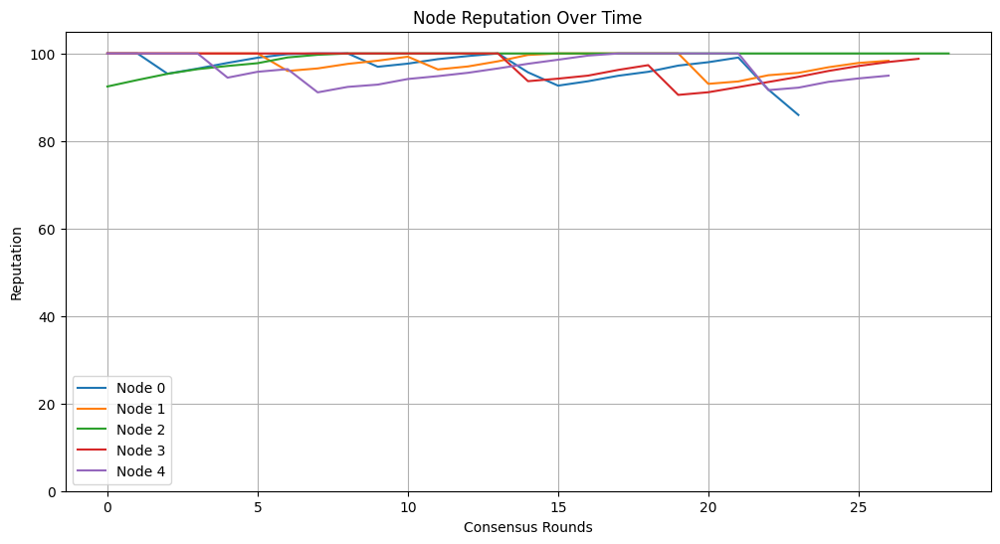


Leader Performance Summary:
Node 2:
 Times as leader: 1
 Average Latency: 0.080235 seconds
 Average Throughput: 199.42 tweets per second
 Average Reputation: 92.44
 Total Malicious Detections: 0
Node 0:
 Times as leader: 6
 Average Latency: 0.052959 seconds
 Average Throughput: 390.84 tweets per second
 Average Reputation: 93.05
 Total Malicious Detections: 0
Node 4:
 Times as leader: 3
 Average Latency: 0.069628 seconds
 Average Throughput: 300.06 tweets per second
 Average Reputation: 92.40
 Total Malicious Detections: 0
Node 1:
 Times as leader: 3
 Average Latency: 0.053658 seconds
 Average Throughput: 323.10 tweets per second
 Average Reputation: 95.13
 Total Malicious Detections: 0
Node 3:
 Times as leader: 2
 Average Latency: 0.037613 seconds
 Average Throughput: 427.66 tweets per second
 Average Reputation: 92.09
 Total Malicious Detections: 0


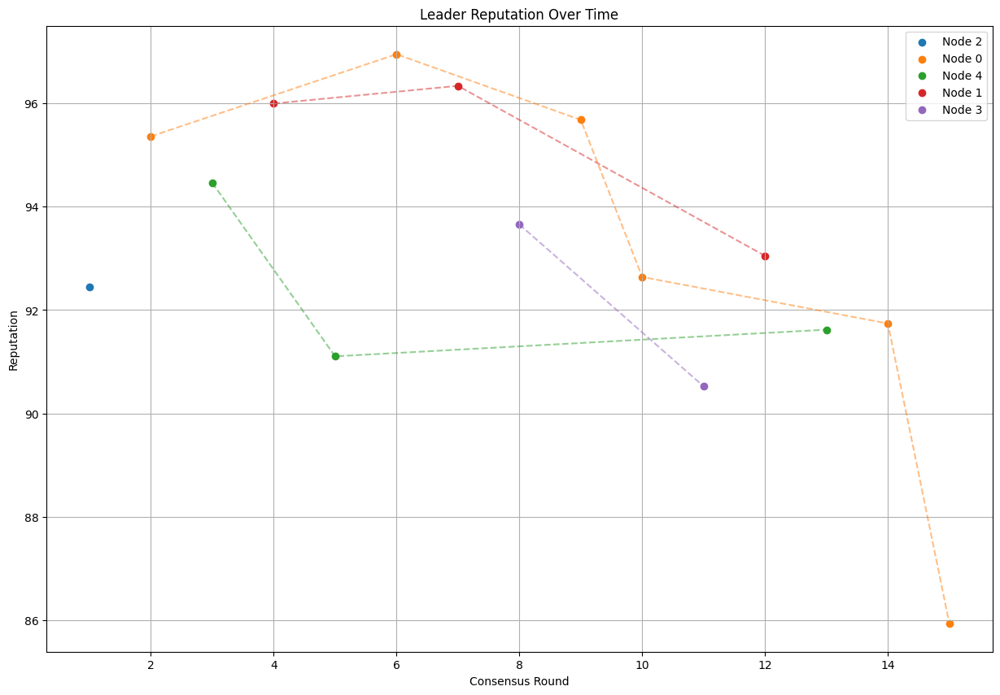


--- Consensus Round 16 ---

Primary Node for this round: Node 2
Primary Node Reputation: 100
Primary Node Malicious Count: 0
Node 2 generates proof: 72245106ffd19532c588b00968c824c36ec2907d433e03a6ffa2776a8d9b51be
Node 0 verifies proof: 72245106ffd19532c588b00968c824c36ec2907d433e03a6ffa2776a8d9b51be against expected: 72245106ffd19532c588b00968c824c36ec2907d433e03a6ffa2776a8d9b51be
Validation time: 0.000034 seconds
Node 1 verifies proof: 72245106ffd19532c588b00968c824c36ec2907d433e03a6ffa2776a8d9b51be against expected: 72245106ffd19532c588b00968c824c36ec2907d433e03a6ffa2776a8d9b51be
Validation time: 0.000009 seconds
Node 3 verifies proof: 72245106ffd19532c588b00968c824c36ec2907d433e03a6ffa2776a8d9b51be against expected: 72245106ffd19532c588b00968c824c36ec2907d433e03a6ffa2776a8d9b51be
Validation time: 0.000006 seconds
Node 4 verifies proof: 72245106ffd19532c588b00968c824c36ec2907d433e03a6ffa2776a8d9b51be against expected: 72245106ffd19532c588b00968c824c36ec2907d433e03a6ffa2776a8d9b51be

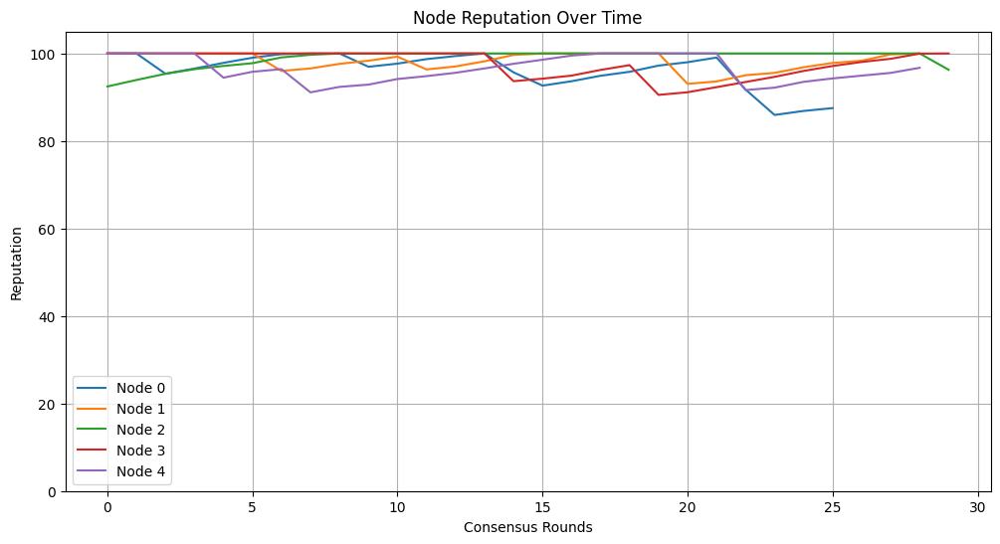


Leader Performance Summary:
Node 2:
 Times as leader: 2
 Average Latency: 0.059917 seconds
 Average Throughput: 301.73 tweets per second
 Average Reputation: 94.35
 Total Malicious Detections: 0
Node 0:
 Times as leader: 6
 Average Latency: 0.052959 seconds
 Average Throughput: 390.84 tweets per second
 Average Reputation: 93.05
 Total Malicious Detections: 0
Node 4:
 Times as leader: 3
 Average Latency: 0.069628 seconds
 Average Throughput: 300.06 tweets per second
 Average Reputation: 92.40
 Total Malicious Detections: 0
Node 1:
 Times as leader: 3
 Average Latency: 0.053658 seconds
 Average Throughput: 323.10 tweets per second
 Average Reputation: 95.13
 Total Malicious Detections: 0
Node 3:
 Times as leader: 2
 Average Latency: 0.037613 seconds
 Average Throughput: 427.66 tweets per second
 Average Reputation: 92.09
 Total Malicious Detections: 0


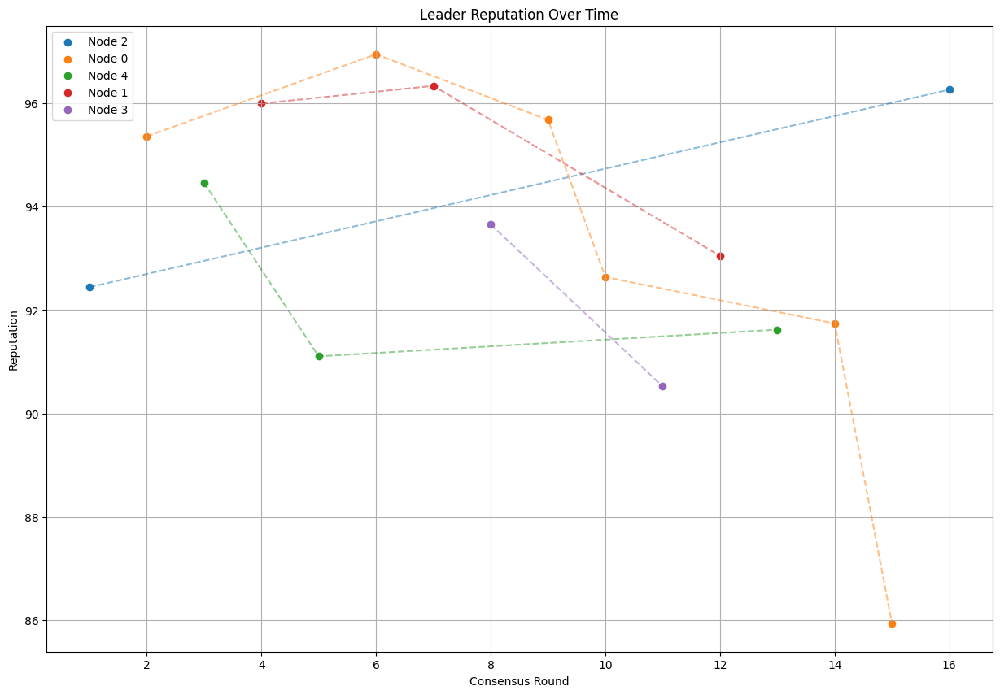


--- Consensus Round 17 ---

Primary Node for this round: Node 2
Primary Node Reputation: 96.26659128456379
Primary Node Malicious Count: 0
Node 2 generates proof: 07c32c4d84c4e4d5c6fcda6d9b587917a8cbe1d3874fbdc8a161f7cd973165b1
Node 0 verifies proof: 07c32c4d84c4e4d5c6fcda6d9b587917a8cbe1d3874fbdc8a161f7cd973165b1 against expected: 07c32c4d84c4e4d5c6fcda6d9b587917a8cbe1d3874fbdc8a161f7cd973165b1
Validation time: 0.000012 seconds
Node 1 verifies proof: 07c32c4d84c4e4d5c6fcda6d9b587917a8cbe1d3874fbdc8a161f7cd973165b1 against expected: 07c32c4d84c4e4d5c6fcda6d9b587917a8cbe1d3874fbdc8a161f7cd973165b1
Validation time: 0.000008 seconds
Node 3 verifies proof: 07c32c4d84c4e4d5c6fcda6d9b587917a8cbe1d3874fbdc8a161f7cd973165b1 against expected: 07c32c4d84c4e4d5c6fcda6d9b587917a8cbe1d3874fbdc8a161f7cd973165b1
Validation time: 0.000006 seconds
Node 4 verifies proof: 07c32c4d84c4e4d5c6fcda6d9b587917a8cbe1d3874fbdc8a161f7cd973165b1 against expected: 07c32c4d84c4e4d5c6fcda6d9b587917a8cbe1d3874fbdc8a1

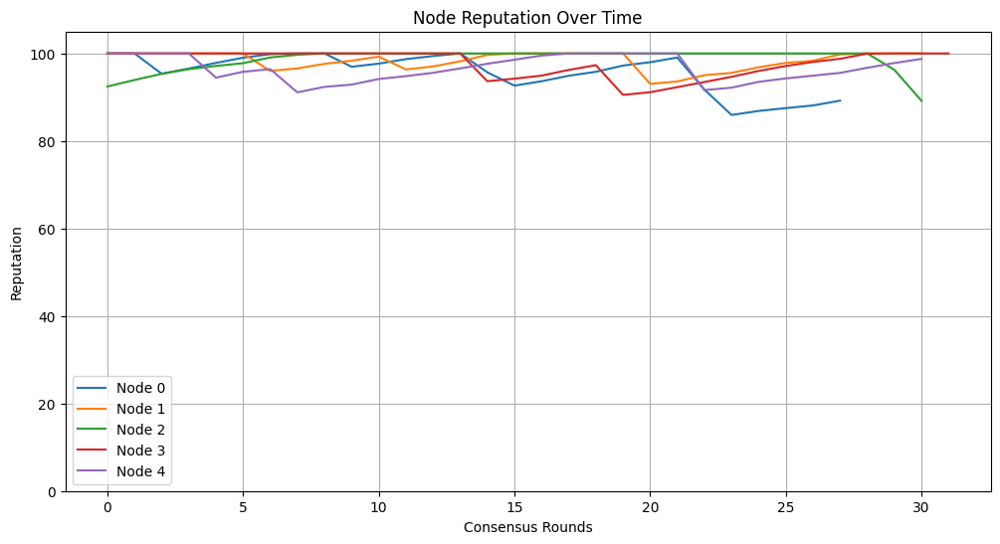


Leader Performance Summary:
Node 2:
 Times as leader: 3
 Average Latency: 0.052989 seconds
 Average Throughput: 337.45 tweets per second
 Average Reputation: 92.63
 Total Malicious Detections: 0
Node 0:
 Times as leader: 6
 Average Latency: 0.052959 seconds
 Average Throughput: 390.84 tweets per second
 Average Reputation: 93.05
 Total Malicious Detections: 0
Node 4:
 Times as leader: 3
 Average Latency: 0.069628 seconds
 Average Throughput: 300.06 tweets per second
 Average Reputation: 92.40
 Total Malicious Detections: 0
Node 1:
 Times as leader: 3
 Average Latency: 0.053658 seconds
 Average Throughput: 323.10 tweets per second
 Average Reputation: 95.13
 Total Malicious Detections: 0
Node 3:
 Times as leader: 2
 Average Latency: 0.037613 seconds
 Average Throughput: 427.66 tweets per second
 Average Reputation: 92.09
 Total Malicious Detections: 0


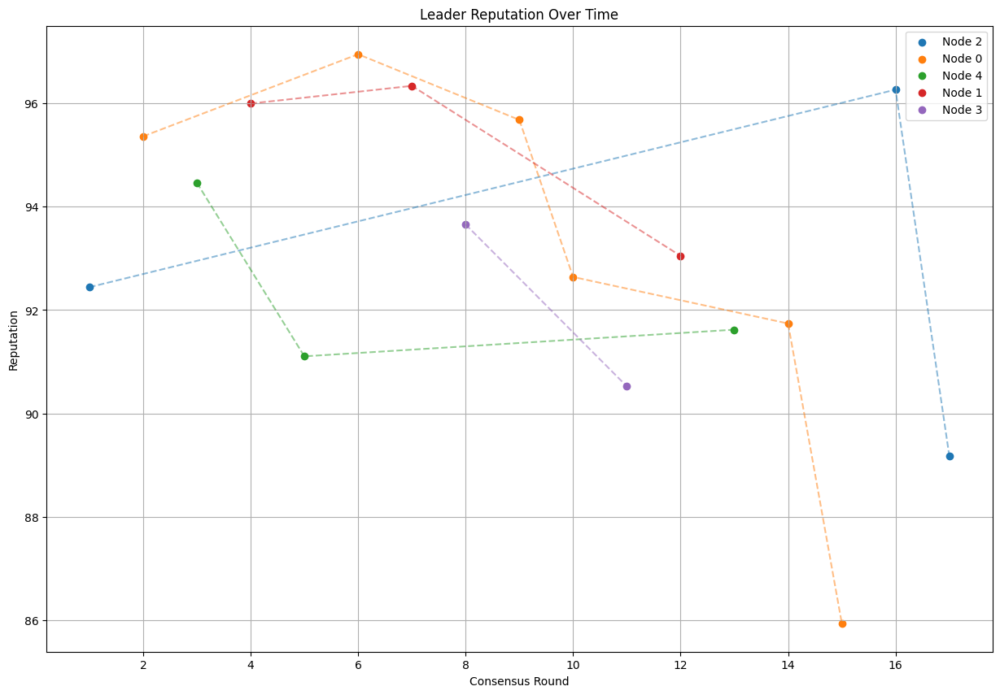


--- Consensus Round 18 ---

Primary Node for this round: Node 4
Primary Node Reputation: 98.7453782925112
Primary Node Malicious Count: 0
Node 4 generates proof: b04d35e51543b3db89c4cbb29ac3f0ee85a50bdb826fdc04e893283e0580f8ae
Node 0 verifies proof: b04d35e51543b3db89c4cbb29ac3f0ee85a50bdb826fdc04e893283e0580f8ae against expected: b04d35e51543b3db89c4cbb29ac3f0ee85a50bdb826fdc04e893283e0580f8ae
Validation time: 0.000030 seconds
Node 1 verifies proof: b04d35e51543b3db89c4cbb29ac3f0ee85a50bdb826fdc04e893283e0580f8ae against expected: b04d35e51543b3db89c4cbb29ac3f0ee85a50bdb826fdc04e893283e0580f8ae
Validation time: 0.000021 seconds
Node 2 verifies proof: b04d35e51543b3db89c4cbb29ac3f0ee85a50bdb826fdc04e893283e0580f8ae against expected: b04d35e51543b3db89c4cbb29ac3f0ee85a50bdb826fdc04e893283e0580f8ae
Validation time: 0.000019 seconds
Node 3 verifies proof: b04d35e51543b3db89c4cbb29ac3f0ee85a50bdb826fdc04e893283e0580f8ae against expected: b04d35e51543b3db89c4cbb29ac3f0ee85a50bdb826fdc04e89

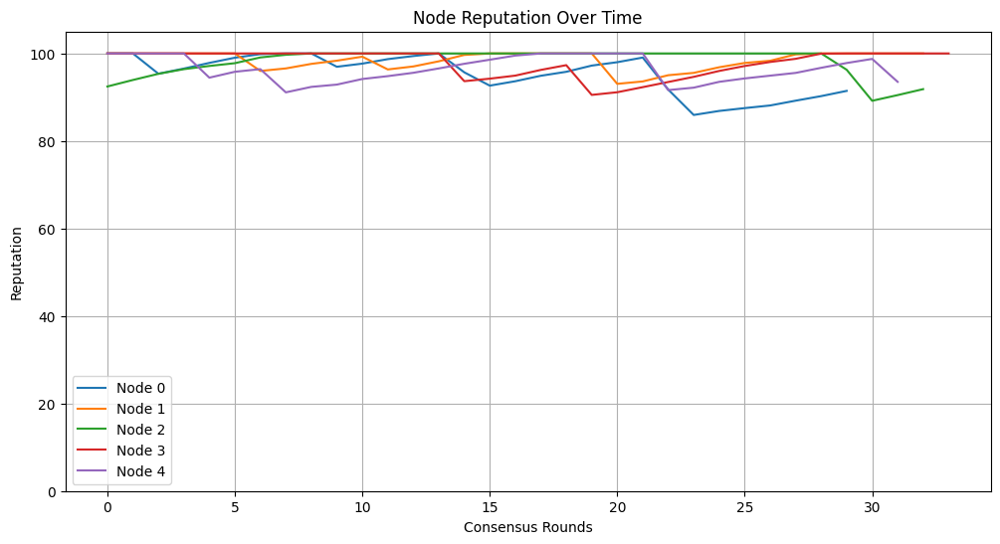


Leader Performance Summary:
Node 2:
 Times as leader: 3
 Average Latency: 0.052989 seconds
 Average Throughput: 337.45 tweets per second
 Average Reputation: 92.63
 Total Malicious Detections: 0
Node 0:
 Times as leader: 6
 Average Latency: 0.052959 seconds
 Average Throughput: 390.84 tweets per second
 Average Reputation: 93.05
 Total Malicious Detections: 0
Node 4:
 Times as leader: 4
 Average Latency: 0.063736 seconds
 Average Throughput: 311.89 tweets per second
 Average Reputation: 92.67
 Total Malicious Detections: 0
Node 1:
 Times as leader: 3
 Average Latency: 0.053658 seconds
 Average Throughput: 323.10 tweets per second
 Average Reputation: 95.13
 Total Malicious Detections: 0
Node 3:
 Times as leader: 2
 Average Latency: 0.037613 seconds
 Average Throughput: 427.66 tweets per second
 Average Reputation: 92.09
 Total Malicious Detections: 0


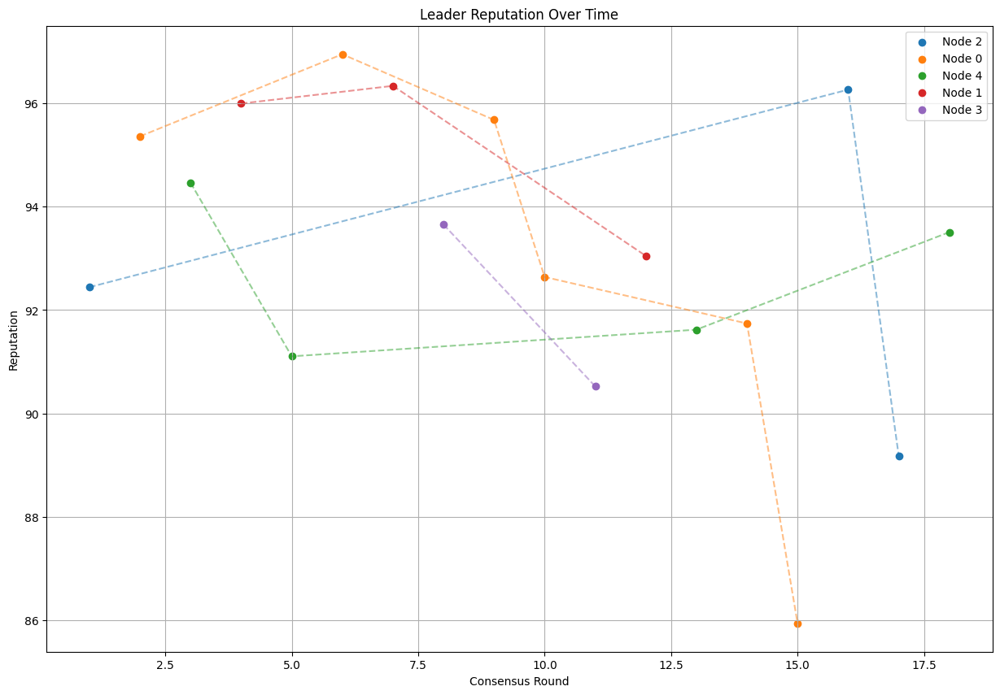


--- Consensus Round 19 ---

Primary Node for this round: Node 4
Primary Node Reputation: 93.50831622244783
Primary Node Malicious Count: 0
Node 4 generates proof: 09d34613c60043657e57cbeff5f5d97c122c5bae817b68700e0b9202d03b1f6c
Node 0 verifies proof: 09d34613c60043657e57cbeff5f5d97c122c5bae817b68700e0b9202d03b1f6c against expected: 09d34613c60043657e57cbeff5f5d97c122c5bae817b68700e0b9202d03b1f6c
Validation time: 0.000026 seconds
Node 1 verifies proof: 09d34613c60043657e57cbeff5f5d97c122c5bae817b68700e0b9202d03b1f6c against expected: 09d34613c60043657e57cbeff5f5d97c122c5bae817b68700e0b9202d03b1f6c
Validation time: 0.000020 seconds
Node 2 verifies proof: 09d34613c60043657e57cbeff5f5d97c122c5bae817b68700e0b9202d03b1f6c against expected: 09d34613c60043657e57cbeff5f5d97c122c5bae817b68700e0b9202d03b1f6c
Validation time: 0.000018 seconds
Node 3 verifies proof: 09d34613c60043657e57cbeff5f5d97c122c5bae817b68700e0b9202d03b1f6c against expected: 09d34613c60043657e57cbeff5f5d97c122c5bae817b68700e

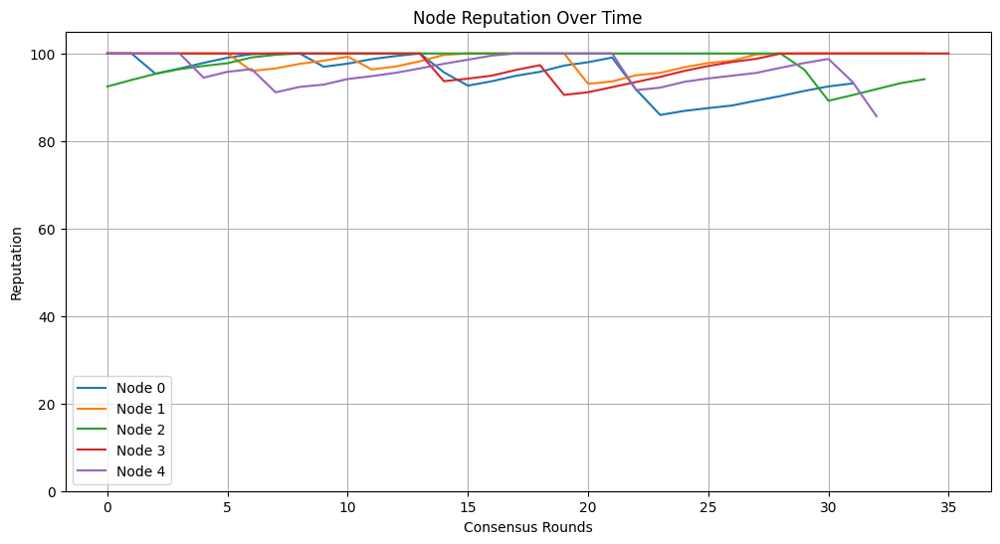


Leader Performance Summary:
Node 2:
 Times as leader: 3
 Average Latency: 0.052989 seconds
 Average Throughput: 337.45 tweets per second
 Average Reputation: 92.63
 Total Malicious Detections: 0
Node 0:
 Times as leader: 6
 Average Latency: 0.052959 seconds
 Average Throughput: 390.84 tweets per second
 Average Reputation: 93.05
 Total Malicious Detections: 0
Node 4:
 Times as leader: 5
 Average Latency: 0.058918 seconds
 Average Throughput: 330.23 tweets per second
 Average Reputation: 91.27
 Total Malicious Detections: 0
Node 1:
 Times as leader: 3
 Average Latency: 0.053658 seconds
 Average Throughput: 323.10 tweets per second
 Average Reputation: 95.13
 Total Malicious Detections: 0
Node 3:
 Times as leader: 2
 Average Latency: 0.037613 seconds
 Average Throughput: 427.66 tweets per second
 Average Reputation: 92.09
 Total Malicious Detections: 0


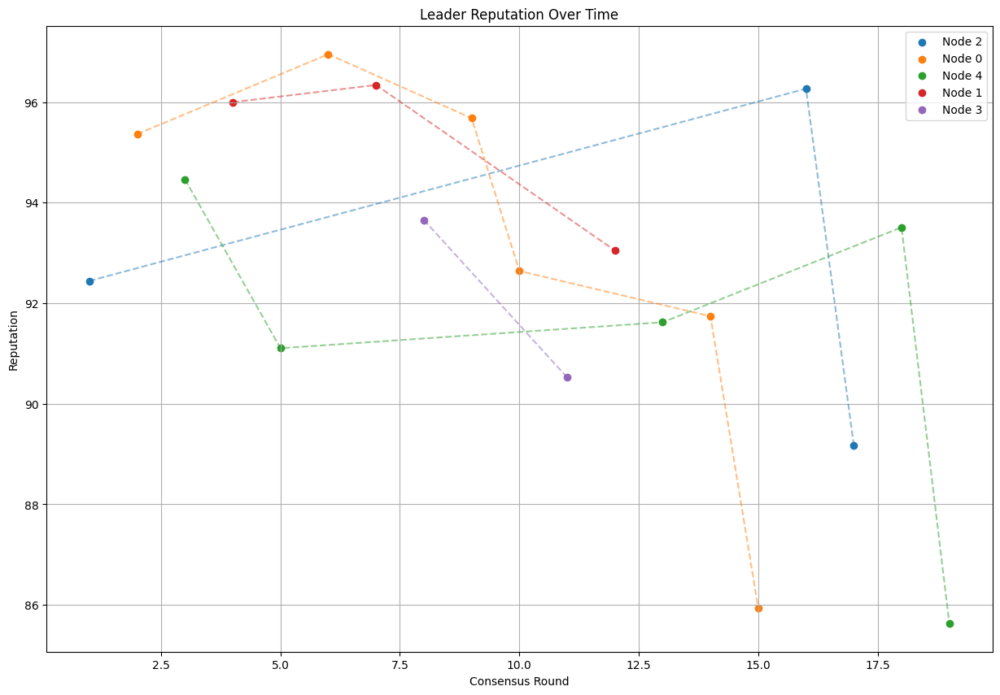


--- Consensus Round 20 ---

Primary Node for this round: Node 1
Primary Node Reputation: 100
Primary Node Malicious Count: 0
Node 1 generates proof: 382990e949cf8e1fe5f40f53828e15939f5accfafc685a67b9f4ef6b6902cd07
Node 0 verifies proof: 382990e949cf8e1fe5f40f53828e15939f5accfafc685a67b9f4ef6b6902cd07 against expected: 382990e949cf8e1fe5f40f53828e15939f5accfafc685a67b9f4ef6b6902cd07
Validation time: 0.000012 seconds
Node 2 verifies proof: 382990e949cf8e1fe5f40f53828e15939f5accfafc685a67b9f4ef6b6902cd07 against expected: 382990e949cf8e1fe5f40f53828e15939f5accfafc685a67b9f4ef6b6902cd07
Validation time: 0.000012 seconds
Node 3 verifies proof: 382990e949cf8e1fe5f40f53828e15939f5accfafc685a67b9f4ef6b6902cd07 against expected: 382990e949cf8e1fe5f40f53828e15939f5accfafc685a67b9f4ef6b6902cd07
Validation time: 0.000012 seconds
Node 4 verifies proof: 382990e949cf8e1fe5f40f53828e15939f5accfafc685a67b9f4ef6b6902cd07 against expected: 382990e949cf8e1fe5f40f53828e15939f5accfafc685a67b9f4ef6b6902cd07

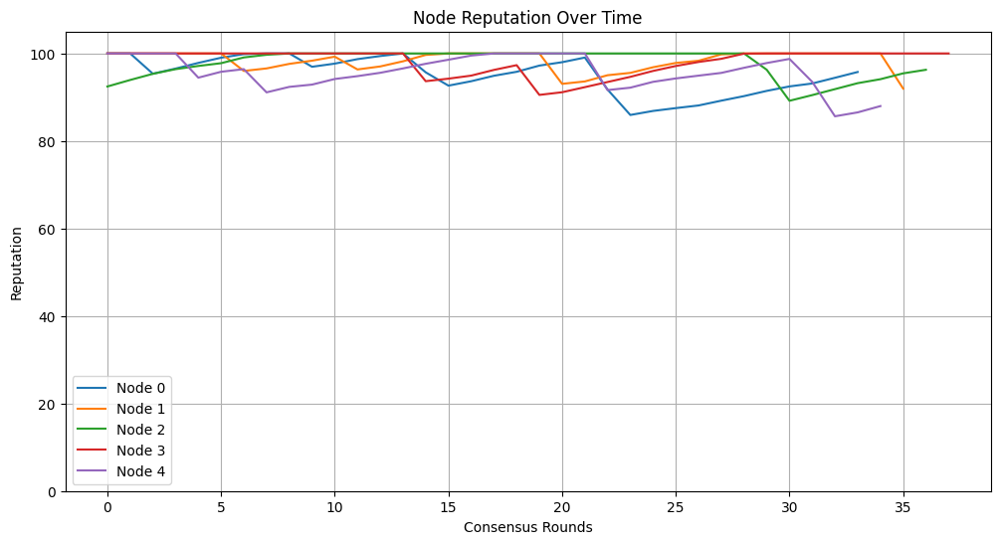


Leader Performance Summary:
Node 2:
 Times as leader: 3
 Average Latency: 0.052989 seconds
 Average Throughput: 337.45 tweets per second
 Average Reputation: 92.63
 Total Malicious Detections: 0
Node 0:
 Times as leader: 6
 Average Latency: 0.052959 seconds
 Average Throughput: 390.84 tweets per second
 Average Reputation: 93.05
 Total Malicious Detections: 0
Node 4:
 Times as leader: 5
 Average Latency: 0.058918 seconds
 Average Throughput: 330.23 tweets per second
 Average Reputation: 91.27
 Total Malicious Detections: 0
Node 1:
 Times as leader: 4
 Average Latency: 0.048787 seconds
 Average Throughput: 359.37 tweets per second
 Average Reputation: 94.34
 Total Malicious Detections: 0
Node 3:
 Times as leader: 2
 Average Latency: 0.037613 seconds
 Average Throughput: 427.66 tweets per second
 Average Reputation: 92.09
 Total Malicious Detections: 0


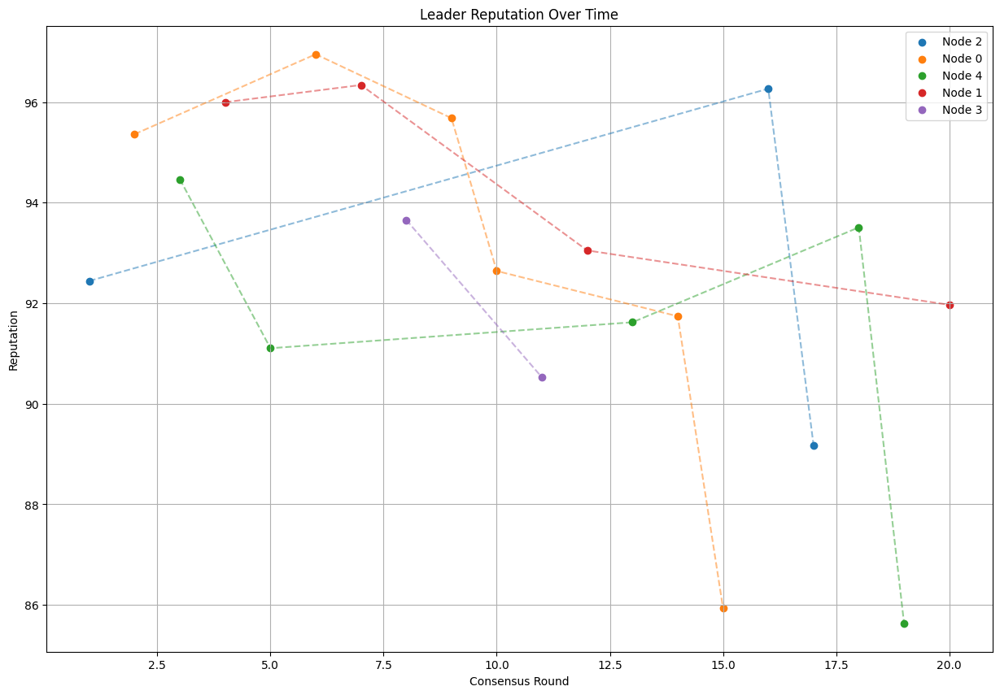


--- Consensus Round 21 ---

Primary Node for this round: Node 0
Primary Node Reputation: 95.75811711739307
Primary Node Malicious Count: 0
Node 0 generates proof: 3c8569b249fbcca09c9ed0a2efb412587bc44b7c19e0717a8c462b821334545c
Node 1 verifies proof: 3c8569b249fbcca09c9ed0a2efb412587bc44b7c19e0717a8c462b821334545c against expected: 3c8569b249fbcca09c9ed0a2efb412587bc44b7c19e0717a8c462b821334545c
Validation time: 0.000027 seconds
Node 2 verifies proof: 3c8569b249fbcca09c9ed0a2efb412587bc44b7c19e0717a8c462b821334545c against expected: 3c8569b249fbcca09c9ed0a2efb412587bc44b7c19e0717a8c462b821334545c
Validation time: 0.000020 seconds
Node 3 verifies proof: 3c8569b249fbcca09c9ed0a2efb412587bc44b7c19e0717a8c462b821334545c against expected: 3c8569b249fbcca09c9ed0a2efb412587bc44b7c19e0717a8c462b821334545c
Validation time: 0.000017 seconds
Node 4 verifies proof: 3c8569b249fbcca09c9ed0a2efb412587bc44b7c19e0717a8c462b821334545c against expected: 3c8569b249fbcca09c9ed0a2efb412587bc44b7c19e0717a8c

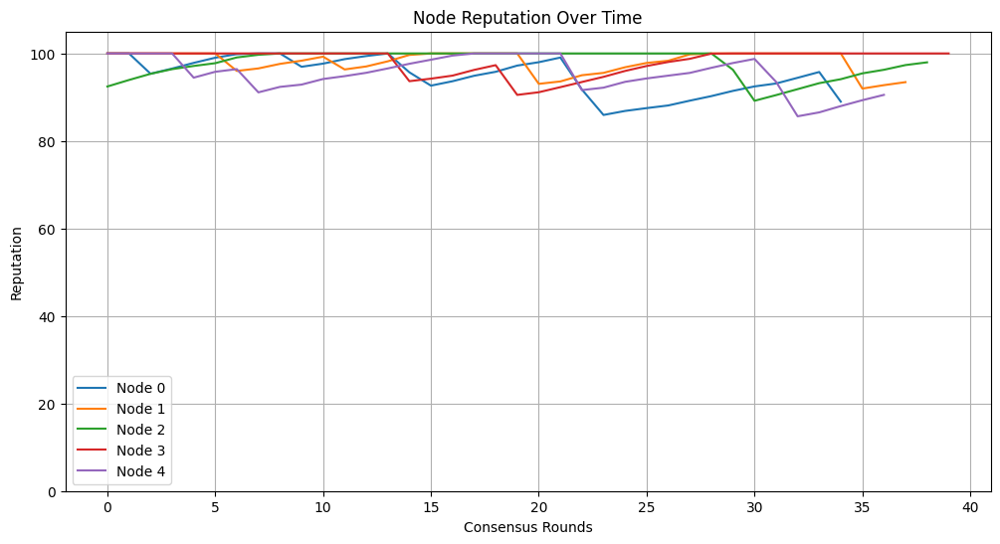


Leader Performance Summary:
Node 2:
 Times as leader: 3
 Average Latency: 0.052989 seconds
 Average Throughput: 337.45 tweets per second
 Average Reputation: 92.63
 Total Malicious Detections: 0
Node 0:
 Times as leader: 7
 Average Latency: 0.051268 seconds
 Average Throughput: 390.58 tweets per second
 Average Reputation: 92.47
 Total Malicious Detections: 0
Node 4:
 Times as leader: 5
 Average Latency: 0.058918 seconds
 Average Throughput: 330.23 tweets per second
 Average Reputation: 91.27
 Total Malicious Detections: 0
Node 1:
 Times as leader: 4
 Average Latency: 0.048787 seconds
 Average Throughput: 359.37 tweets per second
 Average Reputation: 94.34
 Total Malicious Detections: 0
Node 3:
 Times as leader: 2
 Average Latency: 0.037613 seconds
 Average Throughput: 427.66 tweets per second
 Average Reputation: 92.09
 Total Malicious Detections: 0


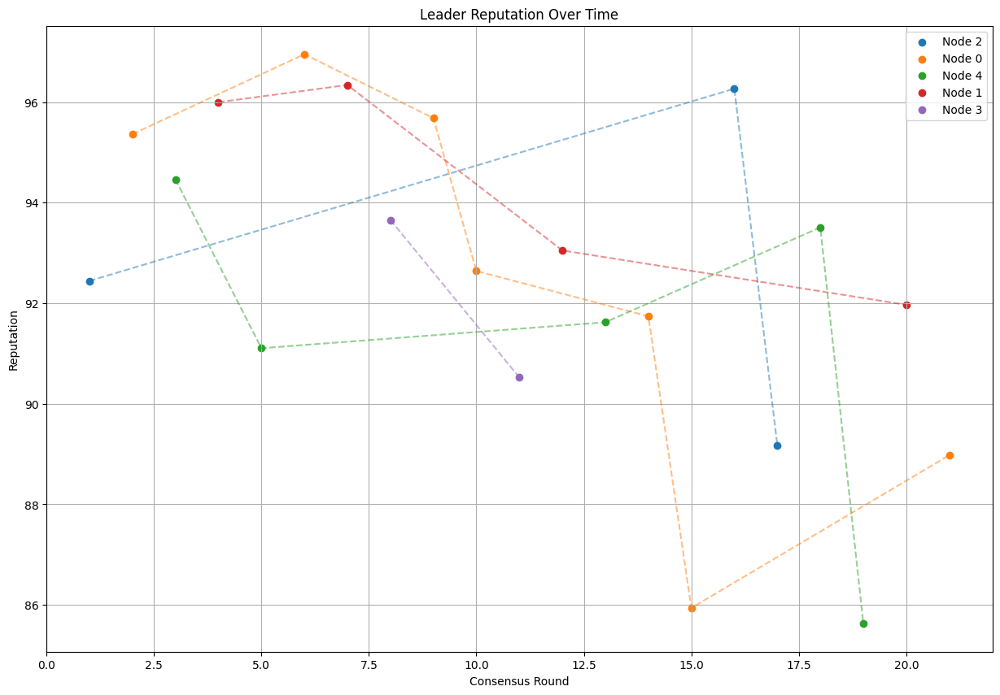


--- Consensus Round 22 ---

Primary Node for this round: Node 2
Primary Node Reputation: 97.96507298884103
Primary Node Malicious Count: 0
Node 2 generates proof: 75efb549eb2c2c8b5b0f76609e26ec78dc5cc7ca7bf40839586b32871d9ddc44
Node 0 verifies proof: 75efb549eb2c2c8b5b0f76609e26ec78dc5cc7ca7bf40839586b32871d9ddc44 against expected: 75efb549eb2c2c8b5b0f76609e26ec78dc5cc7ca7bf40839586b32871d9ddc44
Validation time: 0.000020 seconds
Node 1 verifies proof: 75efb549eb2c2c8b5b0f76609e26ec78dc5cc7ca7bf40839586b32871d9ddc44 against expected: 75efb549eb2c2c8b5b0f76609e26ec78dc5cc7ca7bf40839586b32871d9ddc44
Validation time: 0.000021 seconds
Node 3 verifies proof: 75efb549eb2c2c8b5b0f76609e26ec78dc5cc7ca7bf40839586b32871d9ddc44 against expected: 75efb549eb2c2c8b5b0f76609e26ec78dc5cc7ca7bf40839586b32871d9ddc44
Validation time: 0.000018 seconds
Node 4 verifies proof: 75efb549eb2c2c8b5b0f76609e26ec78dc5cc7ca7bf40839586b32871d9ddc44 against expected: 75efb549eb2c2c8b5b0f76609e26ec78dc5cc7ca7bf4083958

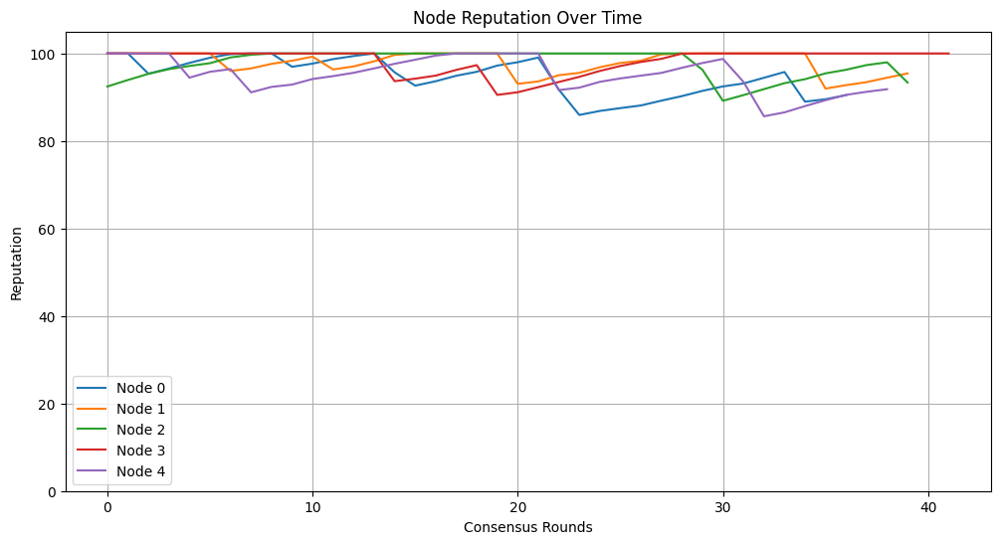


Leader Performance Summary:
Node 2:
 Times as leader: 4
 Average Latency: 0.049275 seconds
 Average Throughput: 357.98 tweets per second
 Average Reputation: 92.81
 Total Malicious Detections: 0
Node 0:
 Times as leader: 7
 Average Latency: 0.051268 seconds
 Average Throughput: 390.58 tweets per second
 Average Reputation: 92.47
 Total Malicious Detections: 0
Node 4:
 Times as leader: 5
 Average Latency: 0.058918 seconds
 Average Throughput: 330.23 tweets per second
 Average Reputation: 91.27
 Total Malicious Detections: 0
Node 1:
 Times as leader: 4
 Average Latency: 0.048787 seconds
 Average Throughput: 359.37 tweets per second
 Average Reputation: 94.34
 Total Malicious Detections: 0
Node 3:
 Times as leader: 2
 Average Latency: 0.037613 seconds
 Average Throughput: 427.66 tweets per second
 Average Reputation: 92.09
 Total Malicious Detections: 0


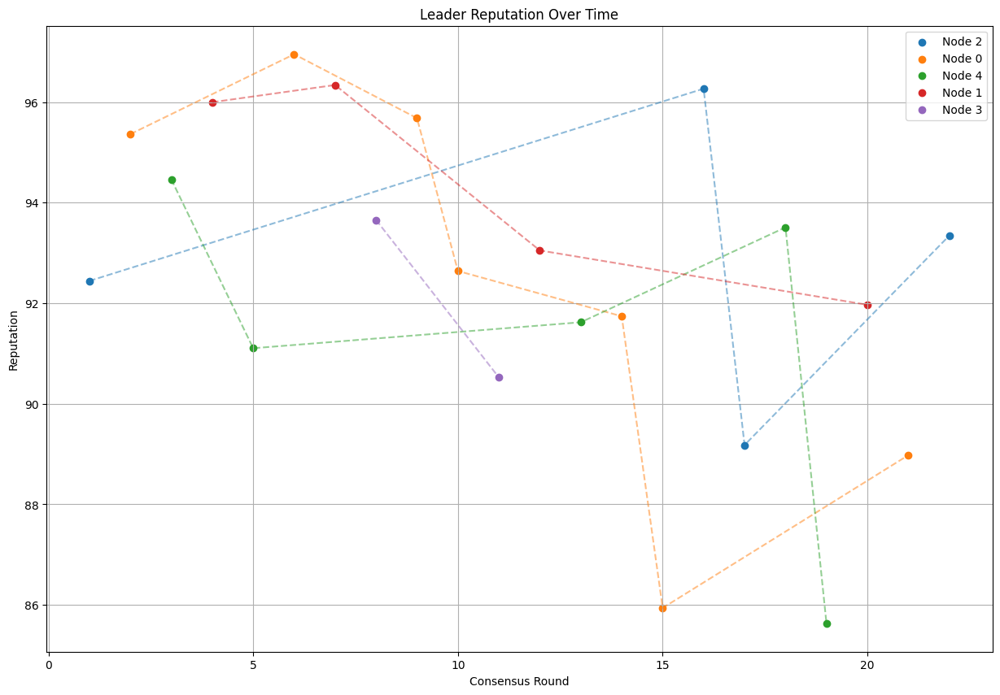


--- Consensus Round 23 ---

Primary Node for this round: Node 2
Primary Node Reputation: 93.34466784677497
Primary Node Malicious Count: 0
Node 2 generates proof: 1ecedd4a1f88d27a3e4fd25c53ff7fc3ed0e992e36e7e91357f85a43ca823ba4
Node 0 verifies proof: 1ecedd4a1f88d27a3e4fd25c53ff7fc3ed0e992e36e7e91357f85a43ca823ba4 against expected: 1ecedd4a1f88d27a3e4fd25c53ff7fc3ed0e992e36e7e91357f85a43ca823ba4
Validation time: 0.000020 seconds
Node 1 verifies proof: 1ecedd4a1f88d27a3e4fd25c53ff7fc3ed0e992e36e7e91357f85a43ca823ba4 against expected: 1ecedd4a1f88d27a3e4fd25c53ff7fc3ed0e992e36e7e91357f85a43ca823ba4
Validation time: 0.000019 seconds
Node 3 verifies proof: 1ecedd4a1f88d27a3e4fd25c53ff7fc3ed0e992e36e7e91357f85a43ca823ba4 against expected: 1ecedd4a1f88d27a3e4fd25c53ff7fc3ed0e992e36e7e91357f85a43ca823ba4
Validation time: 0.000015 seconds
Node 4 verifies proof: 1ecedd4a1f88d27a3e4fd25c53ff7fc3ed0e992e36e7e91357f85a43ca823ba4 against expected: 1ecedd4a1f88d27a3e4fd25c53ff7fc3ed0e992e36e7e91357

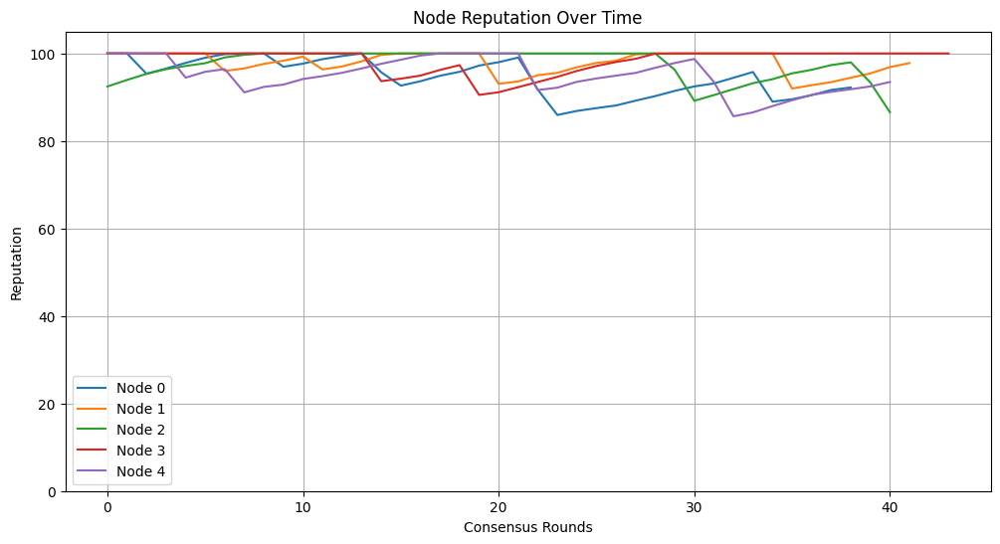


Leader Performance Summary:
Node 2:
 Times as leader: 5
 Average Latency: 0.047992 seconds
 Average Throughput: 361.05 tweets per second
 Average Reputation: 91.56
 Total Malicious Detections: 0
Node 0:
 Times as leader: 7
 Average Latency: 0.051268 seconds
 Average Throughput: 390.58 tweets per second
 Average Reputation: 92.47
 Total Malicious Detections: 0
Node 4:
 Times as leader: 5
 Average Latency: 0.058918 seconds
 Average Throughput: 330.23 tweets per second
 Average Reputation: 91.27
 Total Malicious Detections: 0
Node 1:
 Times as leader: 4
 Average Latency: 0.048787 seconds
 Average Throughput: 359.37 tweets per second
 Average Reputation: 94.34
 Total Malicious Detections: 0
Node 3:
 Times as leader: 2
 Average Latency: 0.037613 seconds
 Average Throughput: 427.66 tweets per second
 Average Reputation: 92.09
 Total Malicious Detections: 0


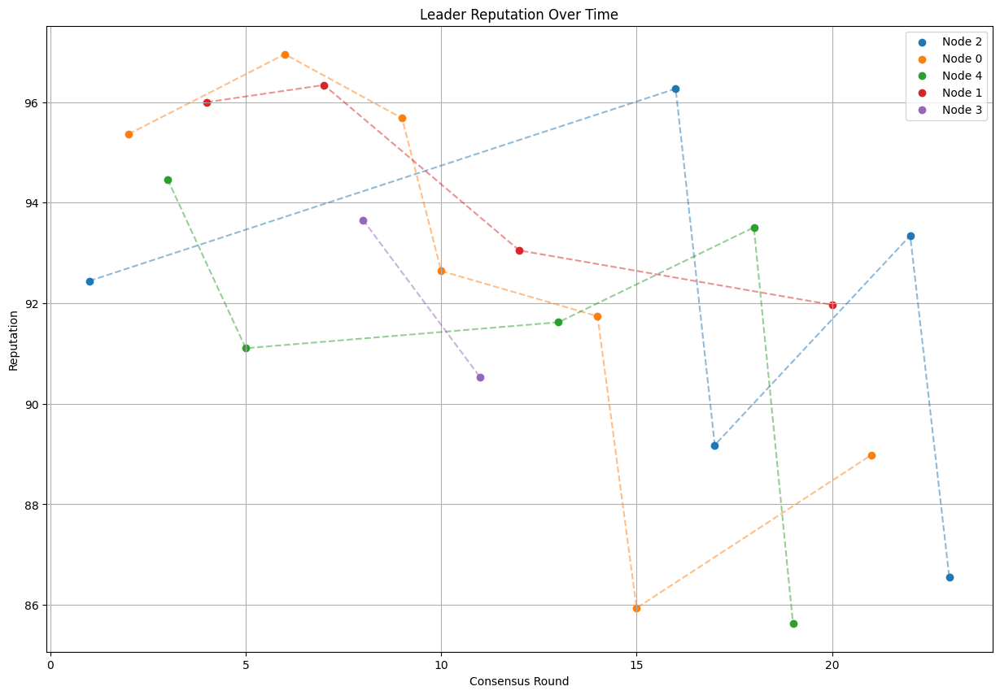


--- Consensus Round 24 ---

Primary Node for this round: Node 3
Primary Node Reputation: 100
Primary Node Malicious Count: 0
Node 3 generates proof: 55022d425d53419912f52463a0d9c3a1438d366f619441d1a48d60fcc202cfa7
Node 0 verifies proof: 55022d425d53419912f52463a0d9c3a1438d366f619441d1a48d60fcc202cfa7 against expected: 55022d425d53419912f52463a0d9c3a1438d366f619441d1a48d60fcc202cfa7
Validation time: 0.000023 seconds
Node 1 verifies proof: 55022d425d53419912f52463a0d9c3a1438d366f619441d1a48d60fcc202cfa7 against expected: 55022d425d53419912f52463a0d9c3a1438d366f619441d1a48d60fcc202cfa7
Validation time: 0.000020 seconds
Node 2 verifies proof: 55022d425d53419912f52463a0d9c3a1438d366f619441d1a48d60fcc202cfa7 against expected: 55022d425d53419912f52463a0d9c3a1438d366f619441d1a48d60fcc202cfa7
Validation time: 0.000018 seconds
Node 4 verifies proof: 55022d425d53419912f52463a0d9c3a1438d366f619441d1a48d60fcc202cfa7 against expected: 55022d425d53419912f52463a0d9c3a1438d366f619441d1a48d60fcc202cfa7

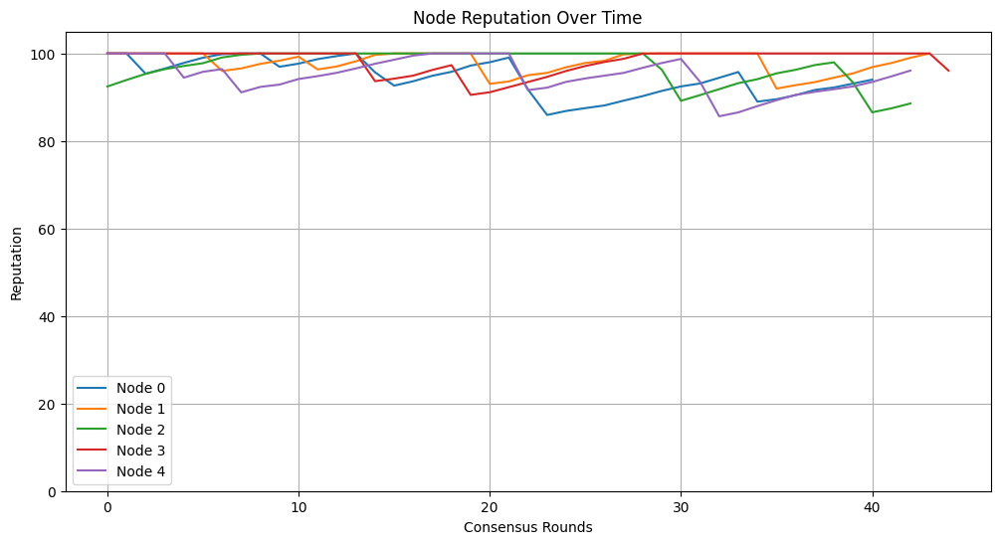


Leader Performance Summary:
Node 2:
 Times as leader: 5
 Average Latency: 0.047992 seconds
 Average Throughput: 361.05 tweets per second
 Average Reputation: 91.56
 Total Malicious Detections: 0
Node 0:
 Times as leader: 7
 Average Latency: 0.051268 seconds
 Average Throughput: 390.58 tweets per second
 Average Reputation: 92.47
 Total Malicious Detections: 0
Node 4:
 Times as leader: 5
 Average Latency: 0.058918 seconds
 Average Throughput: 330.23 tweets per second
 Average Reputation: 91.27
 Total Malicious Detections: 0
Node 1:
 Times as leader: 4
 Average Latency: 0.048787 seconds
 Average Throughput: 359.37 tweets per second
 Average Reputation: 94.34
 Total Malicious Detections: 0
Node 3:
 Times as leader: 3
 Average Latency: 0.043680 seconds
 Average Throughput: 380.66 tweets per second
 Average Reputation: 93.41
 Total Malicious Detections: 0


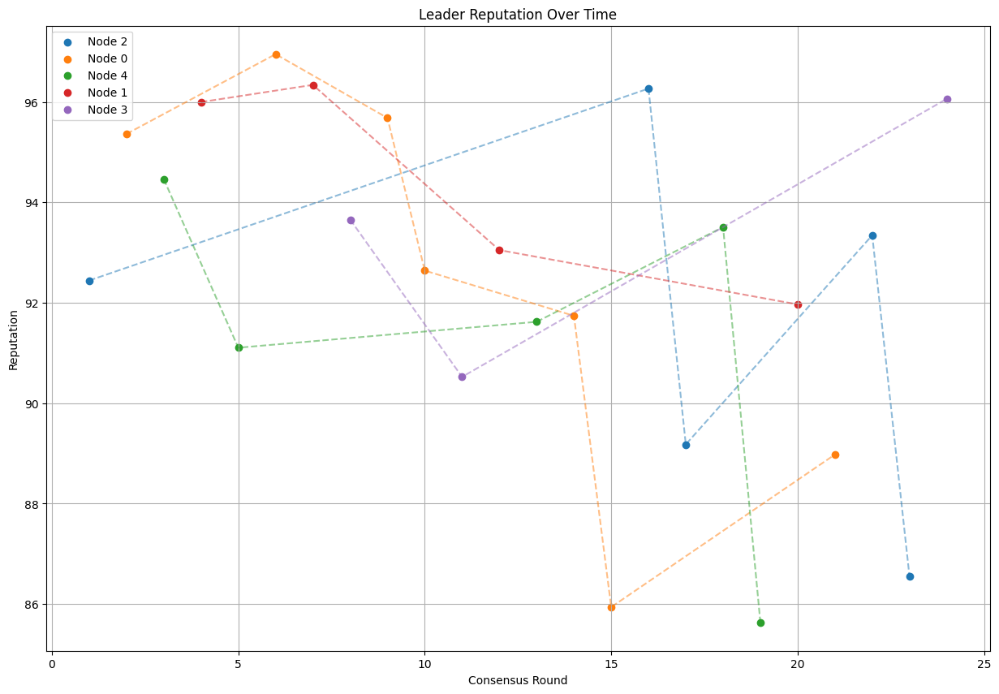


--- Consensus Round 25 ---

Primary Node for this round: Node 2
Primary Node Reputation: 88.56007075648024
Primary Node Malicious Count: 0
Node 2 generates proof: 7c8f161de7c12f2971b3503e3761ba645d711439ef77f6250d99a1358b2053d4
Node 0 verifies proof: 7c8f161de7c12f2971b3503e3761ba645d711439ef77f6250d99a1358b2053d4 against expected: 7c8f161de7c12f2971b3503e3761ba645d711439ef77f6250d99a1358b2053d4
Validation time: 0.000043 seconds
Node 1 verifies proof: 7c8f161de7c12f2971b3503e3761ba645d711439ef77f6250d99a1358b2053d4 against expected: 7c8f161de7c12f2971b3503e3761ba645d711439ef77f6250d99a1358b2053d4
Validation time: 0.000021 seconds
Node 3 verifies proof: 7c8f161de7c12f2971b3503e3761ba645d711439ef77f6250d99a1358b2053d4 against expected: 7c8f161de7c12f2971b3503e3761ba645d711439ef77f6250d99a1358b2053d4
Validation time: 0.000018 seconds
Node 4 verifies proof: 7c8f161de7c12f2971b3503e3761ba645d711439ef77f6250d99a1358b2053d4 against expected: 7c8f161de7c12f2971b3503e3761ba645d711439ef77f6250d

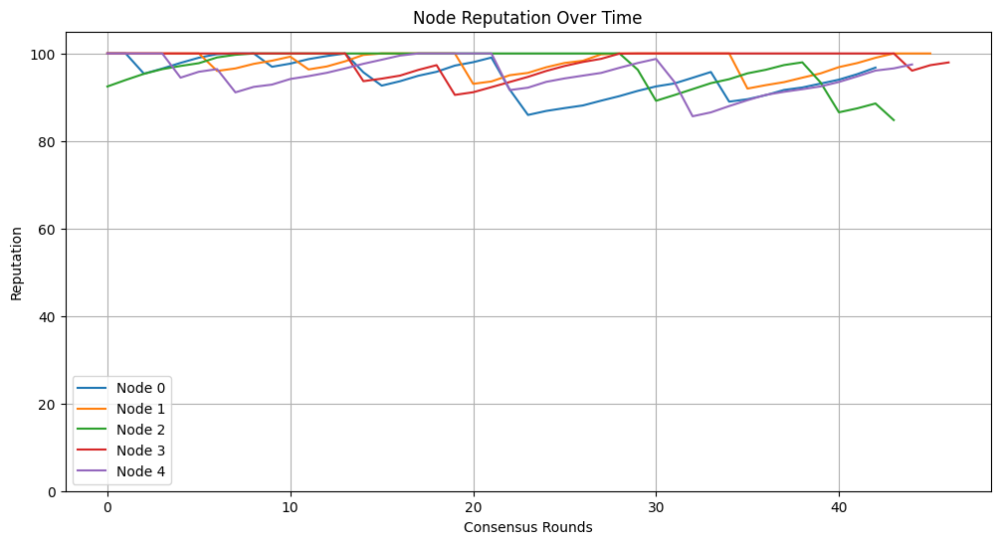


Leader Performance Summary:
Node 2:
 Times as leader: 6
 Average Latency: 0.050956 seconds
 Average Throughput: 341.41 tweets per second
 Average Reputation: 90.42
 Total Malicious Detections: 0
Node 0:
 Times as leader: 7
 Average Latency: 0.051268 seconds
 Average Throughput: 390.58 tweets per second
 Average Reputation: 92.47
 Total Malicious Detections: 0
Node 4:
 Times as leader: 5
 Average Latency: 0.058918 seconds
 Average Throughput: 330.23 tweets per second
 Average Reputation: 91.27
 Total Malicious Detections: 0
Node 1:
 Times as leader: 4
 Average Latency: 0.048787 seconds
 Average Throughput: 359.37 tweets per second
 Average Reputation: 94.34
 Total Malicious Detections: 0
Node 3:
 Times as leader: 3
 Average Latency: 0.043680 seconds
 Average Throughput: 380.66 tweets per second
 Average Reputation: 93.41
 Total Malicious Detections: 0


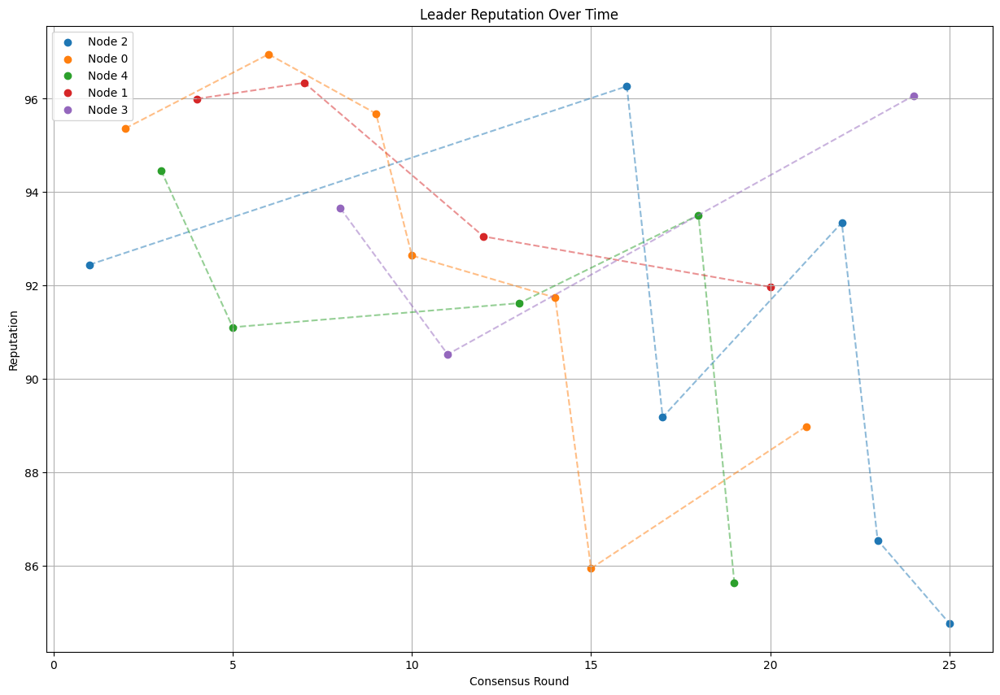


--- Consensus Round 26 ---

Primary Node for this round: Node 0
Primary Node Reputation: 96.75447143133363
Primary Node Malicious Count: 0
Node 0 generates proof: f8015003f3f9ecba59894374e3ceb5628500247b421a602599bb9e01cb72436a
Node 1 verifies proof: f8015003f3f9ecba59894374e3ceb5628500247b421a602599bb9e01cb72436a against expected: f8015003f3f9ecba59894374e3ceb5628500247b421a602599bb9e01cb72436a
Validation time: 0.000024 seconds
Node 2 verifies proof: f8015003f3f9ecba59894374e3ceb5628500247b421a602599bb9e01cb72436a against expected: f8015003f3f9ecba59894374e3ceb5628500247b421a602599bb9e01cb72436a
Validation time: 0.000020 seconds
Node 3 verifies proof: f8015003f3f9ecba59894374e3ceb5628500247b421a602599bb9e01cb72436a against expected: f8015003f3f9ecba59894374e3ceb5628500247b421a602599bb9e01cb72436a
Validation time: 0.000016 seconds
Node 4 verifies proof: f8015003f3f9ecba59894374e3ceb5628500247b421a602599bb9e01cb72436a against expected: f8015003f3f9ecba59894374e3ceb5628500247b421a602599

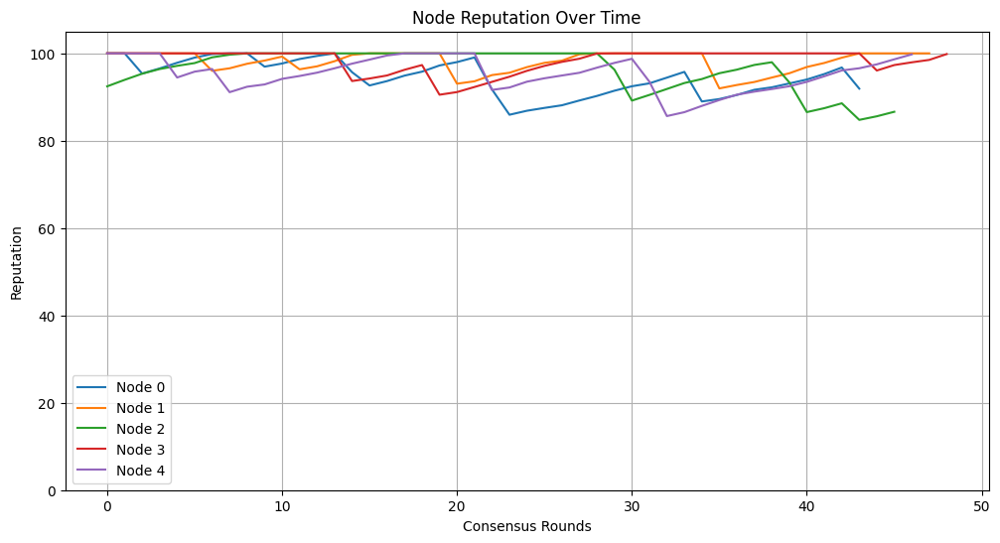


Leader Performance Summary:
Node 2:
 Times as leader: 6
 Average Latency: 0.050956 seconds
 Average Throughput: 341.41 tweets per second
 Average Reputation: 90.42
 Total Malicious Detections: 0
Node 0:
 Times as leader: 8
 Average Latency: 0.050636 seconds
 Average Throughput: 385.04 tweets per second
 Average Reputation: 92.40
 Total Malicious Detections: 0
Node 4:
 Times as leader: 5
 Average Latency: 0.058918 seconds
 Average Throughput: 330.23 tweets per second
 Average Reputation: 91.27
 Total Malicious Detections: 0
Node 1:
 Times as leader: 4
 Average Latency: 0.048787 seconds
 Average Throughput: 359.37 tweets per second
 Average Reputation: 94.34
 Total Malicious Detections: 0
Node 3:
 Times as leader: 3
 Average Latency: 0.043680 seconds
 Average Throughput: 380.66 tweets per second
 Average Reputation: 93.41
 Total Malicious Detections: 0


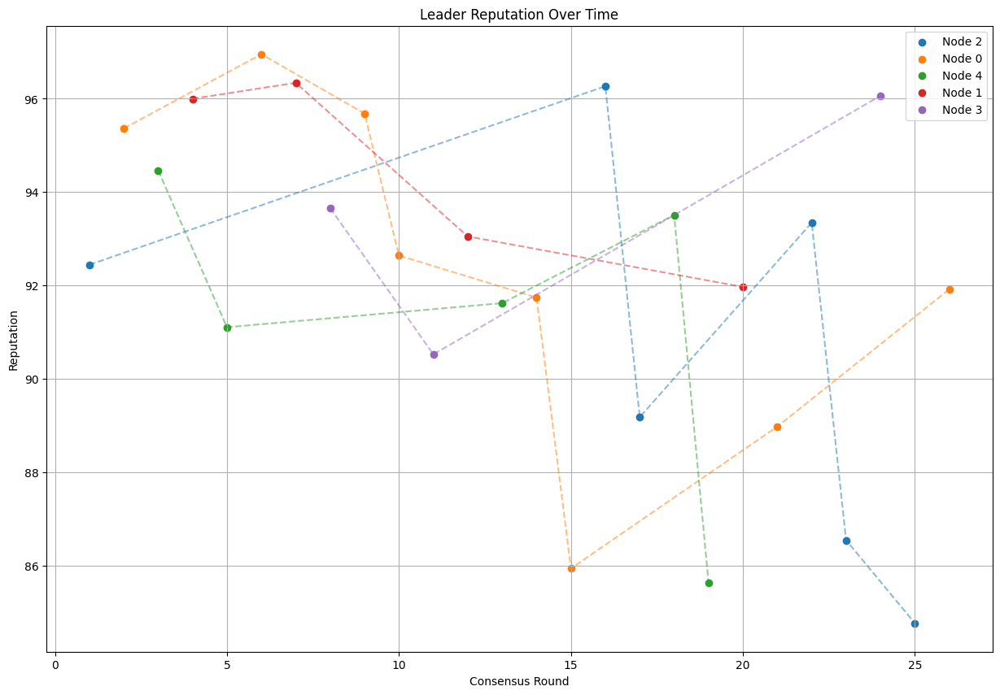


--- Consensus Round 27 ---

Primary Node for this round: Node 0
Primary Node Reputation: 91.9173182010791
Primary Node Malicious Count: 0
Node 0 generates proof: 17a0d8c8a5a2eaa142f066d3774e3687e7cd7715298b2a57833bfaec408ee950
Node 1 verifies proof: 17a0d8c8a5a2eaa142f066d3774e3687e7cd7715298b2a57833bfaec408ee950 against expected: 17a0d8c8a5a2eaa142f066d3774e3687e7cd7715298b2a57833bfaec408ee950
Validation time: 0.000021 seconds
Node 2 verifies proof: 17a0d8c8a5a2eaa142f066d3774e3687e7cd7715298b2a57833bfaec408ee950 against expected: 17a0d8c8a5a2eaa142f066d3774e3687e7cd7715298b2a57833bfaec408ee950
Validation time: 0.000027 seconds
Node 3 verifies proof: 17a0d8c8a5a2eaa142f066d3774e3687e7cd7715298b2a57833bfaec408ee950 against expected: 17a0d8c8a5a2eaa142f066d3774e3687e7cd7715298b2a57833bfaec408ee950
Validation time: 0.000045 seconds
Node 4 verifies proof: 17a0d8c8a5a2eaa142f066d3774e3687e7cd7715298b2a57833bfaec408ee950 against expected: 17a0d8c8a5a2eaa142f066d3774e3687e7cd7715298b2a57833

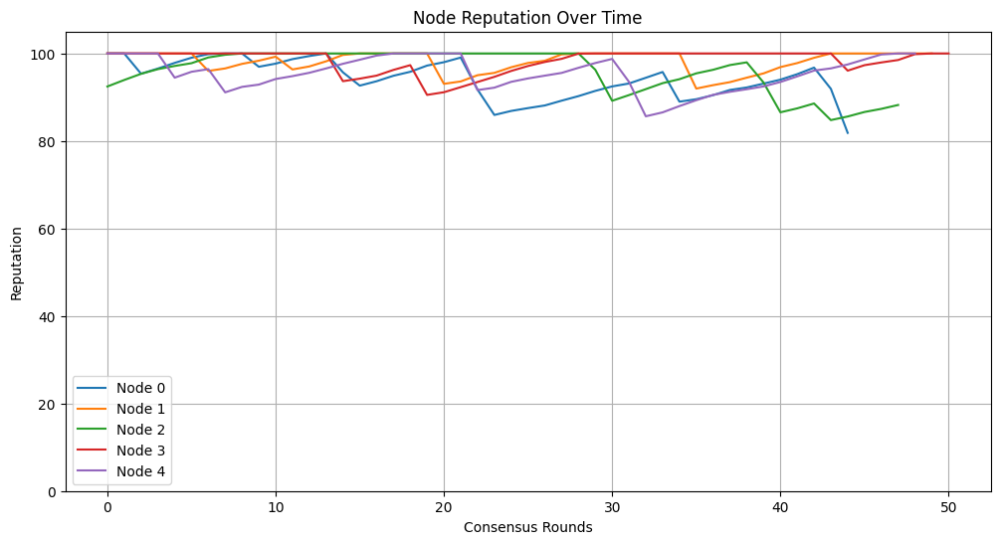


Leader Performance Summary:
Node 2:
 Times as leader: 6
 Average Latency: 0.050956 seconds
 Average Throughput: 341.41 tweets per second
 Average Reputation: 90.42
 Total Malicious Detections: 0
Node 0:
 Times as leader: 9
 Average Latency: 0.049910 seconds
 Average Throughput: 382.57 tweets per second
 Average Reputation: 91.23
 Total Malicious Detections: 0
Node 4:
 Times as leader: 5
 Average Latency: 0.058918 seconds
 Average Throughput: 330.23 tweets per second
 Average Reputation: 91.27
 Total Malicious Detections: 0
Node 1:
 Times as leader: 4
 Average Latency: 0.048787 seconds
 Average Throughput: 359.37 tweets per second
 Average Reputation: 94.34
 Total Malicious Detections: 0
Node 3:
 Times as leader: 3
 Average Latency: 0.043680 seconds
 Average Throughput: 380.66 tweets per second
 Average Reputation: 93.41
 Total Malicious Detections: 0


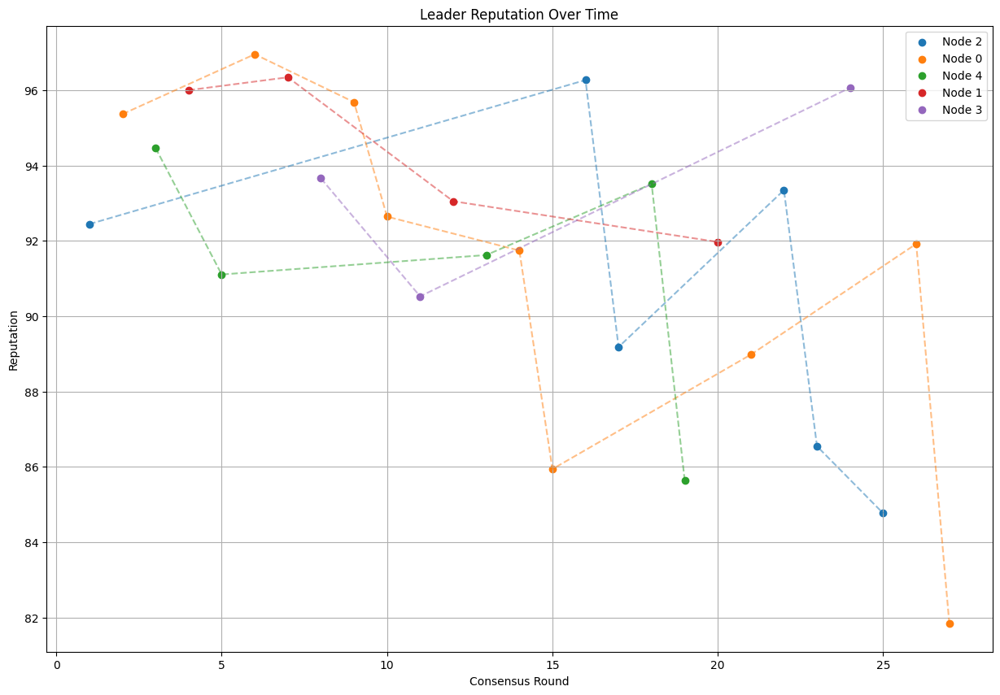


--- Consensus Round 28 ---

Primary Node for this round: Node 2
Primary Node Reputation: 88.2214928412305
Primary Node Malicious Count: 0
Node 2 generates proof: 8e9383b3c512f0f502b5123d6baa336504b3e1c94bac3d7406674e68e58cc30f
Node 0 verifies proof: 8e9383b3c512f0f502b5123d6baa336504b3e1c94bac3d7406674e68e58cc30f against expected: 8e9383b3c512f0f502b5123d6baa336504b3e1c94bac3d7406674e68e58cc30f
Validation time: 0.000028 seconds
Node 1 verifies proof: 8e9383b3c512f0f502b5123d6baa336504b3e1c94bac3d7406674e68e58cc30f against expected: 8e9383b3c512f0f502b5123d6baa336504b3e1c94bac3d7406674e68e58cc30f
Validation time: 0.000023 seconds
Node 3 verifies proof: 8e9383b3c512f0f502b5123d6baa336504b3e1c94bac3d7406674e68e58cc30f against expected: 8e9383b3c512f0f502b5123d6baa336504b3e1c94bac3d7406674e68e58cc30f
Validation time: 0.000018 seconds
Node 4 verifies proof: 8e9383b3c512f0f502b5123d6baa336504b3e1c94bac3d7406674e68e58cc30f against expected: 8e9383b3c512f0f502b5123d6baa336504b3e1c94bac3d74066

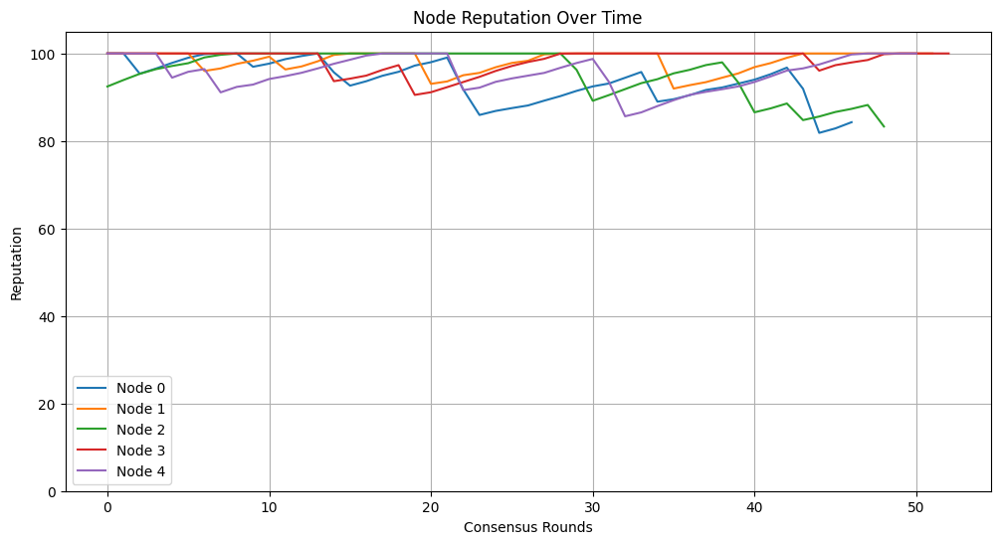


Leader Performance Summary:
Node 2:
 Times as leader: 7
 Average Latency: 0.049749 seconds
 Average Throughput: 346.41 tweets per second
 Average Reputation: 89.41
 Total Malicious Detections: 0
Node 0:
 Times as leader: 9
 Average Latency: 0.049910 seconds
 Average Throughput: 382.57 tweets per second
 Average Reputation: 91.23
 Total Malicious Detections: 0
Node 4:
 Times as leader: 5
 Average Latency: 0.058918 seconds
 Average Throughput: 330.23 tweets per second
 Average Reputation: 91.27
 Total Malicious Detections: 0
Node 1:
 Times as leader: 4
 Average Latency: 0.048787 seconds
 Average Throughput: 359.37 tweets per second
 Average Reputation: 94.34
 Total Malicious Detections: 0
Node 3:
 Times as leader: 3
 Average Latency: 0.043680 seconds
 Average Throughput: 380.66 tweets per second
 Average Reputation: 93.41
 Total Malicious Detections: 0


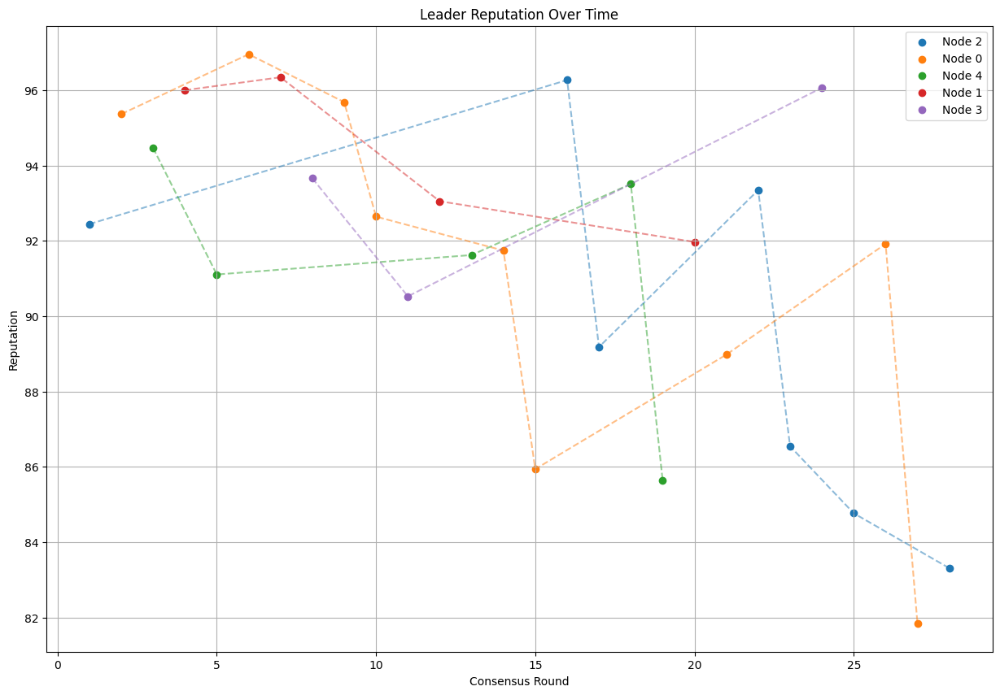


--- Consensus Round 29 ---

Primary Node for this round: Node 2
Primary Node Reputation: 83.30720504331056
Primary Node Malicious Count: 0
Node 2 generates proof: cebe3bfc7f3d542fec4dc9fdd4e03841b4b955fe5d7e58fd3babecaed43faafa
Node 0 verifies proof: cebe3bfc7f3d542fec4dc9fdd4e03841b4b955fe5d7e58fd3babecaed43faafa against expected: cebe3bfc7f3d542fec4dc9fdd4e03841b4b955fe5d7e58fd3babecaed43faafa
Validation time: 0.000025 seconds
Node 1 verifies proof: cebe3bfc7f3d542fec4dc9fdd4e03841b4b955fe5d7e58fd3babecaed43faafa against expected: cebe3bfc7f3d542fec4dc9fdd4e03841b4b955fe5d7e58fd3babecaed43faafa
Validation time: 0.000037 seconds
Node 3 verifies proof: cebe3bfc7f3d542fec4dc9fdd4e03841b4b955fe5d7e58fd3babecaed43faafa against expected: cebe3bfc7f3d542fec4dc9fdd4e03841b4b955fe5d7e58fd3babecaed43faafa
Validation time: 0.000017 seconds
Node 4 verifies proof: cebe3bfc7f3d542fec4dc9fdd4e03841b4b955fe5d7e58fd3babecaed43faafa against expected: cebe3bfc7f3d542fec4dc9fdd4e03841b4b955fe5d7e58fd3b

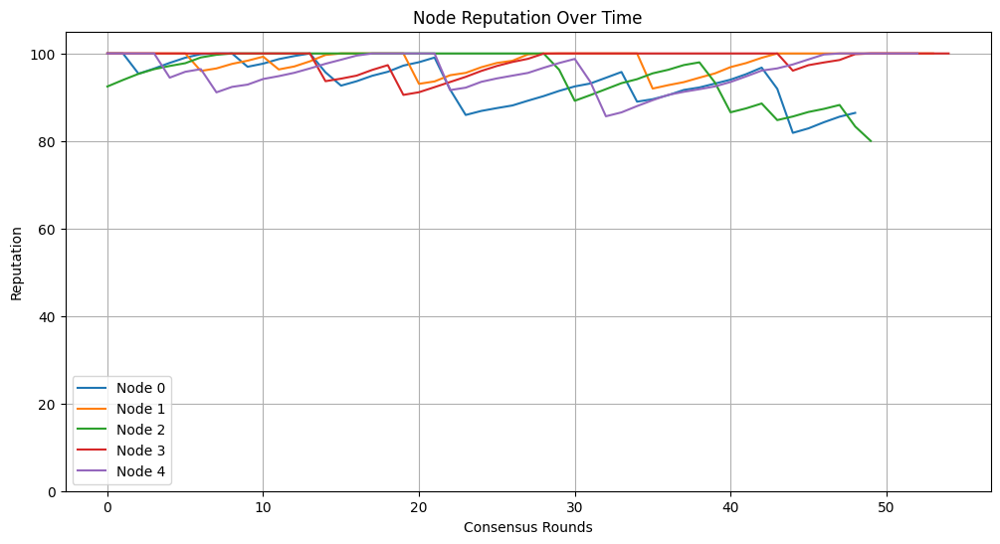


Leader Performance Summary:
Node 2:
 Times as leader: 8
 Average Latency: 0.048997 seconds
 Average Throughput: 348.85 tweets per second
 Average Reputation: 88.23
 Total Malicious Detections: 0
Node 0:
 Times as leader: 9
 Average Latency: 0.049910 seconds
 Average Throughput: 382.57 tweets per second
 Average Reputation: 91.23
 Total Malicious Detections: 0
Node 4:
 Times as leader: 5
 Average Latency: 0.058918 seconds
 Average Throughput: 330.23 tweets per second
 Average Reputation: 91.27
 Total Malicious Detections: 0
Node 1:
 Times as leader: 4
 Average Latency: 0.048787 seconds
 Average Throughput: 359.37 tweets per second
 Average Reputation: 94.34
 Total Malicious Detections: 0
Node 3:
 Times as leader: 3
 Average Latency: 0.043680 seconds
 Average Throughput: 380.66 tweets per second
 Average Reputation: 93.41
 Total Malicious Detections: 0


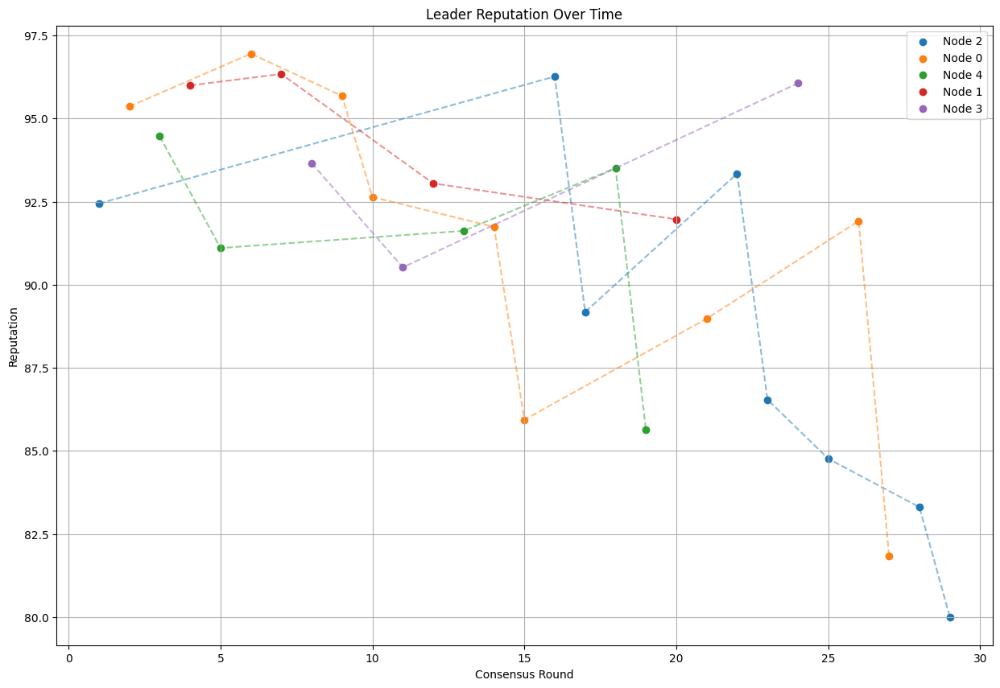


--- Consensus Round 30 ---

Primary Node for this round: Node 4
Primary Node Reputation: 100
Primary Node Malicious Count: 0
Node 4 generates proof: a0d38b43cf121c5b3ad90cf07164b939da21aedfafe912657875100a18eda9dd
Node 0 verifies proof: a0d38b43cf121c5b3ad90cf07164b939da21aedfafe912657875100a18eda9dd against expected: a0d38b43cf121c5b3ad90cf07164b939da21aedfafe912657875100a18eda9dd
Validation time: 0.000026 seconds
Node 1 verifies proof: a0d38b43cf121c5b3ad90cf07164b939da21aedfafe912657875100a18eda9dd against expected: a0d38b43cf121c5b3ad90cf07164b939da21aedfafe912657875100a18eda9dd
Validation time: 0.000018 seconds
Node 2 verifies proof: a0d38b43cf121c5b3ad90cf07164b939da21aedfafe912657875100a18eda9dd against expected: a0d38b43cf121c5b3ad90cf07164b939da21aedfafe912657875100a18eda9dd
Validation time: 0.000027 seconds
Node 3 verifies proof: a0d38b43cf121c5b3ad90cf07164b939da21aedfafe912657875100a18eda9dd against expected: a0d38b43cf121c5b3ad90cf07164b939da21aedfafe912657875100a18eda9dd

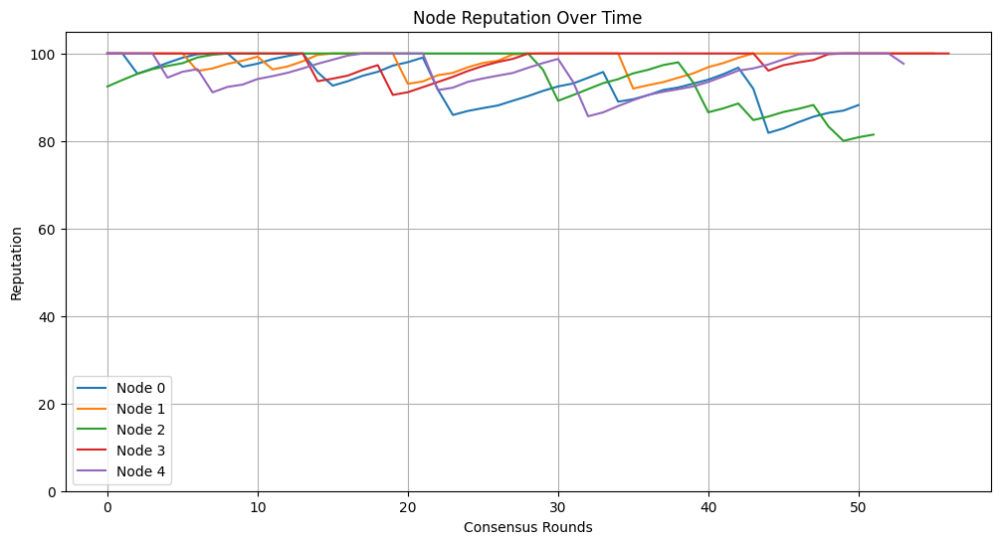


Leader Performance Summary:
Node 2:
 Times as leader: 8
 Average Latency: 0.048997 seconds
 Average Throughput: 348.85 tweets per second
 Average Reputation: 88.23
 Total Malicious Detections: 0
Node 0:
 Times as leader: 9
 Average Latency: 0.049910 seconds
 Average Throughput: 382.57 tweets per second
 Average Reputation: 91.23
 Total Malicious Detections: 0
Node 4:
 Times as leader: 6
 Average Latency: 0.056169 seconds
 Average Throughput: 338.05 tweets per second
 Average Reputation: 92.33
 Total Malicious Detections: 0
Node 1:
 Times as leader: 4
 Average Latency: 0.048787 seconds
 Average Throughput: 359.37 tweets per second
 Average Reputation: 94.34
 Total Malicious Detections: 0
Node 3:
 Times as leader: 3
 Average Latency: 0.043680 seconds
 Average Throughput: 380.66 tweets per second
 Average Reputation: 93.41
 Total Malicious Detections: 0


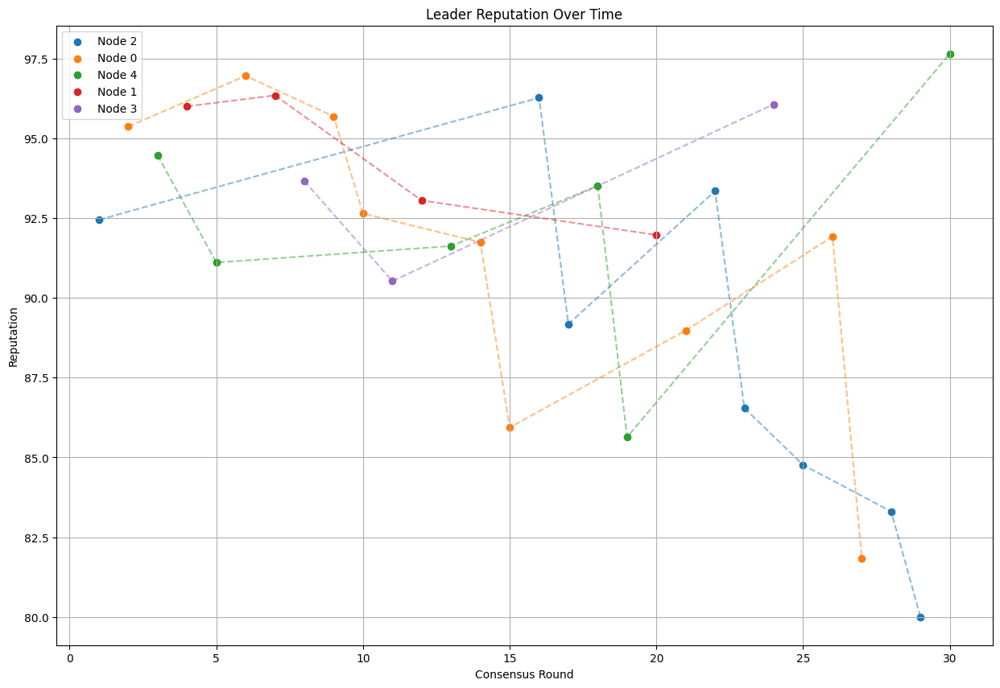


--- Consensus Round 31 ---

Primary Node for this round: Node 3
Primary Node Reputation: 100
Primary Node Malicious Count: 0
Node 3 generates proof: 59546599f3e0c68aba158d3864999ca24f320680471b28e7511ec61b914cc3c2
Node 0 verifies proof: 59546599f3e0c68aba158d3864999ca24f320680471b28e7511ec61b914cc3c2 against expected: 59546599f3e0c68aba158d3864999ca24f320680471b28e7511ec61b914cc3c2
Validation time: 0.000031 seconds
Node 1 verifies proof: 59546599f3e0c68aba158d3864999ca24f320680471b28e7511ec61b914cc3c2 against expected: 59546599f3e0c68aba158d3864999ca24f320680471b28e7511ec61b914cc3c2
Validation time: 0.000024 seconds
Node 2 verifies proof: 59546599f3e0c68aba158d3864999ca24f320680471b28e7511ec61b914cc3c2 against expected: 59546599f3e0c68aba158d3864999ca24f320680471b28e7511ec61b914cc3c2
Validation time: 0.000021 seconds
Node 4 verifies proof: 59546599f3e0c68aba158d3864999ca24f320680471b28e7511ec61b914cc3c2 against expected: 59546599f3e0c68aba158d3864999ca24f320680471b28e7511ec61b914cc3c2

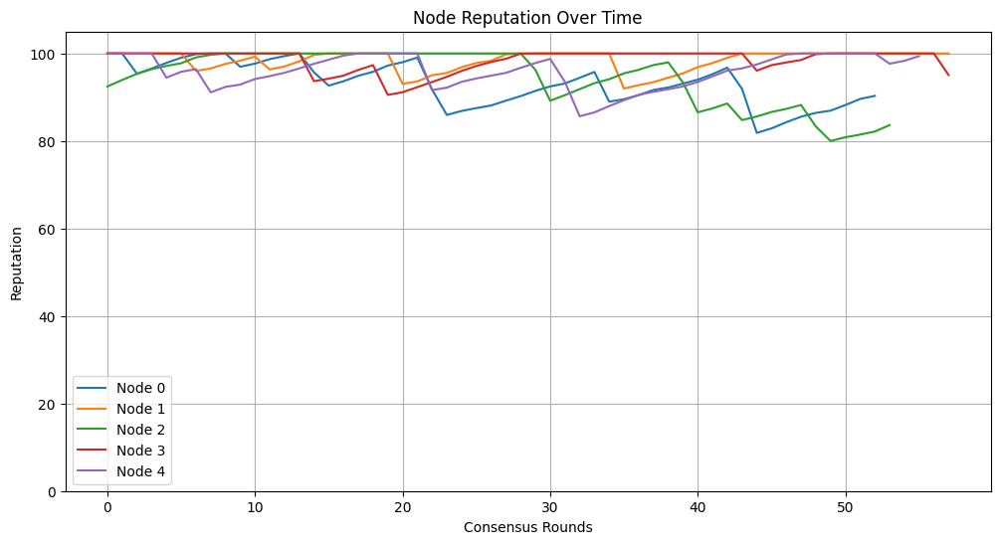


Leader Performance Summary:
Node 2:
 Times as leader: 8
 Average Latency: 0.048997 seconds
 Average Throughput: 348.85 tweets per second
 Average Reputation: 88.23
 Total Malicious Detections: 0
Node 0:
 Times as leader: 9
 Average Latency: 0.049910 seconds
 Average Throughput: 382.57 tweets per second
 Average Reputation: 91.23
 Total Malicious Detections: 0
Node 4:
 Times as leader: 6
 Average Latency: 0.056169 seconds
 Average Throughput: 338.05 tweets per second
 Average Reputation: 92.33
 Total Malicious Detections: 0
Node 1:
 Times as leader: 4
 Average Latency: 0.048787 seconds
 Average Throughput: 359.37 tweets per second
 Average Reputation: 94.34
 Total Malicious Detections: 0
Node 3:
 Times as leader: 4
 Average Latency: 0.043063 seconds
 Average Throughput: 382.55 tweets per second
 Average Reputation: 93.82
 Total Malicious Detections: 0


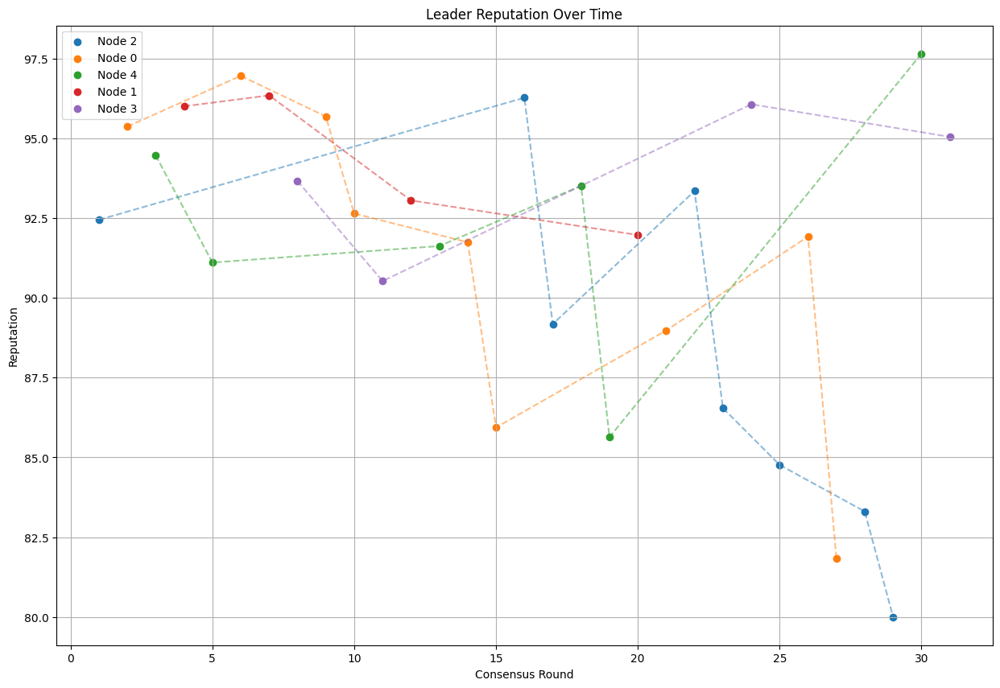


--- Consensus Round 32 ---

Primary Node for this round: Node 4
Primary Node Reputation: 99.3842474896888
Primary Node Malicious Count: 0
Node 4 generates proof: 2389f9c85e40d3342cad17b32565320b3ec1509213c2f4f8fb8661015e1d1c11
Node 0 verifies proof: 2389f9c85e40d3342cad17b32565320b3ec1509213c2f4f8fb8661015e1d1c11 against expected: 2389f9c85e40d3342cad17b32565320b3ec1509213c2f4f8fb8661015e1d1c11
Validation time: 0.000029 seconds
Node 1 verifies proof: 2389f9c85e40d3342cad17b32565320b3ec1509213c2f4f8fb8661015e1d1c11 against expected: 2389f9c85e40d3342cad17b32565320b3ec1509213c2f4f8fb8661015e1d1c11
Validation time: 0.000029 seconds
Node 2 verifies proof: 2389f9c85e40d3342cad17b32565320b3ec1509213c2f4f8fb8661015e1d1c11 against expected: 2389f9c85e40d3342cad17b32565320b3ec1509213c2f4f8fb8661015e1d1c11
Validation time: 0.000026 seconds
Node 3 verifies proof: 2389f9c85e40d3342cad17b32565320b3ec1509213c2f4f8fb8661015e1d1c11 against expected: 2389f9c85e40d3342cad17b32565320b3ec1509213c2f4f8fb8

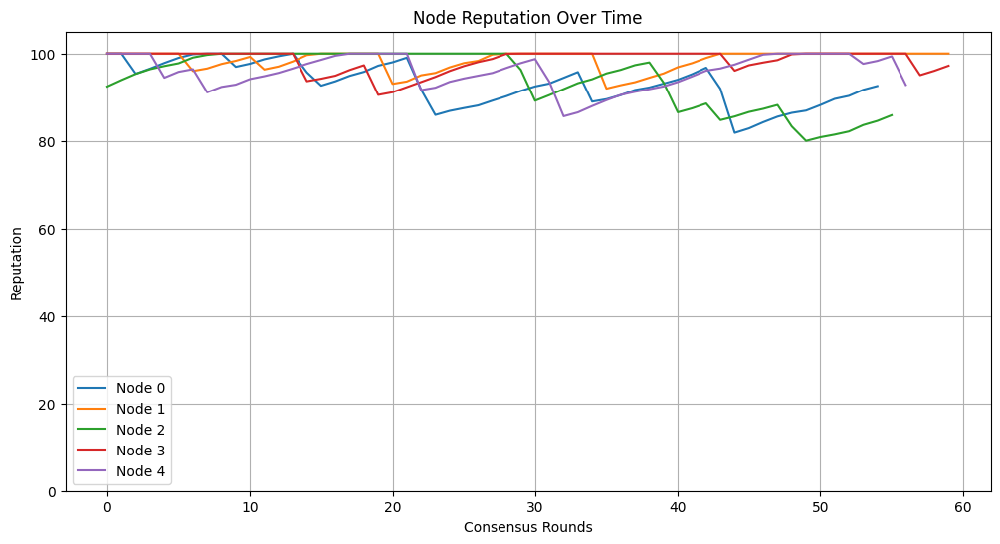


Leader Performance Summary:
Node 2:
 Times as leader: 8
 Average Latency: 0.048997 seconds
 Average Throughput: 348.85 tweets per second
 Average Reputation: 88.23
 Total Malicious Detections: 0
Node 0:
 Times as leader: 9
 Average Latency: 0.049910 seconds
 Average Throughput: 382.57 tweets per second
 Average Reputation: 91.23
 Total Malicious Detections: 0
Node 4:
 Times as leader: 7
 Average Latency: 0.054992 seconds
 Average Throughput: 337.44 tweets per second
 Average Reputation: 92.40
 Total Malicious Detections: 0
Node 1:
 Times as leader: 4
 Average Latency: 0.048787 seconds
 Average Throughput: 359.37 tweets per second
 Average Reputation: 94.34
 Total Malicious Detections: 0
Node 3:
 Times as leader: 4
 Average Latency: 0.043063 seconds
 Average Throughput: 382.55 tweets per second
 Average Reputation: 93.82
 Total Malicious Detections: 0


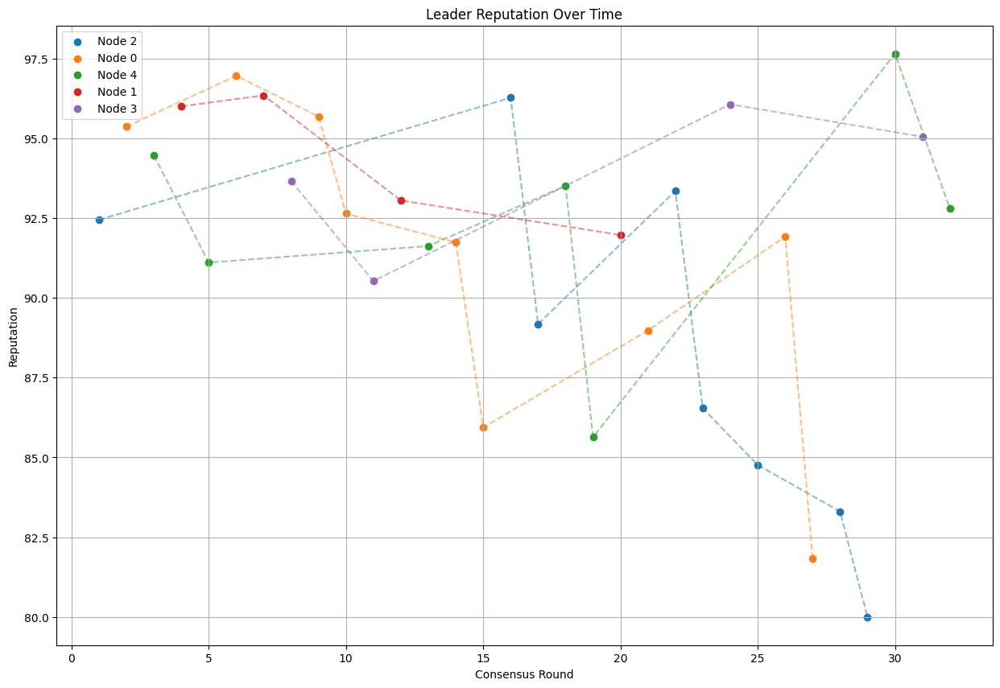


--- Consensus Round 33 ---

Primary Node for this round: Node 3
Primary Node Reputation: 97.20452532506047
Primary Node Malicious Count: 0
Node 3 generates proof: c4f9d39e55dccb92e87ae5b60feb5150fa908c9565ce267900565412d6a75b5d
Node 0 verifies proof: c4f9d39e55dccb92e87ae5b60feb5150fa908c9565ce267900565412d6a75b5d against expected: c4f9d39e55dccb92e87ae5b60feb5150fa908c9565ce267900565412d6a75b5d
Validation time: 0.000028 seconds
Node 1 verifies proof: c4f9d39e55dccb92e87ae5b60feb5150fa908c9565ce267900565412d6a75b5d against expected: c4f9d39e55dccb92e87ae5b60feb5150fa908c9565ce267900565412d6a75b5d
Validation time: 0.000040 seconds
Node 2 verifies proof: c4f9d39e55dccb92e87ae5b60feb5150fa908c9565ce267900565412d6a75b5d against expected: c4f9d39e55dccb92e87ae5b60feb5150fa908c9565ce267900565412d6a75b5d
Validation time: 0.000029 seconds
Node 4 verifies proof: c4f9d39e55dccb92e87ae5b60feb5150fa908c9565ce267900565412d6a75b5d against expected: c4f9d39e55dccb92e87ae5b60feb5150fa908c9565ce267900

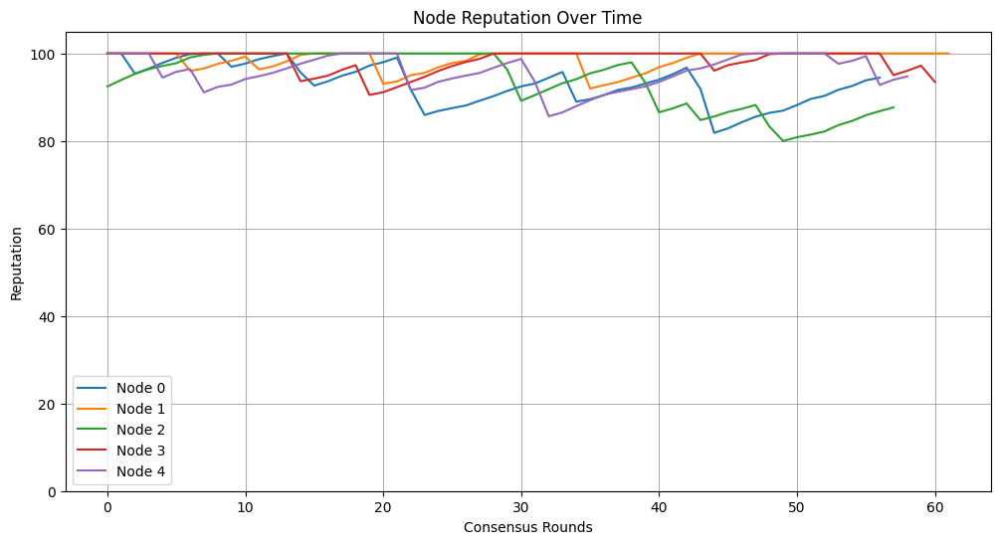


Leader Performance Summary:
Node 2:
 Times as leader: 8
 Average Latency: 0.048997 seconds
 Average Throughput: 348.85 tweets per second
 Average Reputation: 88.23
 Total Malicious Detections: 0
Node 0:
 Times as leader: 9
 Average Latency: 0.049910 seconds
 Average Throughput: 382.57 tweets per second
 Average Reputation: 91.23
 Total Malicious Detections: 0
Node 4:
 Times as leader: 7
 Average Latency: 0.054992 seconds
 Average Throughput: 337.44 tweets per second
 Average Reputation: 92.40
 Total Malicious Detections: 0
Node 1:
 Times as leader: 4
 Average Latency: 0.048787 seconds
 Average Throughput: 359.37 tweets per second
 Average Reputation: 94.34
 Total Malicious Detections: 0
Node 3:
 Times as leader: 5
 Average Latency: 0.043946 seconds
 Average Throughput: 373.44 tweets per second
 Average Reputation: 93.76
 Total Malicious Detections: 0


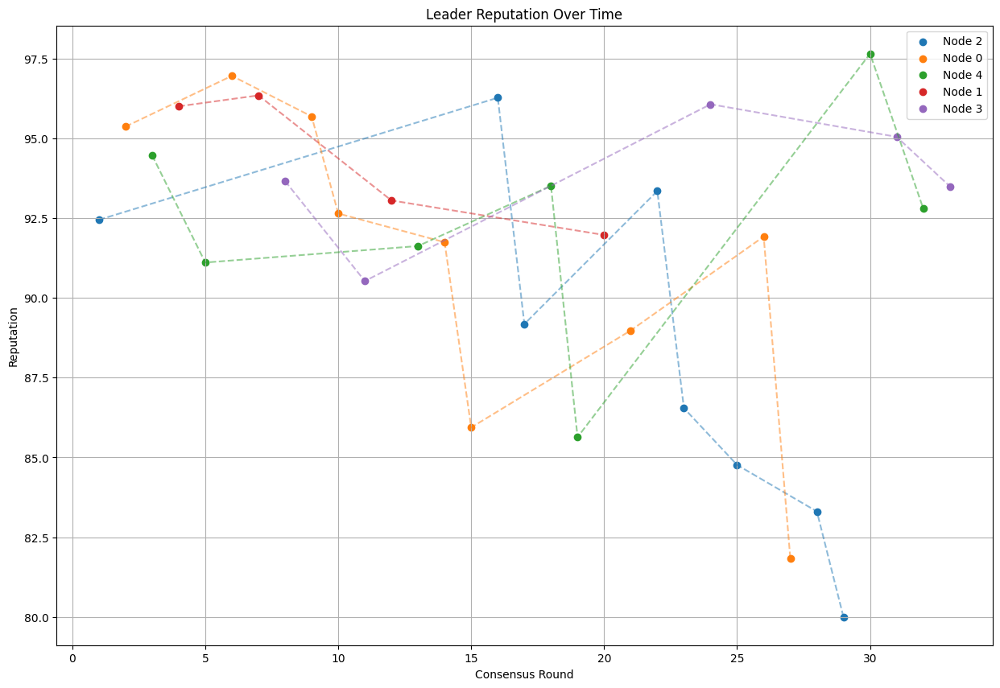


--- Consensus Round 34 ---

Primary Node for this round: Node 4
Primary Node Reputation: 94.74397330726248
Primary Node Malicious Count: 0
Node 4 generates proof: b8e1b8af619d099378672b9e39c43bbae6ae199cae7cc3d5e21047b6bb543092
Node 0 verifies proof: b8e1b8af619d099378672b9e39c43bbae6ae199cae7cc3d5e21047b6bb543092 against expected: b8e1b8af619d099378672b9e39c43bbae6ae199cae7cc3d5e21047b6bb543092
Validation time: 0.000020 seconds
Node 1 verifies proof: b8e1b8af619d099378672b9e39c43bbae6ae199cae7cc3d5e21047b6bb543092 against expected: b8e1b8af619d099378672b9e39c43bbae6ae199cae7cc3d5e21047b6bb543092
Validation time: 0.000019 seconds
Node 2 verifies proof: b8e1b8af619d099378672b9e39c43bbae6ae199cae7cc3d5e21047b6bb543092 against expected: b8e1b8af619d099378672b9e39c43bbae6ae199cae7cc3d5e21047b6bb543092
Validation time: 0.000016 seconds
Node 3 verifies proof: b8e1b8af619d099378672b9e39c43bbae6ae199cae7cc3d5e21047b6bb543092 against expected: b8e1b8af619d099378672b9e39c43bbae6ae199cae7cc3d5e2

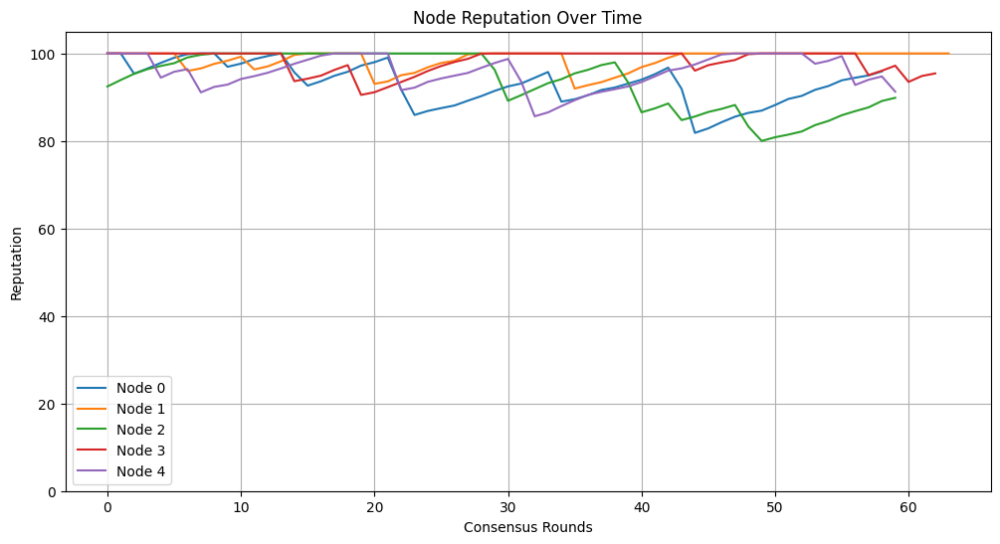


Leader Performance Summary:
Node 2:
 Times as leader: 8
 Average Latency: 0.048997 seconds
 Average Throughput: 348.85 tweets per second
 Average Reputation: 88.23
 Total Malicious Detections: 0
Node 0:
 Times as leader: 9
 Average Latency: 0.049910 seconds
 Average Throughput: 382.57 tweets per second
 Average Reputation: 91.23
 Total Malicious Detections: 0
Node 4:
 Times as leader: 8
 Average Latency: 0.053707 seconds
 Average Throughput: 340.00 tweets per second
 Average Reputation: 92.26
 Total Malicious Detections: 0
Node 1:
 Times as leader: 4
 Average Latency: 0.048787 seconds
 Average Throughput: 359.37 tweets per second
 Average Reputation: 94.34
 Total Malicious Detections: 0
Node 3:
 Times as leader: 5
 Average Latency: 0.043946 seconds
 Average Throughput: 373.44 tweets per second
 Average Reputation: 93.76
 Total Malicious Detections: 0


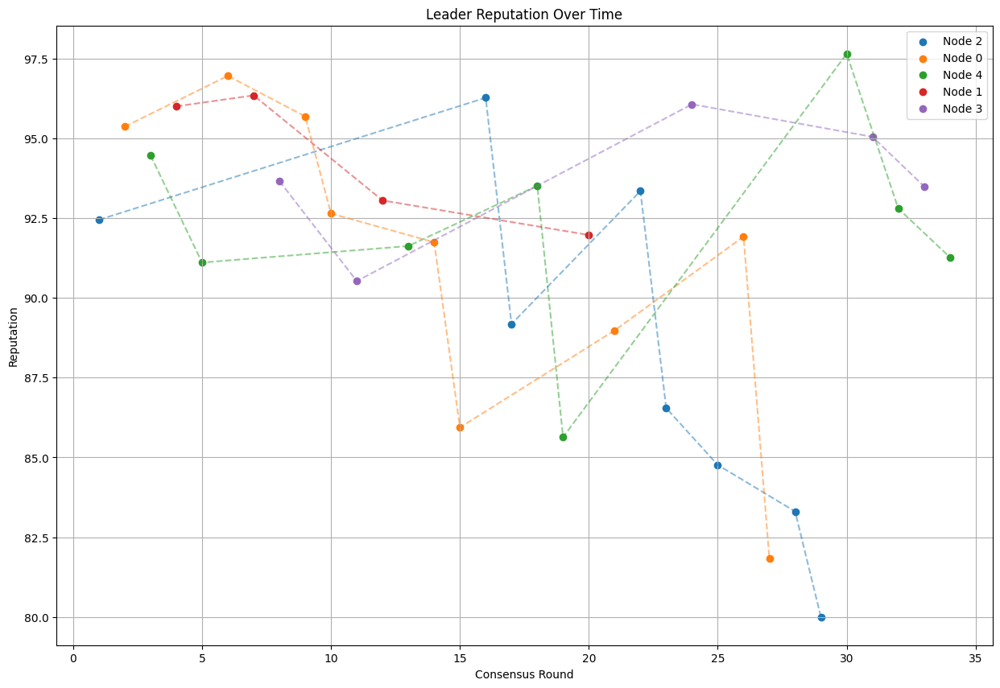


--- Consensus Round 35 ---

Primary Node for this round: Node 1
Primary Node Reputation: 100
Primary Node Malicious Count: 0
Node 1 generates proof: 18aa282c23470548dbdde3b12d5775cb73476046983296d928f69acfcbe4b044
Node 0 verifies proof: 18aa282c23470548dbdde3b12d5775cb73476046983296d928f69acfcbe4b044 against expected: 18aa282c23470548dbdde3b12d5775cb73476046983296d928f69acfcbe4b044
Validation time: 0.000010 seconds
Node 2 verifies proof: 18aa282c23470548dbdde3b12d5775cb73476046983296d928f69acfcbe4b044 against expected: 18aa282c23470548dbdde3b12d5775cb73476046983296d928f69acfcbe4b044
Validation time: 0.000007 seconds
Node 3 verifies proof: 18aa282c23470548dbdde3b12d5775cb73476046983296d928f69acfcbe4b044 against expected: 18aa282c23470548dbdde3b12d5775cb73476046983296d928f69acfcbe4b044
Validation time: 0.000006 seconds
Node 4 verifies proof: 18aa282c23470548dbdde3b12d5775cb73476046983296d928f69acfcbe4b044 against expected: 18aa282c23470548dbdde3b12d5775cb73476046983296d928f69acfcbe4b044

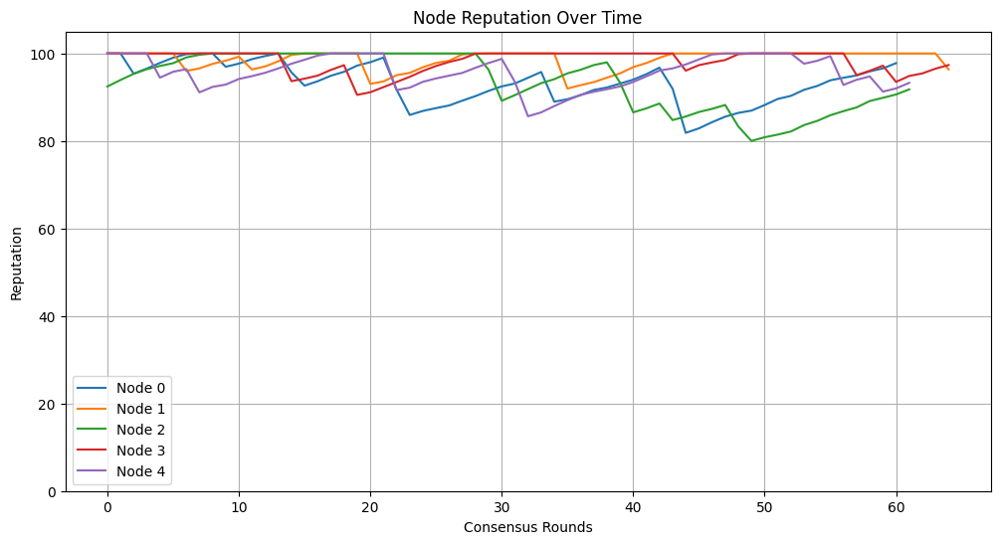


Leader Performance Summary:
Node 2:
 Times as leader: 8
 Average Latency: 0.048997 seconds
 Average Throughput: 348.85 tweets per second
 Average Reputation: 88.23
 Total Malicious Detections: 0
Node 0:
 Times as leader: 9
 Average Latency: 0.049910 seconds
 Average Throughput: 382.57 tweets per second
 Average Reputation: 91.23
 Total Malicious Detections: 0
Node 4:
 Times as leader: 8
 Average Latency: 0.053707 seconds
 Average Throughput: 340.00 tweets per second
 Average Reputation: 92.26
 Total Malicious Detections: 0
Node 1:
 Times as leader: 5
 Average Latency: 0.046602 seconds
 Average Throughput: 372.02 tweets per second
 Average Reputation: 94.74
 Total Malicious Detections: 0
Node 3:
 Times as leader: 5
 Average Latency: 0.043946 seconds
 Average Throughput: 373.44 tweets per second
 Average Reputation: 93.76
 Total Malicious Detections: 0


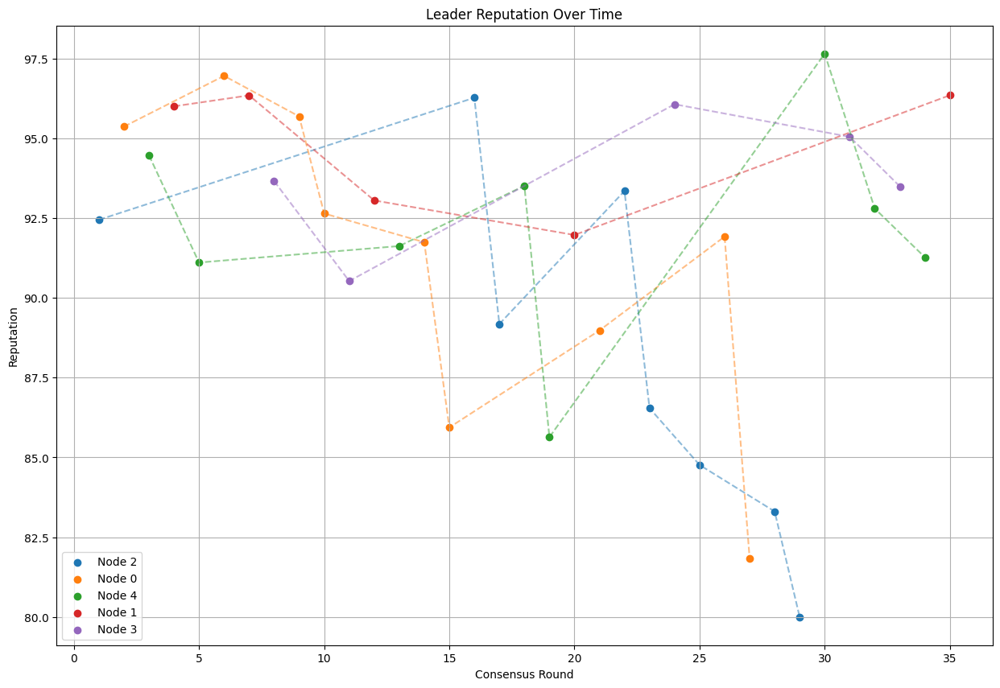


--- Consensus Round 36 ---

Primary Node for this round: Node 0
Primary Node Reputation: 97.77524460174115
Primary Node Malicious Count: 0
Node 0 generates proof: 065e4f1fe44adf7e0840595e30276f7367c0a0add2da33f33c8302a2de4775ec
Node 1 verifies proof: 065e4f1fe44adf7e0840595e30276f7367c0a0add2da33f33c8302a2de4775ec against expected: 065e4f1fe44adf7e0840595e30276f7367c0a0add2da33f33c8302a2de4775ec
Validation time: 0.000010 seconds
Node 2 verifies proof: 065e4f1fe44adf7e0840595e30276f7367c0a0add2da33f33c8302a2de4775ec against expected: 065e4f1fe44adf7e0840595e30276f7367c0a0add2da33f33c8302a2de4775ec
Validation time: 0.000010 seconds
Node 3 verifies proof: 065e4f1fe44adf7e0840595e30276f7367c0a0add2da33f33c8302a2de4775ec against expected: 065e4f1fe44adf7e0840595e30276f7367c0a0add2da33f33c8302a2de4775ec
Validation time: 0.000007 seconds
Node 4 verifies proof: 065e4f1fe44adf7e0840595e30276f7367c0a0add2da33f33c8302a2de4775ec against expected: 065e4f1fe44adf7e0840595e30276f7367c0a0add2da33f33c

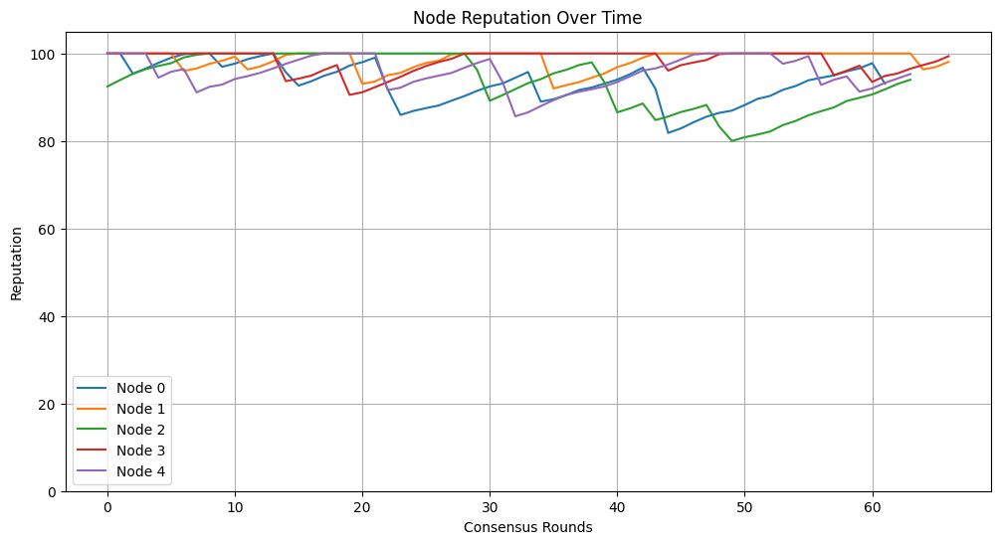


Leader Performance Summary:
Node 2:
 Times as leader: 8
 Average Latency: 0.048997 seconds
 Average Throughput: 348.85 tweets per second
 Average Reputation: 88.23
 Total Malicious Detections: 0
Node 0:
 Times as leader: 10
 Average Latency: 0.048642 seconds
 Average Throughput: 387.29 tweets per second
 Average Reputation: 91.42
 Total Malicious Detections: 0
Node 4:
 Times as leader: 8
 Average Latency: 0.053707 seconds
 Average Throughput: 340.00 tweets per second
 Average Reputation: 92.26
 Total Malicious Detections: 0
Node 1:
 Times as leader: 5
 Average Latency: 0.046602 seconds
 Average Throughput: 372.02 tweets per second
 Average Reputation: 94.74
 Total Malicious Detections: 0
Node 3:
 Times as leader: 5
 Average Latency: 0.043946 seconds
 Average Throughput: 373.44 tweets per second
 Average Reputation: 93.76
 Total Malicious Detections: 0


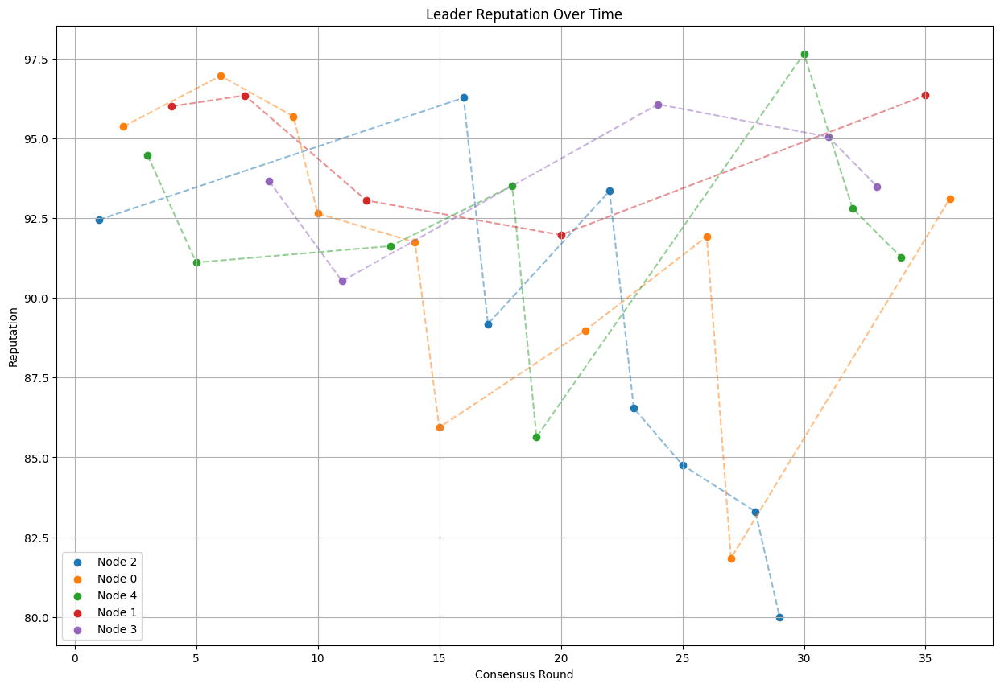


--- Consensus Round 37 ---

Primary Node for this round: Node 2
Primary Node Reputation: 93.97838092609257
Primary Node Malicious Count: 0
Node 2 generates proof: 36f020a07e624364af4df17863582e41ff9e59363d832b577325fac9e317317b
Node 0 verifies proof: 36f020a07e624364af4df17863582e41ff9e59363d832b577325fac9e317317b against expected: 36f020a07e624364af4df17863582e41ff9e59363d832b577325fac9e317317b
Validation time: 0.000015 seconds
Node 1 verifies proof: 36f020a07e624364af4df17863582e41ff9e59363d832b577325fac9e317317b against expected: 36f020a07e624364af4df17863582e41ff9e59363d832b577325fac9e317317b
Validation time: 0.000008 seconds
Node 3 verifies proof: 36f020a07e624364af4df17863582e41ff9e59363d832b577325fac9e317317b against expected: 36f020a07e624364af4df17863582e41ff9e59363d832b577325fac9e317317b
Validation time: 0.000015 seconds
Node 4 verifies proof: 36f020a07e624364af4df17863582e41ff9e59363d832b577325fac9e317317b against expected: 36f020a07e624364af4df17863582e41ff9e59363d832b5773

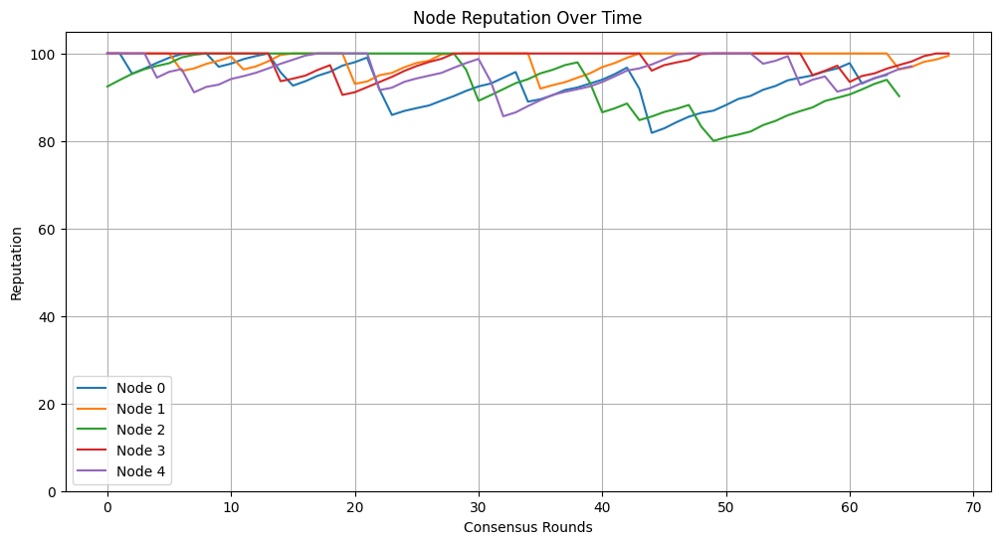


Leader Performance Summary:
Node 2:
 Times as leader: 9
 Average Latency: 0.048581 seconds
 Average Throughput: 349.37 tweets per second
 Average Reputation: 88.45
 Total Malicious Detections: 0
Node 0:
 Times as leader: 10
 Average Latency: 0.048642 seconds
 Average Throughput: 387.29 tweets per second
 Average Reputation: 91.42
 Total Malicious Detections: 0
Node 4:
 Times as leader: 8
 Average Latency: 0.053707 seconds
 Average Throughput: 340.00 tweets per second
 Average Reputation: 92.26
 Total Malicious Detections: 0
Node 1:
 Times as leader: 5
 Average Latency: 0.046602 seconds
 Average Throughput: 372.02 tweets per second
 Average Reputation: 94.74
 Total Malicious Detections: 0
Node 3:
 Times as leader: 5
 Average Latency: 0.043946 seconds
 Average Throughput: 373.44 tweets per second
 Average Reputation: 93.76
 Total Malicious Detections: 0


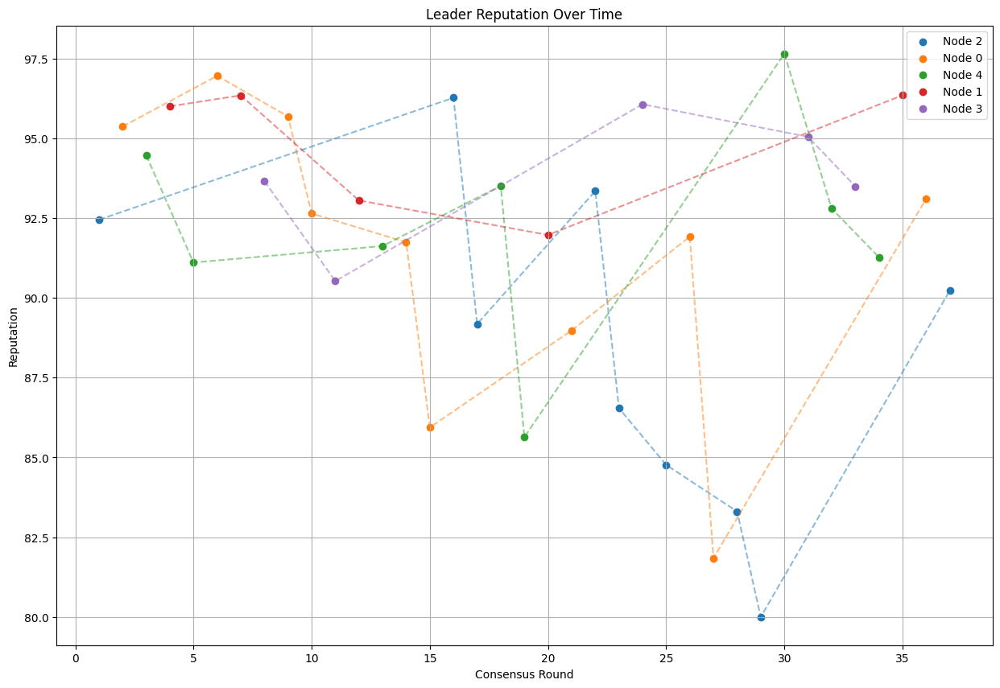


--- Consensus Round 38 ---

Primary Node for this round: Node 0
Primary Node Reputation: 95.09334595936166
Primary Node Malicious Count: 0
Node 0 generates proof: 001ebd054223ea3ad8500a9a00b8bf21ca51d982a5ced0a7a7fcbc60476ac002
Node 1 verifies proof: 001ebd054223ea3ad8500a9a00b8bf21ca51d982a5ced0a7a7fcbc60476ac002 against expected: 001ebd054223ea3ad8500a9a00b8bf21ca51d982a5ced0a7a7fcbc60476ac002
Validation time: 0.000023 seconds
Node 2 verifies proof: 001ebd054223ea3ad8500a9a00b8bf21ca51d982a5ced0a7a7fcbc60476ac002 against expected: 001ebd054223ea3ad8500a9a00b8bf21ca51d982a5ced0a7a7fcbc60476ac002
Validation time: 0.000020 seconds
Node 3 verifies proof: 001ebd054223ea3ad8500a9a00b8bf21ca51d982a5ced0a7a7fcbc60476ac002 against expected: 001ebd054223ea3ad8500a9a00b8bf21ca51d982a5ced0a7a7fcbc60476ac002
Validation time: 0.000017 seconds
Node 4 verifies proof: 001ebd054223ea3ad8500a9a00b8bf21ca51d982a5ced0a7a7fcbc60476ac002 against expected: 001ebd054223ea3ad8500a9a00b8bf21ca51d982a5ced0a7a7

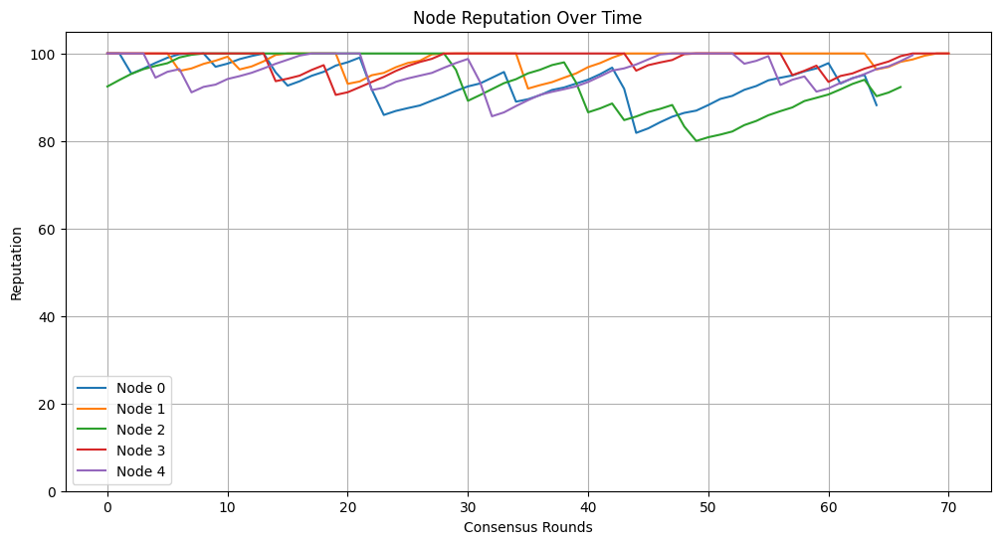


Leader Performance Summary:
Node 2:
 Times as leader: 9
 Average Latency: 0.048581 seconds
 Average Throughput: 349.37 tweets per second
 Average Reputation: 88.45
 Total Malicious Detections: 0
Node 0:
 Times as leader: 11
 Average Latency: 0.049339 seconds
 Average Throughput: 377.91 tweets per second
 Average Reputation: 91.12
 Total Malicious Detections: 0
Node 4:
 Times as leader: 8
 Average Latency: 0.053707 seconds
 Average Throughput: 340.00 tweets per second
 Average Reputation: 92.26
 Total Malicious Detections: 0
Node 1:
 Times as leader: 5
 Average Latency: 0.046602 seconds
 Average Throughput: 372.02 tweets per second
 Average Reputation: 94.74
 Total Malicious Detections: 0
Node 3:
 Times as leader: 5
 Average Latency: 0.043946 seconds
 Average Throughput: 373.44 tweets per second
 Average Reputation: 93.76
 Total Malicious Detections: 0


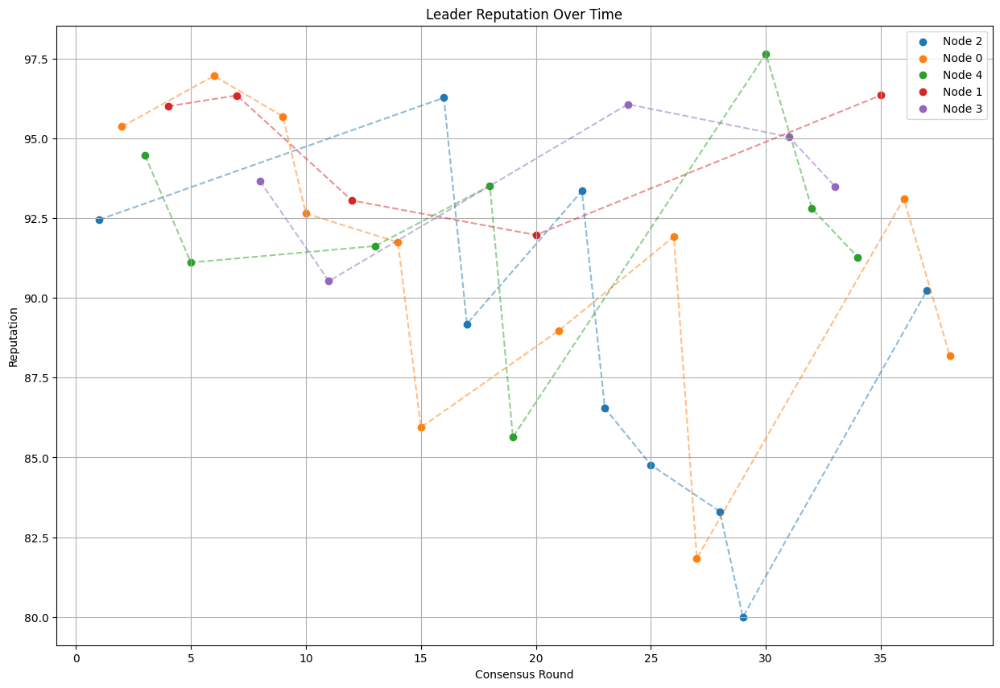


--- Consensus Round 39 ---

Primary Node for this round: Node 2
Primary Node Reputation: 92.32162551869921
Primary Node Malicious Count: 0
Node 2 generates proof: c1ce00ab4991b45d494f34e21969d886294307d8d5198a8fc5825d4cc33aed3d
Node 0 verifies proof: c1ce00ab4991b45d494f34e21969d886294307d8d5198a8fc5825d4cc33aed3d against expected: c1ce00ab4991b45d494f34e21969d886294307d8d5198a8fc5825d4cc33aed3d
Validation time: 0.000031 seconds
Node 1 verifies proof: c1ce00ab4991b45d494f34e21969d886294307d8d5198a8fc5825d4cc33aed3d against expected: c1ce00ab4991b45d494f34e21969d886294307d8d5198a8fc5825d4cc33aed3d
Validation time: 0.000025 seconds
Node 3 verifies proof: c1ce00ab4991b45d494f34e21969d886294307d8d5198a8fc5825d4cc33aed3d against expected: c1ce00ab4991b45d494f34e21969d886294307d8d5198a8fc5825d4cc33aed3d
Validation time: 0.000025 seconds
Node 4 verifies proof: c1ce00ab4991b45d494f34e21969d886294307d8d5198a8fc5825d4cc33aed3d against expected: c1ce00ab4991b45d494f34e21969d886294307d8d5198a8fc5

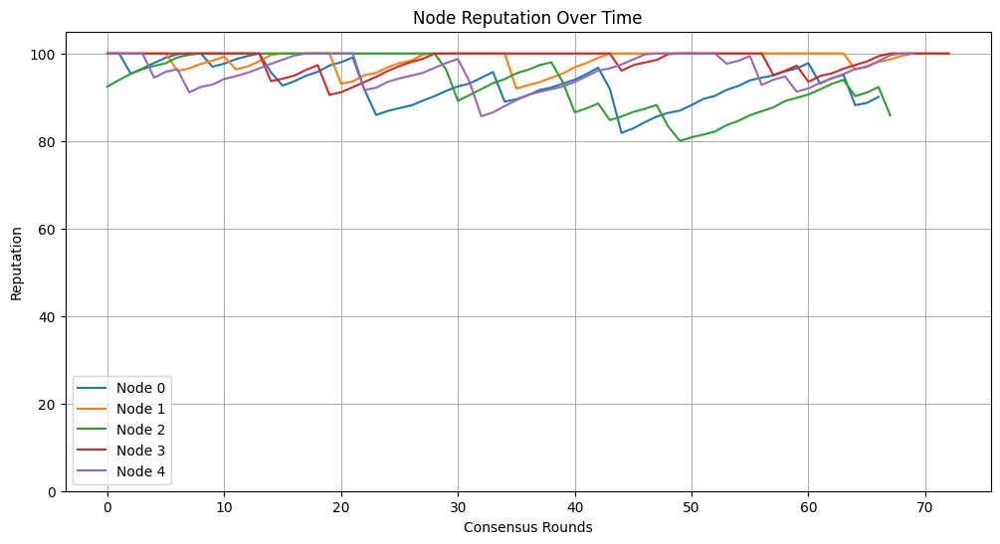


Leader Performance Summary:
Node 2:
 Times as leader: 10
 Average Latency: 0.047662 seconds
 Average Throughput: 355.04 tweets per second
 Average Reputation: 88.19
 Total Malicious Detections: 0
Node 0:
 Times as leader: 11
 Average Latency: 0.049339 seconds
 Average Throughput: 377.91 tweets per second
 Average Reputation: 91.12
 Total Malicious Detections: 0
Node 4:
 Times as leader: 8
 Average Latency: 0.053707 seconds
 Average Throughput: 340.00 tweets per second
 Average Reputation: 92.26
 Total Malicious Detections: 0
Node 1:
 Times as leader: 5
 Average Latency: 0.046602 seconds
 Average Throughput: 372.02 tweets per second
 Average Reputation: 94.74
 Total Malicious Detections: 0
Node 3:
 Times as leader: 5
 Average Latency: 0.043946 seconds
 Average Throughput: 373.44 tweets per second
 Average Reputation: 93.76
 Total Malicious Detections: 0


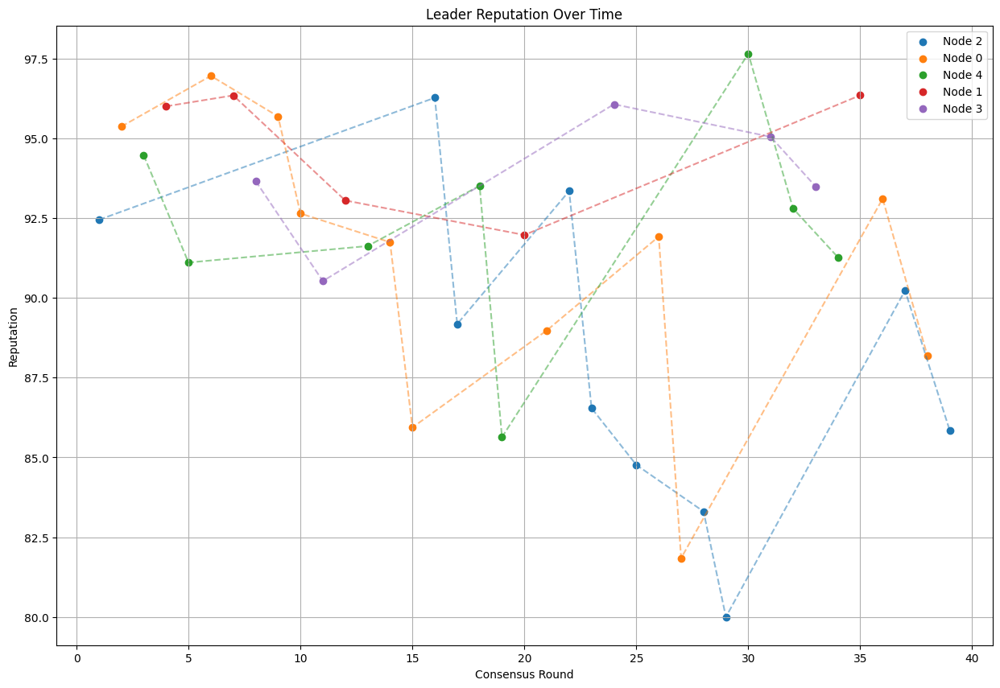


--- Consensus Round 40 ---

Primary Node for this round: Node 0
Primary Node Reputation: 90.08340484570073
Primary Node Malicious Count: 0
Node 0 generates proof: 95dded6720c189c0437b720844170ae6bf14c874102172bf49c3d9a9ecaf8cf3
Node 1 verifies proof: 95dded6720c189c0437b720844170ae6bf14c874102172bf49c3d9a9ecaf8cf3 against expected: 95dded6720c189c0437b720844170ae6bf14c874102172bf49c3d9a9ecaf8cf3
Validation time: 0.000014 seconds
Node 2 verifies proof: 95dded6720c189c0437b720844170ae6bf14c874102172bf49c3d9a9ecaf8cf3 against expected: 95dded6720c189c0437b720844170ae6bf14c874102172bf49c3d9a9ecaf8cf3
Validation time: 0.000007 seconds
Node 3 verifies proof: 95dded6720c189c0437b720844170ae6bf14c874102172bf49c3d9a9ecaf8cf3 against expected: 95dded6720c189c0437b720844170ae6bf14c874102172bf49c3d9a9ecaf8cf3
Validation time: 0.000007 seconds
Node 4 verifies proof: 95dded6720c189c0437b720844170ae6bf14c874102172bf49c3d9a9ecaf8cf3 against expected: 95dded6720c189c0437b720844170ae6bf14c874102172bf49

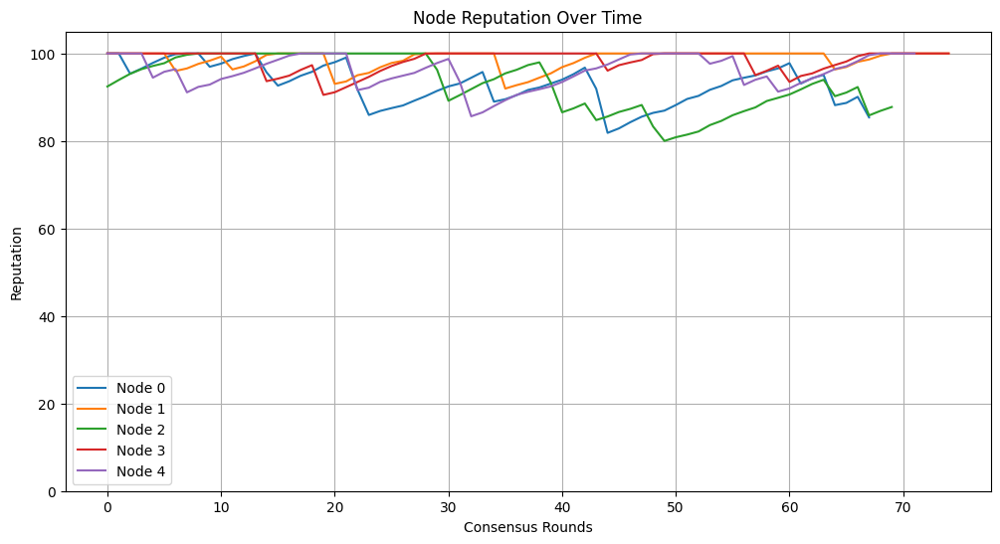


Leader Performance Summary:
Node 2:
 Times as leader: 10
 Average Latency: 0.047662 seconds
 Average Throughput: 355.04 tweets per second
 Average Reputation: 88.19
 Total Malicious Detections: 0
Node 0:
 Times as leader: 12
 Average Latency: 0.048637 seconds
 Average Throughput: 379.01 tweets per second
 Average Reputation: 90.64
 Total Malicious Detections: 0
Node 4:
 Times as leader: 8
 Average Latency: 0.053707 seconds
 Average Throughput: 340.00 tweets per second
 Average Reputation: 92.26
 Total Malicious Detections: 0
Node 1:
 Times as leader: 5
 Average Latency: 0.046602 seconds
 Average Throughput: 372.02 tweets per second
 Average Reputation: 94.74
 Total Malicious Detections: 0
Node 3:
 Times as leader: 5
 Average Latency: 0.043946 seconds
 Average Throughput: 373.44 tweets per second
 Average Reputation: 93.76
 Total Malicious Detections: 0


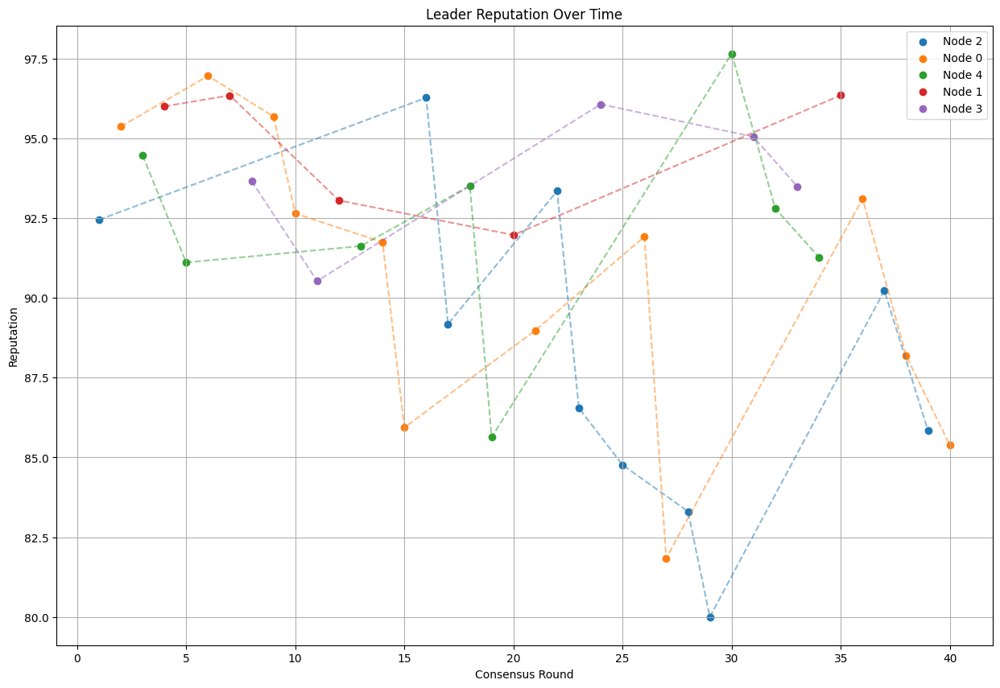


--- Consensus Round 41 ---

Primary Node for this round: Node 2
Primary Node Reputation: 87.75870833880336
Primary Node Malicious Count: 0
Node 2 generates proof: 41eaa083bd21b81d4894b647475fdc8f93ee925f090bff51325865f28e7a6be2
Node 0 verifies proof: 41eaa083bd21b81d4894b647475fdc8f93ee925f090bff51325865f28e7a6be2 against expected: 41eaa083bd21b81d4894b647475fdc8f93ee925f090bff51325865f28e7a6be2
Validation time: 0.000028 seconds
Node 1 verifies proof: 41eaa083bd21b81d4894b647475fdc8f93ee925f090bff51325865f28e7a6be2 against expected: 41eaa083bd21b81d4894b647475fdc8f93ee925f090bff51325865f28e7a6be2
Validation time: 0.000021 seconds
Node 3 verifies proof: 41eaa083bd21b81d4894b647475fdc8f93ee925f090bff51325865f28e7a6be2 against expected: 41eaa083bd21b81d4894b647475fdc8f93ee925f090bff51325865f28e7a6be2
Validation time: 0.000017 seconds
Node 4 verifies proof: 41eaa083bd21b81d4894b647475fdc8f93ee925f090bff51325865f28e7a6be2 against expected: 41eaa083bd21b81d4894b647475fdc8f93ee925f090bff5132

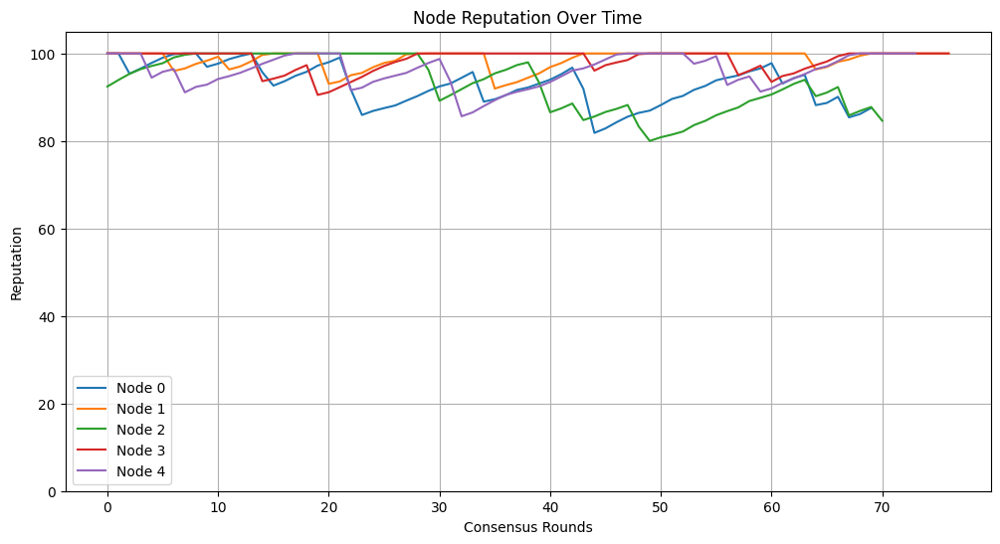


Leader Performance Summary:
Node 2:
 Times as leader: 11
 Average Latency: 0.047257 seconds
 Average Throughput: 356.43 tweets per second
 Average Reputation: 87.87
 Total Malicious Detections: 0
Node 0:
 Times as leader: 12
 Average Latency: 0.048637 seconds
 Average Throughput: 379.01 tweets per second
 Average Reputation: 90.64
 Total Malicious Detections: 0
Node 4:
 Times as leader: 8
 Average Latency: 0.053707 seconds
 Average Throughput: 340.00 tweets per second
 Average Reputation: 92.26
 Total Malicious Detections: 0
Node 1:
 Times as leader: 5
 Average Latency: 0.046602 seconds
 Average Throughput: 372.02 tweets per second
 Average Reputation: 94.74
 Total Malicious Detections: 0
Node 3:
 Times as leader: 5
 Average Latency: 0.043946 seconds
 Average Throughput: 373.44 tweets per second
 Average Reputation: 93.76
 Total Malicious Detections: 0


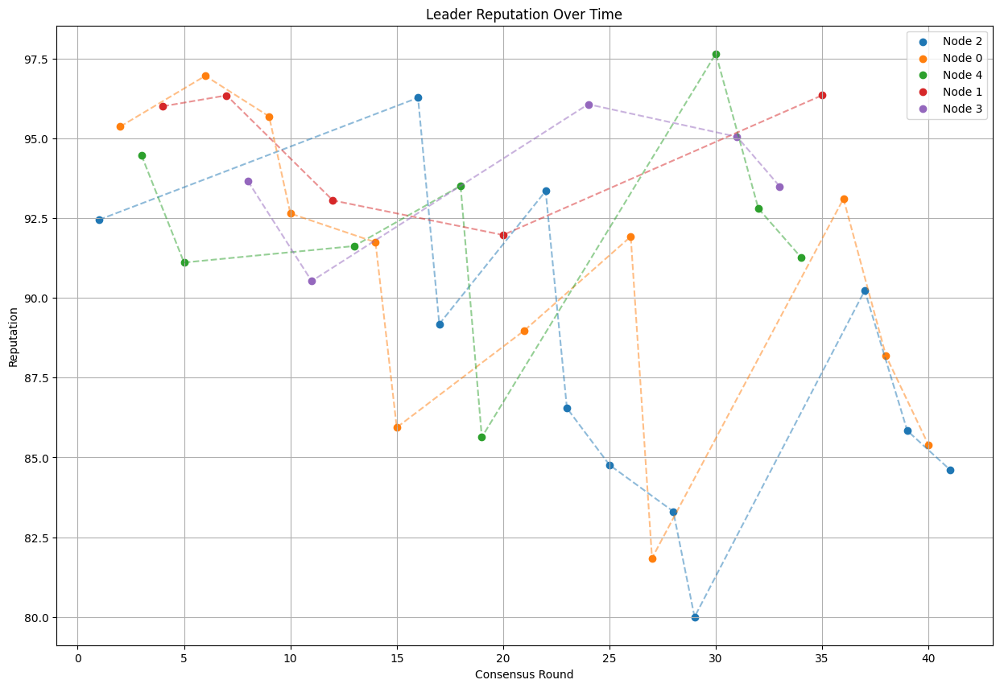


--- Consensus Round 42 ---

Primary Node for this round: Node 1
Primary Node Reputation: 100
Primary Node Malicious Count: 0
Node 1 generates proof: 1264fc4d59176967a76499d4ab85c8c7f1d61c13d0a35de4c491d4b083aaee13
Node 0 verifies proof: 1264fc4d59176967a76499d4ab85c8c7f1d61c13d0a35de4c491d4b083aaee13 against expected: 1264fc4d59176967a76499d4ab85c8c7f1d61c13d0a35de4c491d4b083aaee13
Validation time: 0.000011 seconds
Node 2 verifies proof: 1264fc4d59176967a76499d4ab85c8c7f1d61c13d0a35de4c491d4b083aaee13 against expected: 1264fc4d59176967a76499d4ab85c8c7f1d61c13d0a35de4c491d4b083aaee13
Validation time: 0.000007 seconds
Node 3 verifies proof: 1264fc4d59176967a76499d4ab85c8c7f1d61c13d0a35de4c491d4b083aaee13 against expected: 1264fc4d59176967a76499d4ab85c8c7f1d61c13d0a35de4c491d4b083aaee13
Validation time: 0.000006 seconds
Node 4 verifies proof: 1264fc4d59176967a76499d4ab85c8c7f1d61c13d0a35de4c491d4b083aaee13 against expected: 1264fc4d59176967a76499d4ab85c8c7f1d61c13d0a35de4c491d4b083aaee13

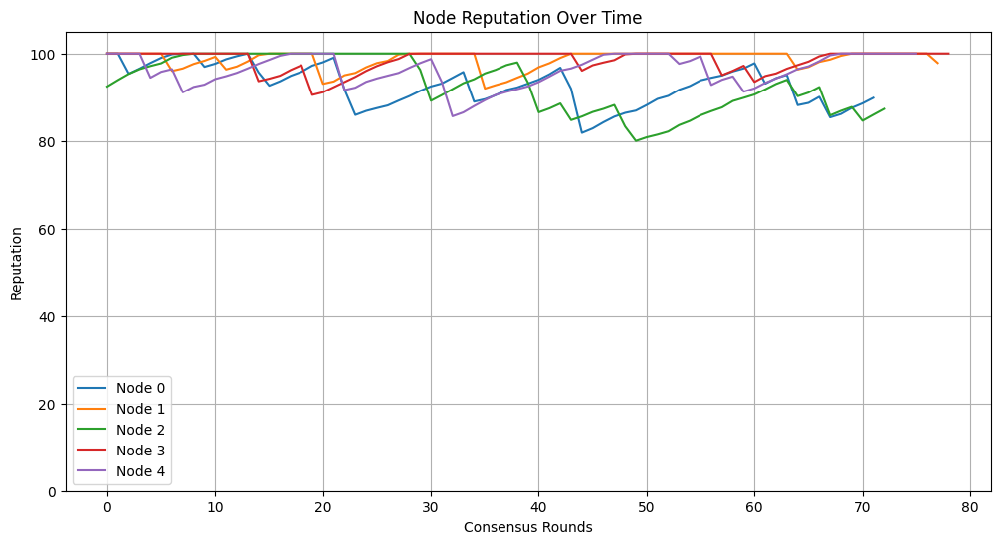


Leader Performance Summary:
Node 2:
 Times as leader: 11
 Average Latency: 0.047257 seconds
 Average Throughput: 356.43 tweets per second
 Average Reputation: 87.87
 Total Malicious Detections: 0
Node 0:
 Times as leader: 12
 Average Latency: 0.048637 seconds
 Average Throughput: 379.01 tweets per second
 Average Reputation: 90.64
 Total Malicious Detections: 0
Node 4:
 Times as leader: 8
 Average Latency: 0.053707 seconds
 Average Throughput: 340.00 tweets per second
 Average Reputation: 92.26
 Total Malicious Detections: 0
Node 1:
 Times as leader: 6
 Average Latency: 0.044874 seconds
 Average Throughput: 383.61 tweets per second
 Average Reputation: 95.26
 Total Malicious Detections: 0
Node 3:
 Times as leader: 5
 Average Latency: 0.043946 seconds
 Average Throughput: 373.44 tweets per second
 Average Reputation: 93.76
 Total Malicious Detections: 0


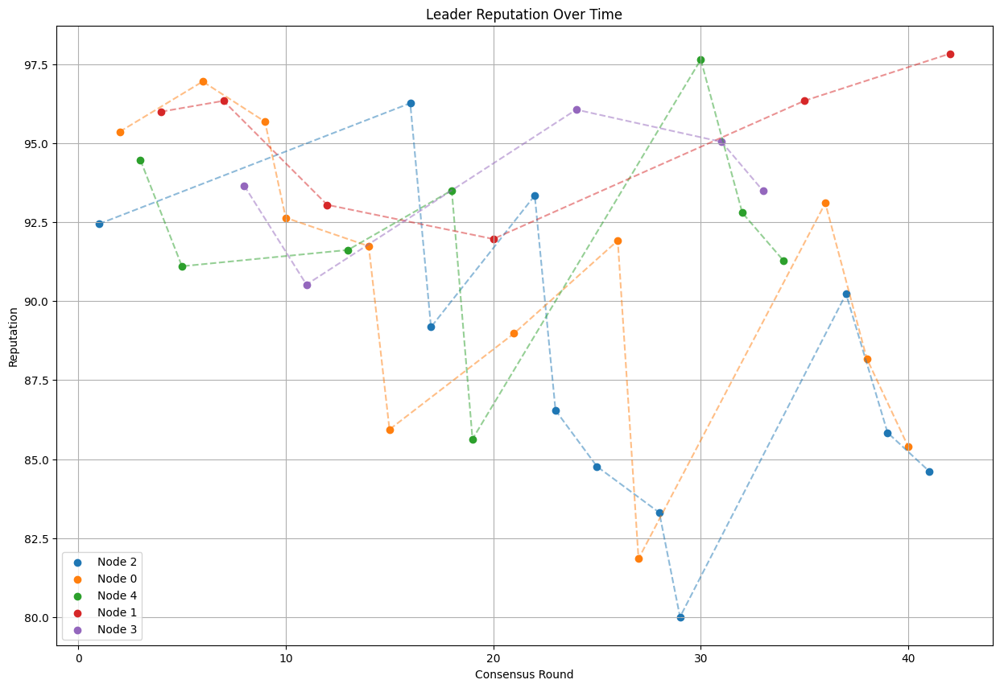


--- Consensus Round 43 ---

Primary Node for this round: Node 2
Primary Node Reputation: 87.3247582975655
Primary Node Malicious Count: 0
Node 2 generates proof: c4f212344691ee9df7677d8a9649bbcf9ead4bff5ccf2aa1593d57d1cc6cd7e3
Node 0 verifies proof: c4f212344691ee9df7677d8a9649bbcf9ead4bff5ccf2aa1593d57d1cc6cd7e3 against expected: c4f212344691ee9df7677d8a9649bbcf9ead4bff5ccf2aa1593d57d1cc6cd7e3
Validation time: 0.000031 seconds
Node 1 verifies proof: c4f212344691ee9df7677d8a9649bbcf9ead4bff5ccf2aa1593d57d1cc6cd7e3 against expected: c4f212344691ee9df7677d8a9649bbcf9ead4bff5ccf2aa1593d57d1cc6cd7e3
Validation time: 0.000021 seconds
Node 3 verifies proof: c4f212344691ee9df7677d8a9649bbcf9ead4bff5ccf2aa1593d57d1cc6cd7e3 against expected: c4f212344691ee9df7677d8a9649bbcf9ead4bff5ccf2aa1593d57d1cc6cd7e3
Validation time: 0.000018 seconds
Node 4 verifies proof: c4f212344691ee9df7677d8a9649bbcf9ead4bff5ccf2aa1593d57d1cc6cd7e3 against expected: c4f212344691ee9df7677d8a9649bbcf9ead4bff5ccf2aa1593

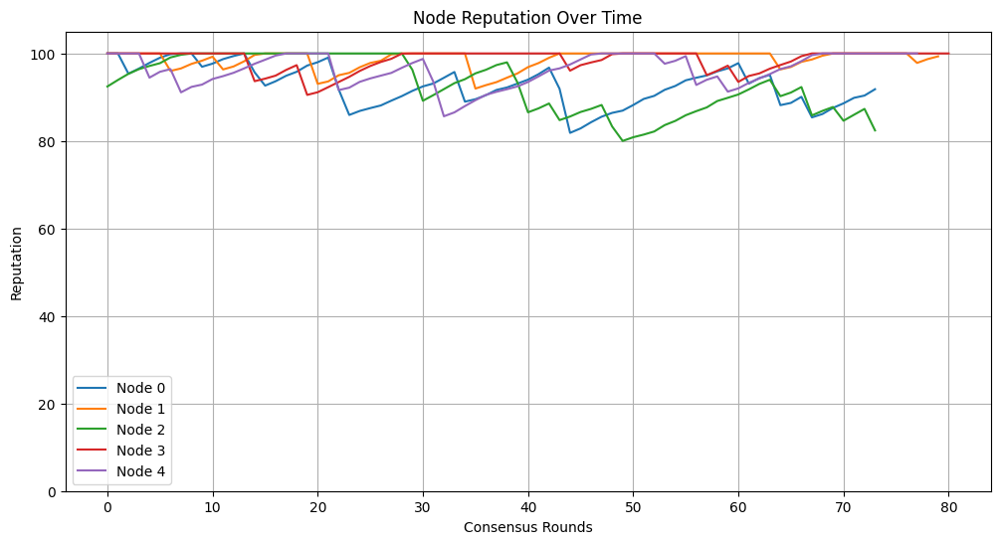


Leader Performance Summary:
Node 2:
 Times as leader: 12
 Average Latency: 0.046672 seconds
 Average Throughput: 359.87 tweets per second
 Average Reputation: 87.41
 Total Malicious Detections: 0
Node 0:
 Times as leader: 12
 Average Latency: 0.048637 seconds
 Average Throughput: 379.01 tweets per second
 Average Reputation: 90.64
 Total Malicious Detections: 0
Node 4:
 Times as leader: 8
 Average Latency: 0.053707 seconds
 Average Throughput: 340.00 tweets per second
 Average Reputation: 92.26
 Total Malicious Detections: 0
Node 1:
 Times as leader: 6
 Average Latency: 0.044874 seconds
 Average Throughput: 383.61 tweets per second
 Average Reputation: 95.26
 Total Malicious Detections: 0
Node 3:
 Times as leader: 5
 Average Latency: 0.043946 seconds
 Average Throughput: 373.44 tweets per second
 Average Reputation: 93.76
 Total Malicious Detections: 0


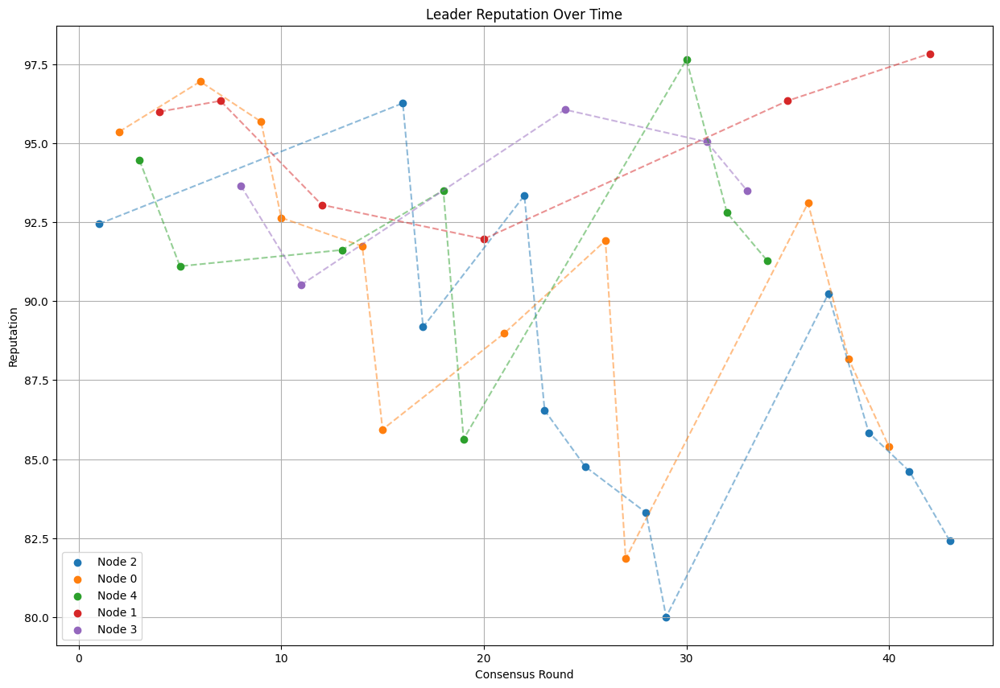


--- Consensus Round 44 ---

Primary Node for this round: Node 1
Primary Node Reputation: 99.33588989060326
Primary Node Malicious Count: 0
Node 1 generates proof: 894dc156ba4cc9880422f37838c4c21386b4fa4108022a7aafcb5a1541f5dc77
Node 0 verifies proof: 894dc156ba4cc9880422f37838c4c21386b4fa4108022a7aafcb5a1541f5dc77 against expected: 894dc156ba4cc9880422f37838c4c21386b4fa4108022a7aafcb5a1541f5dc77
Validation time: 0.000024 seconds
Node 2 verifies proof: 894dc156ba4cc9880422f37838c4c21386b4fa4108022a7aafcb5a1541f5dc77 against expected: 894dc156ba4cc9880422f37838c4c21386b4fa4108022a7aafcb5a1541f5dc77
Validation time: 0.000018 seconds
Node 3 verifies proof: 894dc156ba4cc9880422f37838c4c21386b4fa4108022a7aafcb5a1541f5dc77 against expected: 894dc156ba4cc9880422f37838c4c21386b4fa4108022a7aafcb5a1541f5dc77
Validation time: 0.000016 seconds
Node 4 verifies proof: 894dc156ba4cc9880422f37838c4c21386b4fa4108022a7aafcb5a1541f5dc77 against expected: 894dc156ba4cc9880422f37838c4c21386b4fa4108022a7aaf

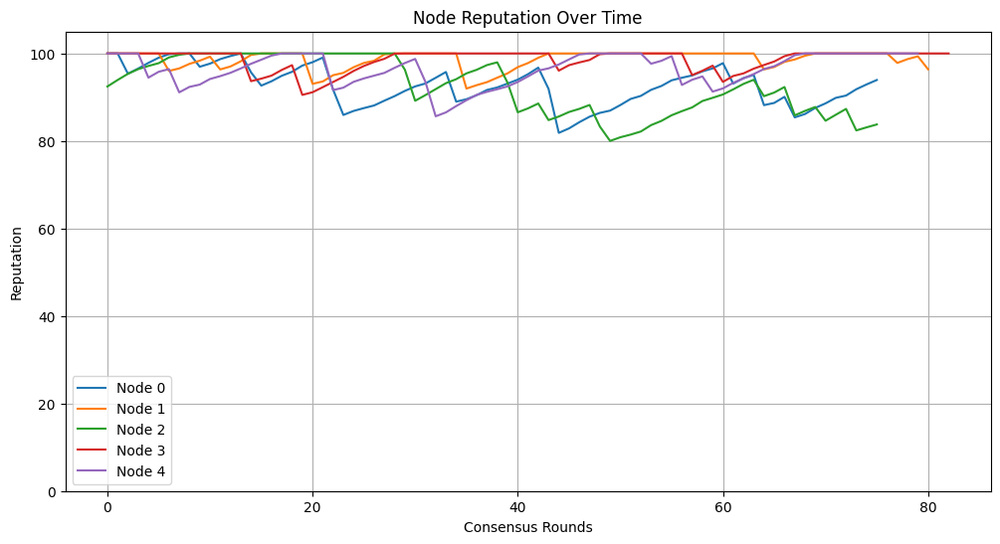


Leader Performance Summary:
Node 2:
 Times as leader: 12
 Average Latency: 0.046672 seconds
 Average Throughput: 359.87 tweets per second
 Average Reputation: 87.41
 Total Malicious Detections: 0
Node 0:
 Times as leader: 12
 Average Latency: 0.048637 seconds
 Average Throughput: 379.01 tweets per second
 Average Reputation: 90.64
 Total Malicious Detections: 0
Node 4:
 Times as leader: 8
 Average Latency: 0.053707 seconds
 Average Throughput: 340.00 tweets per second
 Average Reputation: 92.26
 Total Malicious Detections: 0
Node 1:
 Times as leader: 7
 Average Latency: 0.043954 seconds
 Average Throughput: 388.28 tweets per second
 Average Reputation: 95.41
 Total Malicious Detections: 0
Node 3:
 Times as leader: 5
 Average Latency: 0.043946 seconds
 Average Throughput: 373.44 tweets per second
 Average Reputation: 93.76
 Total Malicious Detections: 0


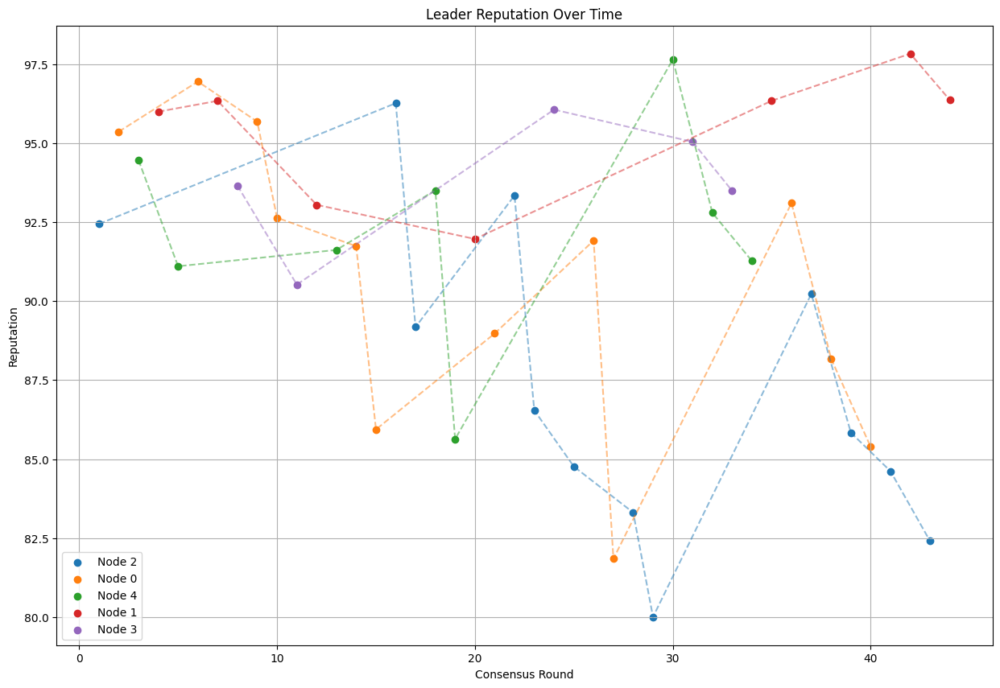


--- Consensus Round 45 ---

Primary Node for this round: Node 4
Primary Node Reputation: 100
Primary Node Malicious Count: 0
Node 4 generates proof: 58420a97c585f0be2216ca957e64748cb1fd95e1366f164b75a4e12a3c0d9ec1
Node 0 verifies proof: 58420a97c585f0be2216ca957e64748cb1fd95e1366f164b75a4e12a3c0d9ec1 against expected: 58420a97c585f0be2216ca957e64748cb1fd95e1366f164b75a4e12a3c0d9ec1
Validation time: 0.000023 seconds
Node 1 verifies proof: 58420a97c585f0be2216ca957e64748cb1fd95e1366f164b75a4e12a3c0d9ec1 against expected: 58420a97c585f0be2216ca957e64748cb1fd95e1366f164b75a4e12a3c0d9ec1
Validation time: 0.000019 seconds
Node 2 verifies proof: 58420a97c585f0be2216ca957e64748cb1fd95e1366f164b75a4e12a3c0d9ec1 against expected: 58420a97c585f0be2216ca957e64748cb1fd95e1366f164b75a4e12a3c0d9ec1
Validation time: 0.000018 seconds
Node 3 verifies proof: 58420a97c585f0be2216ca957e64748cb1fd95e1366f164b75a4e12a3c0d9ec1 against expected: 58420a97c585f0be2216ca957e64748cb1fd95e1366f164b75a4e12a3c0d9ec1

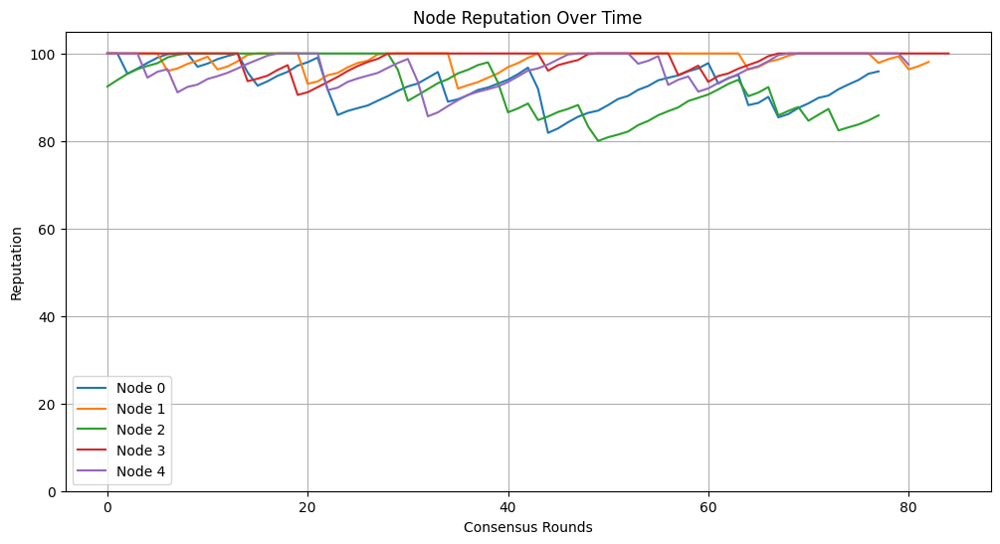


Leader Performance Summary:
Node 2:
 Times as leader: 12
 Average Latency: 0.046672 seconds
 Average Throughput: 359.87 tweets per second
 Average Reputation: 87.41
 Total Malicious Detections: 0
Node 0:
 Times as leader: 12
 Average Latency: 0.048637 seconds
 Average Throughput: 379.01 tweets per second
 Average Reputation: 90.64
 Total Malicious Detections: 0
Node 4:
 Times as leader: 9
 Average Latency: 0.052415 seconds
 Average Throughput: 344.47 tweets per second
 Average Reputation: 92.83
 Total Malicious Detections: 0
Node 1:
 Times as leader: 7
 Average Latency: 0.043954 seconds
 Average Throughput: 388.28 tweets per second
 Average Reputation: 95.41
 Total Malicious Detections: 0
Node 3:
 Times as leader: 5
 Average Latency: 0.043946 seconds
 Average Throughput: 373.44 tweets per second
 Average Reputation: 93.76
 Total Malicious Detections: 0


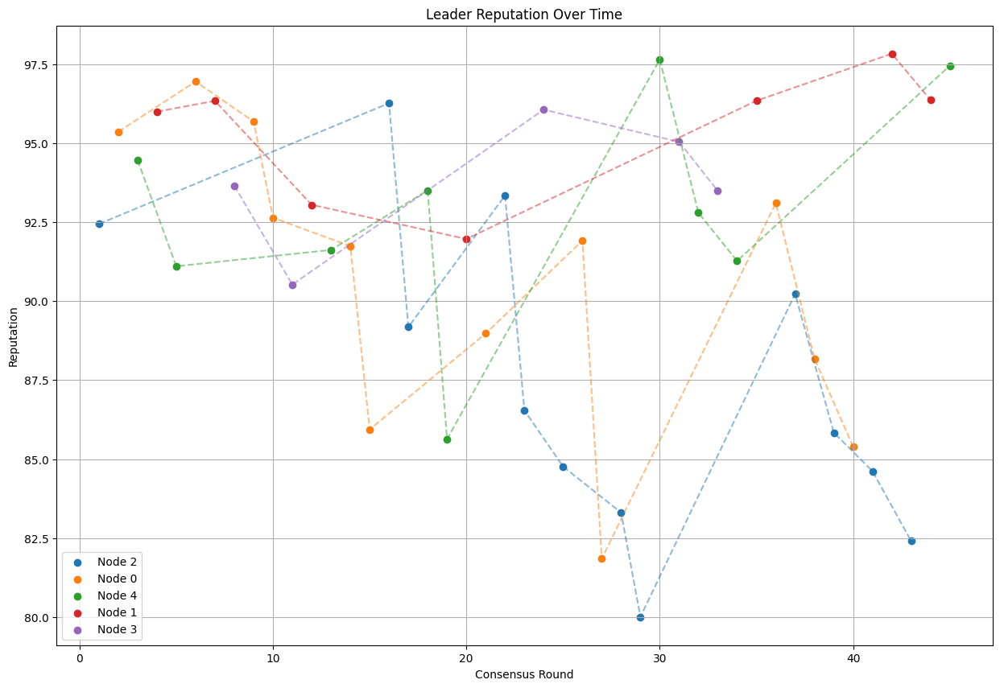


--- Consensus Round 46 ---

Primary Node for this round: Node 4
Primary Node Reputation: 97.45390238240597
Primary Node Malicious Count: 0
Node 4 generates proof: 3a2fd8037602ddeae5f56892ae6b2bd0721489bea166cc20bb4e057264711236
Node 0 verifies proof: 3a2fd8037602ddeae5f56892ae6b2bd0721489bea166cc20bb4e057264711236 against expected: 3a2fd8037602ddeae5f56892ae6b2bd0721489bea166cc20bb4e057264711236
Validation time: 0.000031 seconds
Node 1 verifies proof: 3a2fd8037602ddeae5f56892ae6b2bd0721489bea166cc20bb4e057264711236 against expected: 3a2fd8037602ddeae5f56892ae6b2bd0721489bea166cc20bb4e057264711236
Validation time: 0.000021 seconds
Node 2 verifies proof: 3a2fd8037602ddeae5f56892ae6b2bd0721489bea166cc20bb4e057264711236 against expected: 3a2fd8037602ddeae5f56892ae6b2bd0721489bea166cc20bb4e057264711236
Validation time: 0.000095 seconds
Node 3 verifies proof: 3a2fd8037602ddeae5f56892ae6b2bd0721489bea166cc20bb4e057264711236 against expected: 3a2fd8037602ddeae5f56892ae6b2bd0721489bea166cc20bb

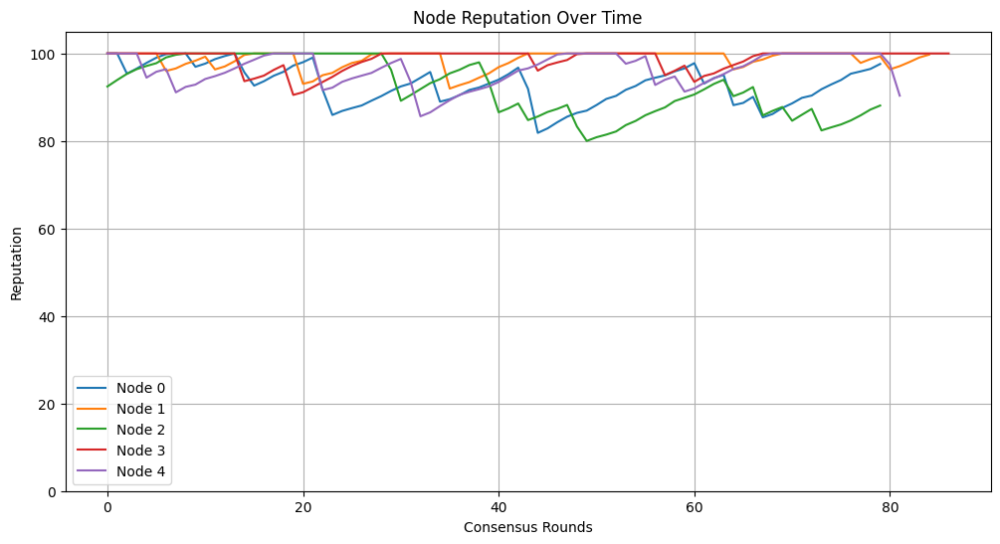


Leader Performance Summary:
Node 2:
 Times as leader: 12
 Average Latency: 0.046672 seconds
 Average Throughput: 359.87 tweets per second
 Average Reputation: 87.41
 Total Malicious Detections: 0
Node 0:
 Times as leader: 12
 Average Latency: 0.048637 seconds
 Average Throughput: 379.01 tweets per second
 Average Reputation: 90.64
 Total Malicious Detections: 0
Node 4:
 Times as leader: 10
 Average Latency: 0.051559 seconds
 Average Throughput: 346.51 tweets per second
 Average Reputation: 92.58
 Total Malicious Detections: 0
Node 1:
 Times as leader: 7
 Average Latency: 0.043954 seconds
 Average Throughput: 388.28 tweets per second
 Average Reputation: 95.41
 Total Malicious Detections: 0
Node 3:
 Times as leader: 5
 Average Latency: 0.043946 seconds
 Average Throughput: 373.44 tweets per second
 Average Reputation: 93.76
 Total Malicious Detections: 0


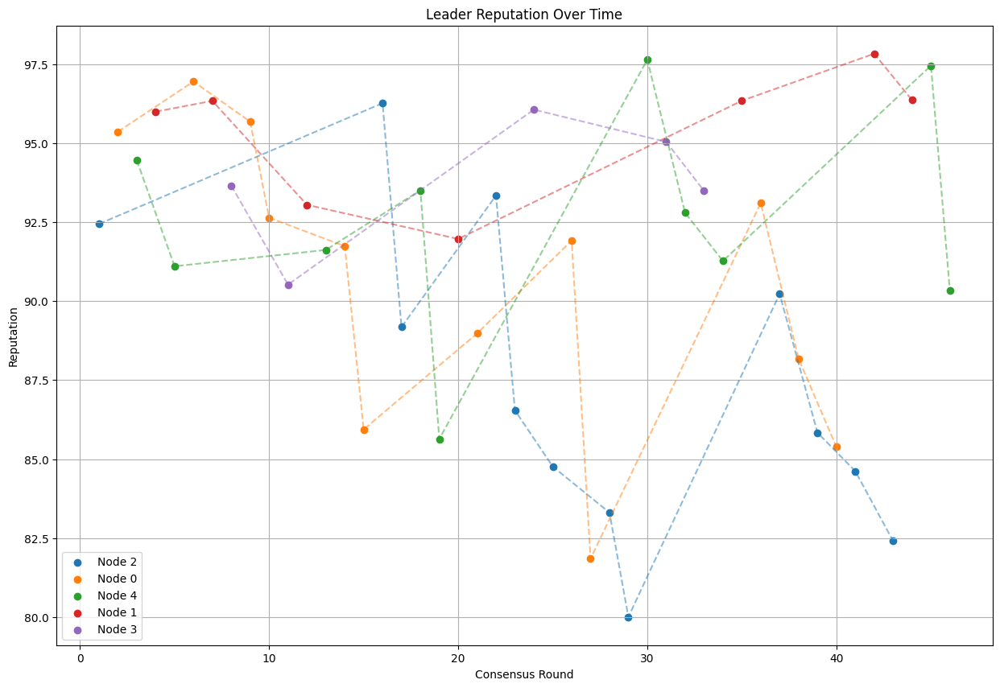


--- Consensus Round 47 ---

Primary Node for this round: Node 3
Primary Node Reputation: 100
Primary Node Malicious Count: 0
Node 3 generates proof: d397fdc869b69693efa6d9d39f571ff78645f9963a7310f3ac0a052ef6fcf51d
Node 0 verifies proof: d397fdc869b69693efa6d9d39f571ff78645f9963a7310f3ac0a052ef6fcf51d against expected: d397fdc869b69693efa6d9d39f571ff78645f9963a7310f3ac0a052ef6fcf51d
Validation time: 0.000024 seconds
Node 1 verifies proof: d397fdc869b69693efa6d9d39f571ff78645f9963a7310f3ac0a052ef6fcf51d against expected: d397fdc869b69693efa6d9d39f571ff78645f9963a7310f3ac0a052ef6fcf51d
Validation time: 0.000016 seconds
Node 2 verifies proof: d397fdc869b69693efa6d9d39f571ff78645f9963a7310f3ac0a052ef6fcf51d against expected: d397fdc869b69693efa6d9d39f571ff78645f9963a7310f3ac0a052ef6fcf51d
Validation time: 0.000014 seconds
Node 4 verifies proof: d397fdc869b69693efa6d9d39f571ff78645f9963a7310f3ac0a052ef6fcf51d against expected: d397fdc869b69693efa6d9d39f571ff78645f9963a7310f3ac0a052ef6fcf51d

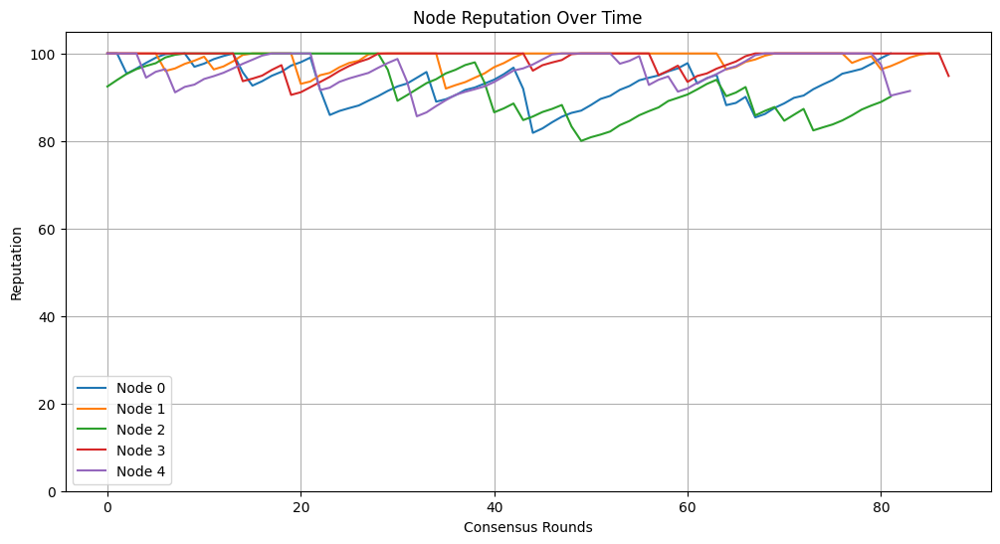


Leader Performance Summary:
Node 2:
 Times as leader: 12
 Average Latency: 0.046672 seconds
 Average Throughput: 359.87 tweets per second
 Average Reputation: 87.41
 Total Malicious Detections: 0
Node 0:
 Times as leader: 12
 Average Latency: 0.048637 seconds
 Average Throughput: 379.01 tweets per second
 Average Reputation: 90.64
 Total Malicious Detections: 0
Node 4:
 Times as leader: 10
 Average Latency: 0.051559 seconds
 Average Throughput: 346.51 tweets per second
 Average Reputation: 92.58
 Total Malicious Detections: 0
Node 1:
 Times as leader: 7
 Average Latency: 0.043954 seconds
 Average Throughput: 388.28 tweets per second
 Average Reputation: 95.41
 Total Malicious Detections: 0
Node 3:
 Times as leader: 6
 Average Latency: 0.043070 seconds
 Average Throughput: 380.13 tweets per second
 Average Reputation: 93.94
 Total Malicious Detections: 0


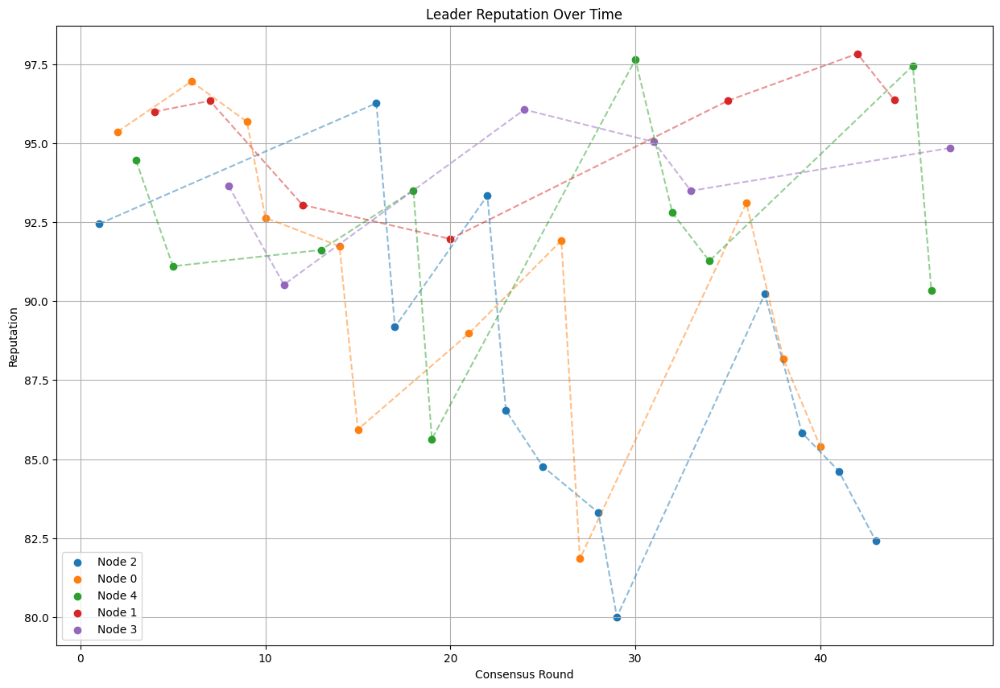


--- Consensus Round 48 ---

Primary Node for this round: Node 1
Primary Node Reputation: 100
Primary Node Malicious Count: 0
Node 1 generates proof: 4e8b17a1cdf0f2d3e64310fd8d10ec0ad862a0ed264944601529ddfc693eb320
Node 0 verifies proof: 4e8b17a1cdf0f2d3e64310fd8d10ec0ad862a0ed264944601529ddfc693eb320 against expected: 4e8b17a1cdf0f2d3e64310fd8d10ec0ad862a0ed264944601529ddfc693eb320
Validation time: 0.000027 seconds
Node 2 verifies proof: 4e8b17a1cdf0f2d3e64310fd8d10ec0ad862a0ed264944601529ddfc693eb320 against expected: 4e8b17a1cdf0f2d3e64310fd8d10ec0ad862a0ed264944601529ddfc693eb320
Validation time: 0.000022 seconds
Node 3 verifies proof: 4e8b17a1cdf0f2d3e64310fd8d10ec0ad862a0ed264944601529ddfc693eb320 against expected: 4e8b17a1cdf0f2d3e64310fd8d10ec0ad862a0ed264944601529ddfc693eb320
Validation time: 0.000018 seconds
Node 4 verifies proof: 4e8b17a1cdf0f2d3e64310fd8d10ec0ad862a0ed264944601529ddfc693eb320 against expected: 4e8b17a1cdf0f2d3e64310fd8d10ec0ad862a0ed264944601529ddfc693eb320

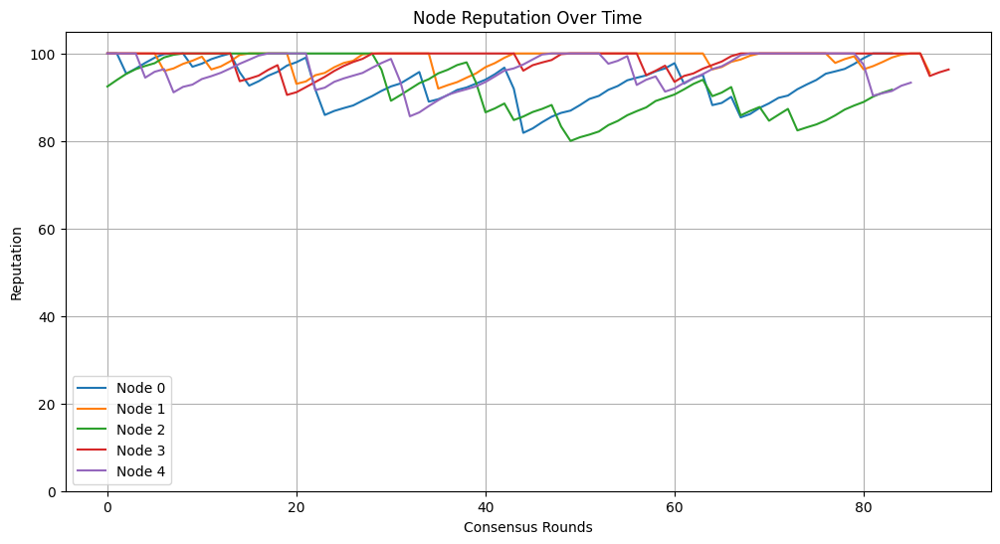


Leader Performance Summary:
Node 2:
 Times as leader: 12
 Average Latency: 0.046672 seconds
 Average Throughput: 359.87 tweets per second
 Average Reputation: 87.41
 Total Malicious Detections: 0
Node 0:
 Times as leader: 12
 Average Latency: 0.048637 seconds
 Average Throughput: 379.01 tweets per second
 Average Reputation: 90.64
 Total Malicious Detections: 0
Node 4:
 Times as leader: 10
 Average Latency: 0.051559 seconds
 Average Throughput: 346.51 tweets per second
 Average Reputation: 92.58
 Total Malicious Detections: 0
Node 1:
 Times as leader: 8
 Average Latency: 0.043651 seconds
 Average Throughput: 387.90 tweets per second
 Average Reputation: 95.43
 Total Malicious Detections: 0
Node 3:
 Times as leader: 6
 Average Latency: 0.043070 seconds
 Average Throughput: 380.13 tweets per second
 Average Reputation: 93.94
 Total Malicious Detections: 0


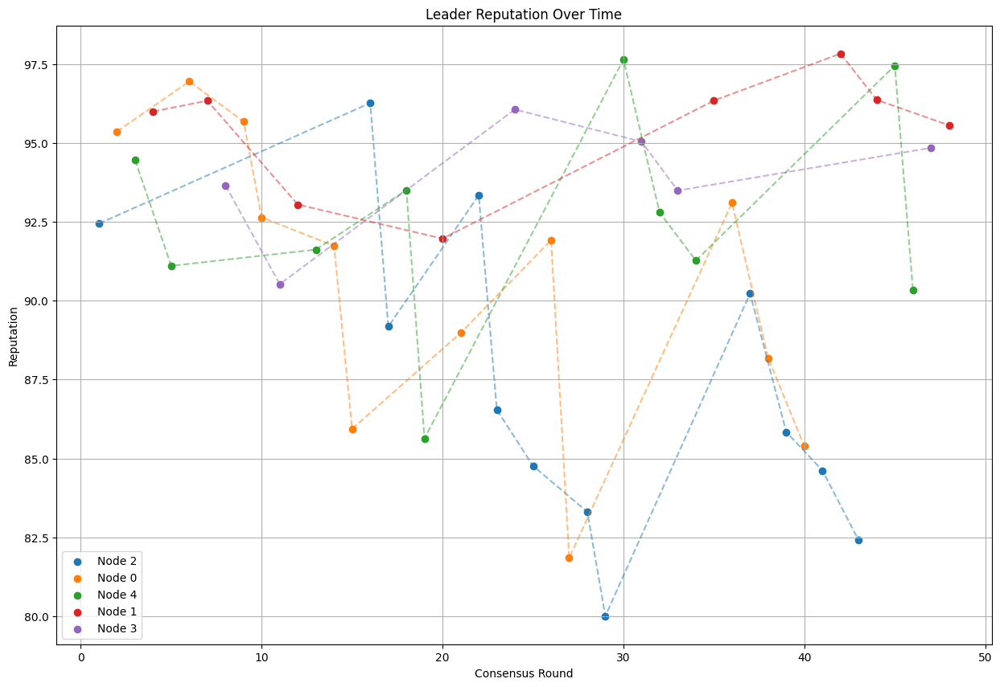


--- Consensus Round 49 ---

Primary Node for this round: Node 4
Primary Node Reputation: 93.31908838186372
Primary Node Malicious Count: 0
Node 4 generates proof: 1ba495618170890f2134be6963c159b3f564566dc103542c310dffbab52675ea
Node 0 verifies proof: 1ba495618170890f2134be6963c159b3f564566dc103542c310dffbab52675ea against expected: 1ba495618170890f2134be6963c159b3f564566dc103542c310dffbab52675ea
Validation time: 0.000023 seconds
Node 1 verifies proof: 1ba495618170890f2134be6963c159b3f564566dc103542c310dffbab52675ea against expected: 1ba495618170890f2134be6963c159b3f564566dc103542c310dffbab52675ea
Validation time: 0.000018 seconds
Node 2 verifies proof: 1ba495618170890f2134be6963c159b3f564566dc103542c310dffbab52675ea against expected: 1ba495618170890f2134be6963c159b3f564566dc103542c310dffbab52675ea
Validation time: 0.000016 seconds
Node 3 verifies proof: 1ba495618170890f2134be6963c159b3f564566dc103542c310dffbab52675ea against expected: 1ba495618170890f2134be6963c159b3f564566dc103542c31

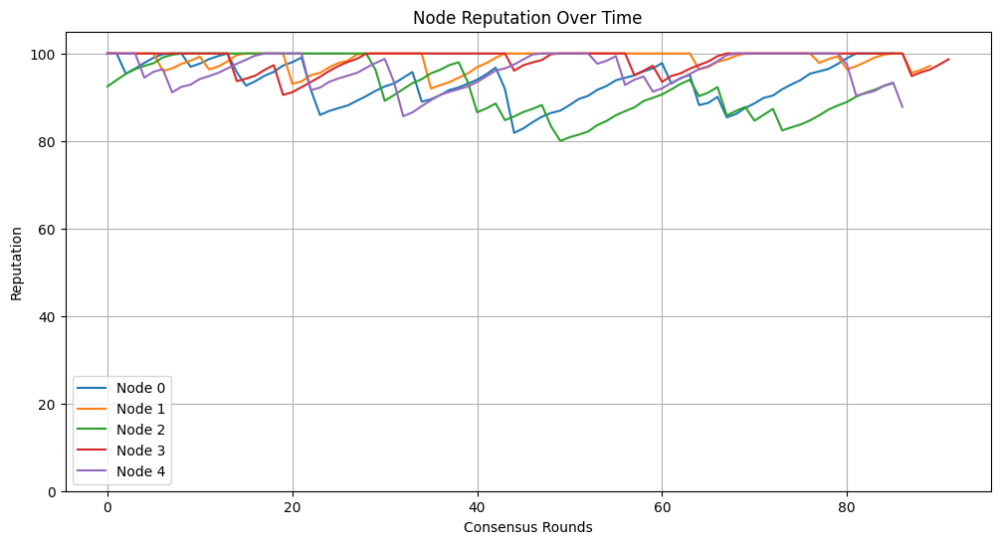


Leader Performance Summary:
Node 2:
 Times as leader: 12
 Average Latency: 0.046672 seconds
 Average Throughput: 359.87 tweets per second
 Average Reputation: 87.41
 Total Malicious Detections: 0
Node 0:
 Times as leader: 12
 Average Latency: 0.048637 seconds
 Average Throughput: 379.01 tweets per second
 Average Reputation: 90.64
 Total Malicious Detections: 0
Node 4:
 Times as leader: 11
 Average Latency: 0.050711 seconds
 Average Throughput: 349.45 tweets per second
 Average Reputation: 92.15
 Total Malicious Detections: 0
Node 1:
 Times as leader: 8
 Average Latency: 0.043651 seconds
 Average Throughput: 387.90 tweets per second
 Average Reputation: 95.43
 Total Malicious Detections: 0
Node 3:
 Times as leader: 6
 Average Latency: 0.043070 seconds
 Average Throughput: 380.13 tweets per second
 Average Reputation: 93.94
 Total Malicious Detections: 0


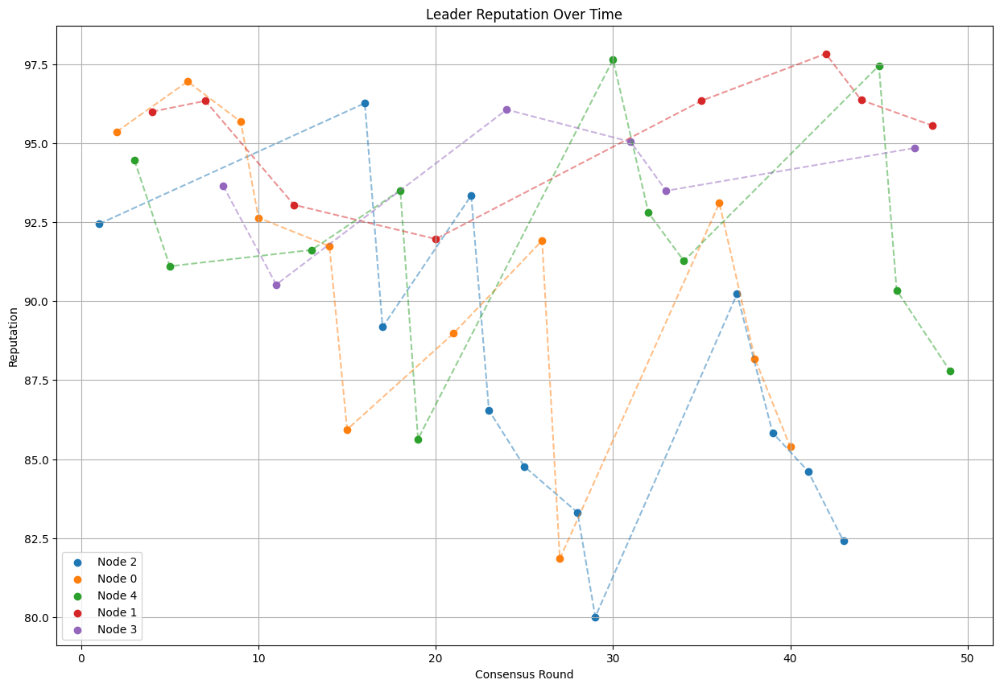


--- Consensus Round 50 ---

Primary Node for this round: Node 2
Primary Node Reputation: 93.21968627745495
Primary Node Malicious Count: 0
Node 2 generates proof: ed49747cb7702f18af92eeff6efaac33467667e7719bbf44a254234875a6d48d
Node 0 verifies proof: ed49747cb7702f18af92eeff6efaac33467667e7719bbf44a254234875a6d48d against expected: ed49747cb7702f18af92eeff6efaac33467667e7719bbf44a254234875a6d48d
Validation time: 0.000022 seconds
Node 1 verifies proof: ed49747cb7702f18af92eeff6efaac33467667e7719bbf44a254234875a6d48d against expected: ed49747cb7702f18af92eeff6efaac33467667e7719bbf44a254234875a6d48d
Validation time: 0.000016 seconds
Node 3 verifies proof: ed49747cb7702f18af92eeff6efaac33467667e7719bbf44a254234875a6d48d against expected: ed49747cb7702f18af92eeff6efaac33467667e7719bbf44a254234875a6d48d
Validation time: 0.000017 seconds
Node 4 verifies proof: ed49747cb7702f18af92eeff6efaac33467667e7719bbf44a254234875a6d48d against expected: ed49747cb7702f18af92eeff6efaac33467667e7719bbf44a2

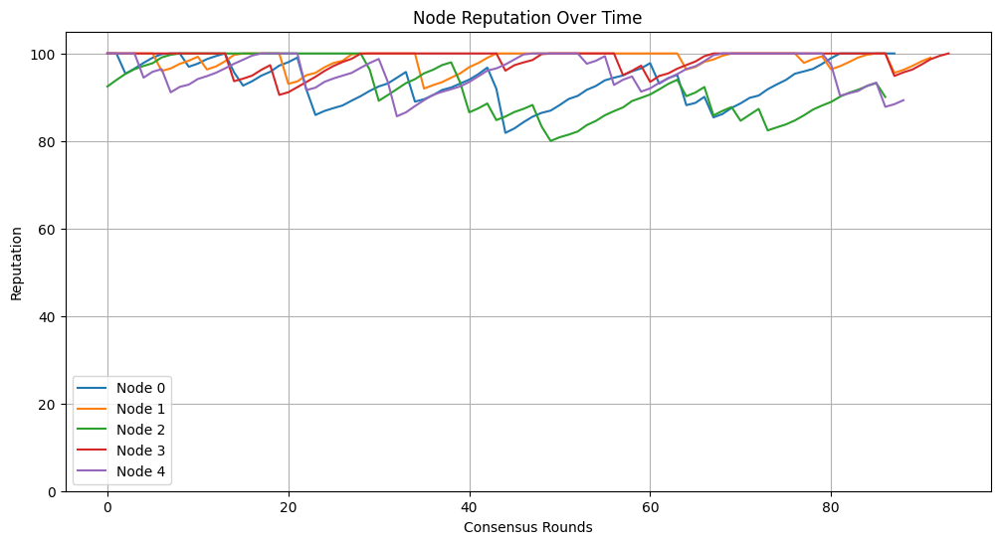


Leader Performance Summary:
Node 2:
 Times as leader: 13
 Average Latency: 0.048388 seconds
 Average Throughput: 350.03 tweets per second
 Average Reputation: 87.61
 Total Malicious Detections: 0
Node 0:
 Times as leader: 12
 Average Latency: 0.048637 seconds
 Average Throughput: 379.01 tweets per second
 Average Reputation: 90.64
 Total Malicious Detections: 0
Node 4:
 Times as leader: 11
 Average Latency: 0.050711 seconds
 Average Throughput: 349.45 tweets per second
 Average Reputation: 92.15
 Total Malicious Detections: 0
Node 1:
 Times as leader: 8
 Average Latency: 0.043651 seconds
 Average Throughput: 387.90 tweets per second
 Average Reputation: 95.43
 Total Malicious Detections: 0
Node 3:
 Times as leader: 6
 Average Latency: 0.043070 seconds
 Average Throughput: 380.13 tweets per second
 Average Reputation: 93.94
 Total Malicious Detections: 0


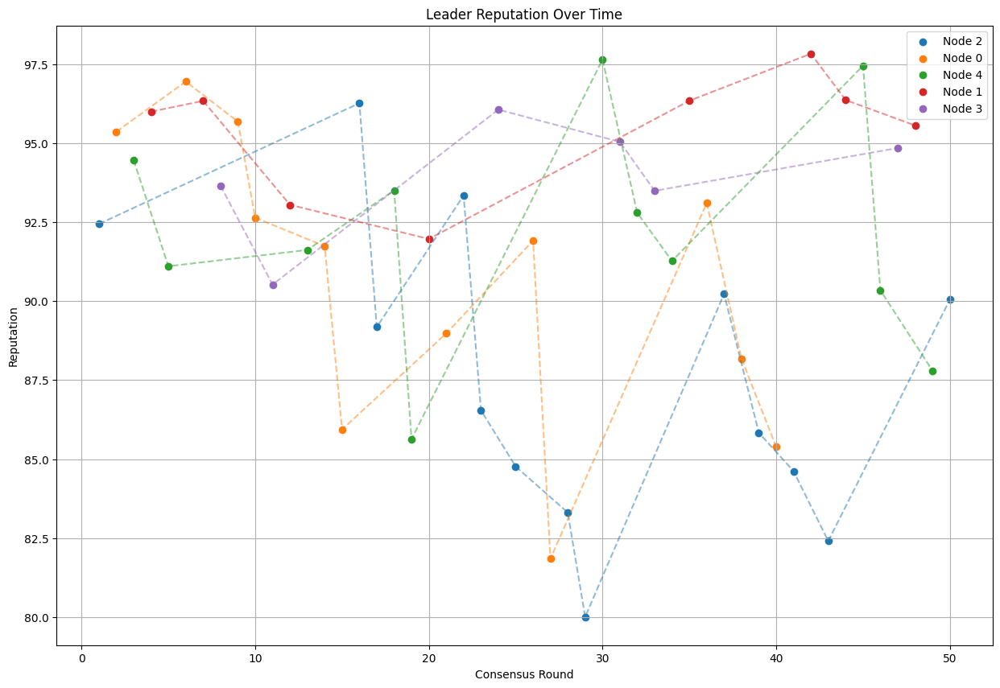


Leader Performance Summary:
Node 2:
 Times as leader: 13
 Average Latency: 0.048388 seconds
 Average Throughput: 350.03 tweets per second
 Average Reputation: 87.61
 Total Malicious Detections: 0
Node 0:
 Times as leader: 12
 Average Latency: 0.048637 seconds
 Average Throughput: 379.01 tweets per second
 Average Reputation: 90.64
 Total Malicious Detections: 0
Node 4:
 Times as leader: 11
 Average Latency: 0.050711 seconds
 Average Throughput: 349.45 tweets per second
 Average Reputation: 92.15
 Total Malicious Detections: 0
Node 1:
 Times as leader: 8
 Average Latency: 0.043651 seconds
 Average Throughput: 387.90 tweets per second
 Average Reputation: 95.43
 Total Malicious Detections: 0
Node 3:
 Times as leader: 6
 Average Latency: 0.043070 seconds
 Average Throughput: 380.13 tweets per second
 Average Reputation: 93.94
 Total Malicious Detections: 0


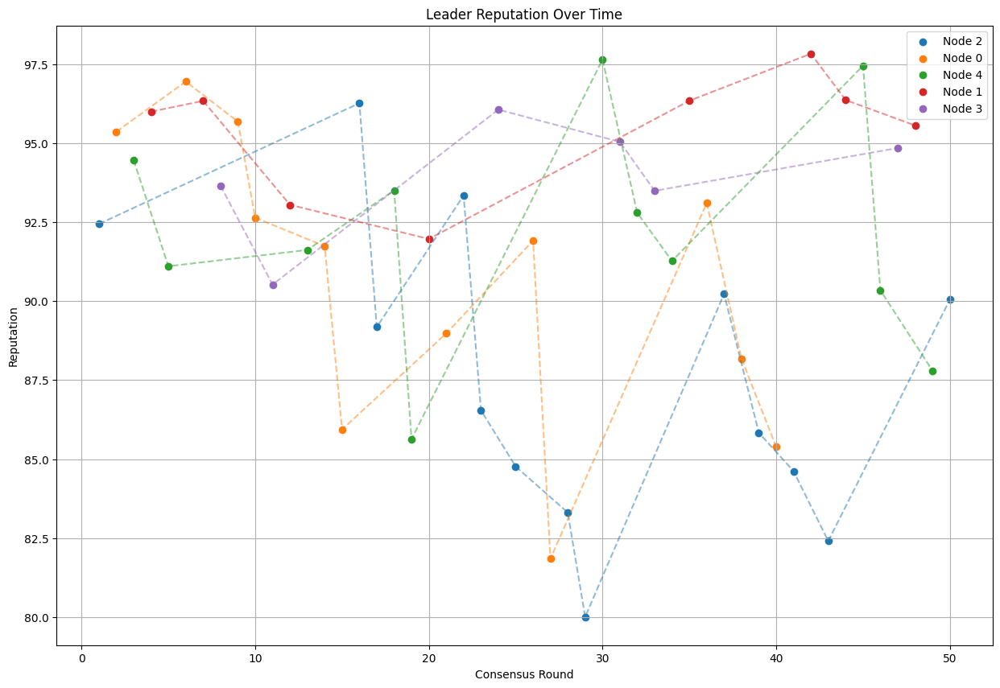

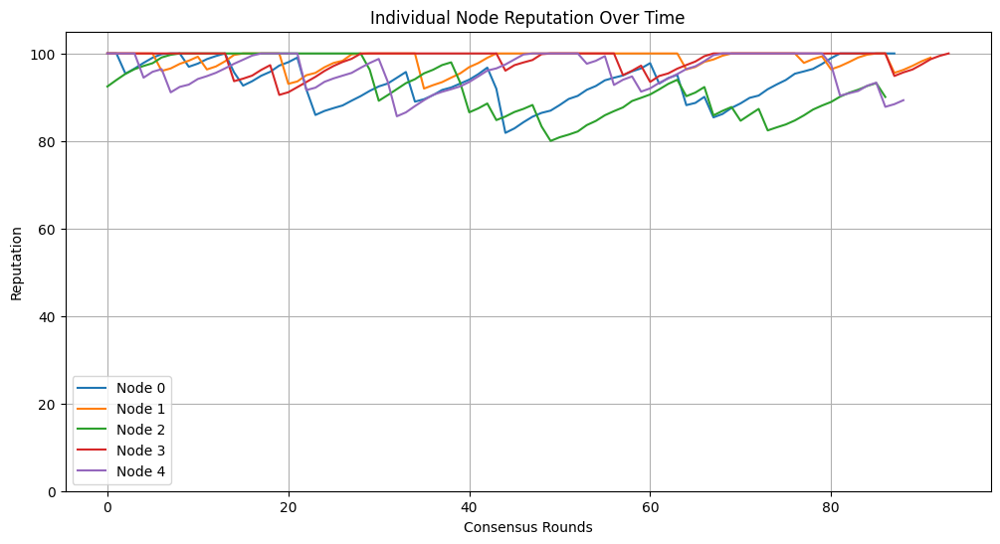

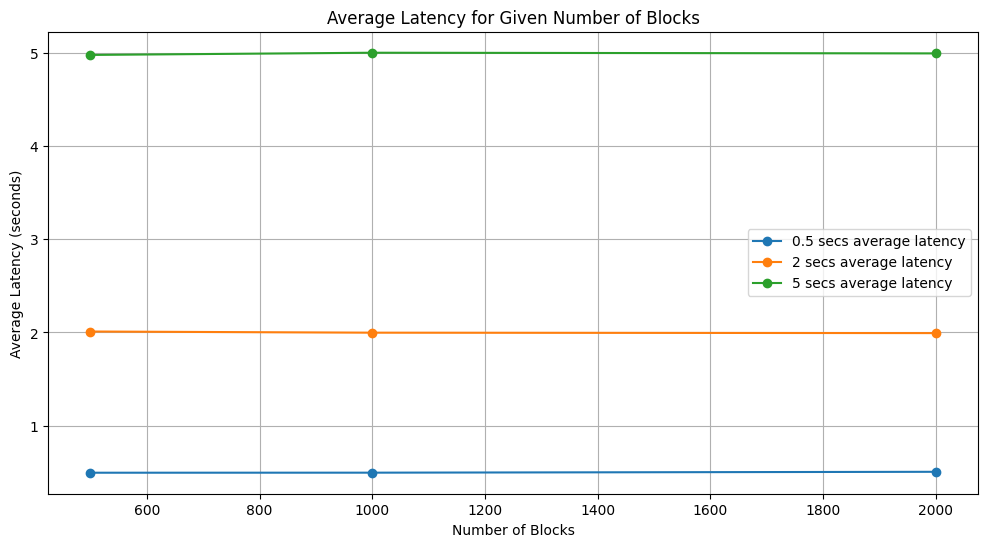

In [5]:
import random
import hashlib
import tenseal as ts
import time
import matplotlib.pyplot as plt
from collections import deque
import pandas as pd

class Node:
    def __init__(self, node_id, context):
        self.node_id = node_id
        self.reputation = 100
        self.is_malicious = False
        self.context = context
        self.reputation_history = []
        self.malicious_count = 0
        self.validation_times = []
        self.block_creation_times = []

    def propose_block(self, blockchain, tweets):
        start_time = time.time()

        # Filter for non-fake tweets
        non_fake_tweets = [tweet for tweet in tweets if tweet['is_fake'] == 0]

        # Extract tweet text values and convert to a list of ASCII values
        tweet_values = [ord(c) for tweet in non_fake_tweets for c in tweet['text']]

        # Create the encrypted tweets tensor
        encrypted_tweets = ts.ckks_vector(self.context, tweet_values)

        valid_tweet_count = ts.ckks_vector(self.context, [len(non_fake_tweets)])
        total_tweets = ts.ckks_vector(self.context, [len(tweets)])

        proof = self.generate_proof(valid_tweet_count, total_tweets)

        blockchain.append((encrypted_tweets, valid_tweet_count, total_tweets, proof))

        end_time = time.time()
        block_creation_time = end_time - start_time
        self.block_creation_times.append(block_creation_time)

        return valid_tweet_count, total_tweets, block_creation_time

    def generate_proof(self, valid_tweet_count, total_tweets):
        proof_data = str(valid_tweet_count) + str(total_tweets)
        proof = hashlib.sha256(proof_data.encode()).hexdigest()
        print(f"Node {self.node_id} generates proof: {proof}")
        return proof

    def verify_proof(self, proof, valid_tweet_count, total_tweets):
        start_time = time.time()
        proof_data = str(valid_tweet_count) + str(total_tweets)
        expected_proof = hashlib.sha256(proof_data.encode()).hexdigest()
        is_valid = proof == expected_proof
        end_time = time.time()
        validation_time = end_time - start_time
        self.validation_times.append(validation_time)
        print(f"Node {self.node_id} verifies proof: {proof} against expected: {expected_proof}")
        print(f"Validation time: {validation_time:.6f} seconds")

        # Update reputation based on validation time
        self.update_reputation(validation_time, 0.1)  # Use a threshold of 0.1 seconds

        return is_valid, validation_time

    def update_reputation(self, validation_time, threshold):
        if validation_time <= threshold:
            self.reputation += random.uniform(0.5, 1.5)
        else:
            reputation_loss = random.uniform(0.5, 1.5) * (validation_time - threshold)
            self.reputation -= reputation_loss
        self.reputation = max(0, min(100, self.reputation))
        self.reputation_history.append(self.reputation)

class BlockchainNetwork:
    def __init__(self, num_nodes):
        self.context = ts.context(ts.SCHEME_TYPE.CKKS, poly_modulus_degree=8192, coeff_mod_bit_sizes=[60, 40, 40, 60])
        self.context.global_scale = 2**40
        self.context.generate_galois_keys()
        self.nodes = [Node(i, self.context) for i in range(num_nodes)]
        self.blockchain = []
        self.total_valid_tweets = ts.ckks_vector(self.context, [0])
        self.total_tweets = ts.ckks_vector(self.context, [0])
        self.validation_time_threshold = 0.1
        self.block_creation_time_threshold = 1.0
        self.latencies = deque(maxlen=1000)
        self.throughputs = deque(maxlen=1000)
        self.leader_performance = {}

    def consensus(self, tweets):
        eligible_nodes = [node for node in self.nodes if node.reputation >= 50]
        if len(eligible_nodes) < 1:
            print("Not enough eligible nodes for consensus.")
            return

        primary_node = random.choices(eligible_nodes, weights=[node.reputation for node in eligible_nodes], k=1)[0]

        print(f"\nPrimary Node for this round: Node {primary_node.node_id}")
        print(f"Primary Node Reputation: {primary_node.reputation}")
        print(f"Primary Node Malicious Count: {primary_node.malicious_count}")

        start_time = time.time()
        valid_tweet_count, total_tweets, block_creation_time = primary_node.propose_block(self.blockchain, tweets)

        malicious_detected = False
        for node in eligible_nodes:
            if node != primary_node:
                is_valid, validation_time = node.verify_proof(
                    self.blockchain[-1][3],
                    valid_tweet_count,
                    total_tweets
                )
                if not is_valid:
                    primary_node.is_malicious = True
                    primary_node.malicious_count += 1
                    malicious_detected = True
                    print(f"Node {node.node_id} detected an invalid proof and reported Node {primary_node.node_id} as malicious.")
                    break

                # Update reputation based on validation time
                node.update_reputation(validation_time, self.validation_time_threshold)

        if malicious_detected:
            reputation_loss = random.uniform(15, 25) * primary_node.malicious_count
            primary_node.update_reputation(-reputation_loss, self.validation_time_threshold)
            print(f"Node {primary_node.node_id} loses {reputation_loss:.2f} reputation points.")
        else:
            self.total_valid_tweets += valid_tweet_count
            self.total_tweets += total_tweets
            print(f"Block added to the blockchain.")
            primary_node.update_reputation(random.uniform(3, 7), self.validation_time_threshold)
            if block_creation_time > self.block_creation_time_threshold:
                primary_node.update_reputation(-random.uniform(8, 12), self.validation_time_threshold)
                print(f"Node {primary_node.node_id} was slow in block creation and loses reputation points.")

        # Update reputation for all nodes not involved in this round
        for node in self.nodes:
            if node not in eligible_nodes:
                node.update_reputation(random.uniform(-0.5, 0.5), self.validation_time_threshold)

        end_time = time.time()
        total_latency = end_time - start_time
        self.latencies.append(total_latency)
        throughput = len(tweets) / total_latency
        self.throughputs.append(throughput)

        if primary_node.node_id not in self.leader_performance:
            self.leader_performance[primary_node.node_id] = []
        self.leader_performance[primary_node.node_id].append({
            'round': len(self.blockchain),
            'latency': total_latency,
            'throughput': throughput,
            'reputation': primary_node.reputation,
            'malicious_count': primary_node.malicious_count
        })

    def print_performance_summary(self):
        print("\nPerformance Summary of Nodes:")
        for node in self.nodes:
            status = "Malicious" if node.is_malicious else "Honest"
            avg_validation_time = sum(node.validation_times) / len(node.validation_times) if node.validation_times else 0
            avg_block_creation_time = sum(node.block_creation_times) / len(node.block_creation_times) if node.block_creation_times else 0
            print(f"Node {node.node_id}: Reputation = {node.reputation:.2f}, Status = {status}, "
                  f"Malicious Count = {node.malicious_count}, Avg Validation Time = {avg_validation_time:.6f}s, "
                  f"Avg Block Creation Time = {avg_block_creation_time:.6f}s")

    def print_tweet_statistics(self):
        total_tweets = self.total_tweets.decrypt()[0]
        non_fake_tweets = self.total_valid_tweets.decrypt()[0]
        percentage_non_fake = (non_fake_tweets / total_tweets) * 100 if total_tweets > 0 else 0
        print(f"\nTweet Statistics:")
        print(f"Total Tweets Processed: {total_tweets:.0f}")
        print(f"Non-Fake Tweets: {non_fake_tweets:.0f}")
        print(f"Percentage of Non-Fake Tweets: {percentage_non_fake:.2f}%")

    def print_latency_throughput_stats(self):
        avg_latency = sum(self.latencies) / len(self.latencies) if self.latencies else 0
        avg_throughput = sum(self.throughputs) / len(self.throughputs) if self.throughputs else 0
        print(f"\nLatency and Throughput Statistics:")
        print(f"Average Latency: {avg_latency:.6f} seconds")
        print(f"Average Throughput: {avg_throughput:.2f} tweets per second")

    def plot_node_performance(self):
        plt.figure(figsize=(12, 6))
        for node in self.nodes:
            plt.plot(range(len(node.reputation_history)), node.reputation_history, label=f'Node {node.node_id}')
        plt.title('Node Reputation Over Time')
        plt.xlabel('Consensus Rounds')
        plt.ylabel('Reputation')
        plt.legend()
        plt.grid(True)
        plt.ylim(0, 105)
        plt.show()

    def print_leader_performance(self):
        print("\nLeader Performance Summary:")
        for node_id, performances in self.leader_performance.items():
            avg_latency = sum(p['latency'] for p in performances) / len(performances)
            avg_throughput = sum(p['throughput'] for p in performances) / len(performances)
            avg_reputation = sum(p['reputation'] for p in performances) / len(performances)
            total_malicious = sum(p['malicious_count'] for p in performances)
            print(f"Node {node_id}:")
            print(f" Times as leader: {len(performances)}")
            print(f" Average Latency: {avg_latency:.6f} seconds")
            print(f" Average Throughput: {avg_throughput:.2f} tweets per second")
            print(f" Average Reputation: {avg_reputation:.2f}")
            print(f" Total Malicious Detections: {total_malicious}")

    def plot_leader_performance(self):
        plt.figure(figsize=(15, 10))
        for node_id, performances in self.leader_performance.items():
            rounds = [p['round'] for p in performances]
            reputations = [p['reputation'] for p in performances]
            plt.scatter(rounds, reputations, label=f'Node {node_id}')
            plt.plot(rounds, reputations, linestyle='--', alpha=0.5)
        plt.title('Leader Reputation Over Time')
        plt.xlabel('Consensus Round')
        plt.ylabel('Reputation')
        plt.legend()
        plt.grid(True)
        plt.show()

    def plot_individual_node_performance(self):
        plt.figure(figsize=(12, 6))
        for node in self.nodes:
            plt.plot(range(len(node.reputation_history)), node.reputation_history, label=f'Node {node.node_id}')
        plt.title('Individual Node Reputation Over Time')
        plt.xlabel('Consensus Rounds')
        plt.ylabel('Reputation')
        plt.legend()
        plt.grid(True)
        plt.ylim(0, 105)
        plt.show()

    def run_latency_simulation(self, n_list, average_latency_list):
        results = {latency: [] for latency in average_latency_list}
        for latency in average_latency_list:
            for n in n_list:
                total_latency = 0
                for _ in range(n):
                    validation_time = random.normalvariate(latency, latency * 0.2)  # Normally distributed latency
                    total_latency += validation_time
                avg_latency_result = total_latency / n
                results[latency].append(avg_latency_result)
        return results

    def plot_latency_results(self, results, n_list, average_latency_list):
        plt.figure(figsize=(12, 6))
        for latency in average_latency_list:
            latencies = results[latency]
            plt.plot(n_list, latencies, marker='o', label=f'{latency} secs average latency')

        plt.xlabel("Number of Blocks")
        plt.ylabel("Average Latency (seconds)")
        plt.title("Average Latency for Given Number of Blocks")
        plt.legend()
        plt.grid(True)
        plt.show()


# Select 30 random tweets from the dataset
selected_tweets = df.sample(30)
tweets = [{'text': row['text'], 'is_fake': row['is_fake']} for index, row in selected_tweets.iterrows() if row['is_fake'] == 0]

# Example usage
blockchain_network = BlockchainNetwork(5)

# Run the consensus simulation
for round_number in range(50):
    print(f"\n--- Consensus Round {round_number + 1} ---")
    blockchain_network.consensus(tweets)
    blockchain_network.print_performance_summary()
    blockchain_network.print_tweet_statistics()
    blockchain_network.print_latency_throughput_stats()
    blockchain_network.plot_node_performance()
    blockchain_network.print_leader_performance()
    blockchain_network.plot_leader_performance()

# Print and plot leader performance after all consensus rounds
blockchain_network.print_leader_performance()
blockchain_network.plot_leader_performance()

# Plot individual node performances
blockchain_network.plot_individual_node_performance()

# Run latency simulation with realistic values
n_list = [500, 1000, 2000]
average_latency_list = [0.5, 2, 5]

results = blockchain_network.run_latency_simulation(n_list, average_latency_list)

# Plot latency results
blockchain_network.plot_latency_results(results, n_list, average_latency_list)

# **ENCRYPTING AND DECRYPTING**

In [ ]:
import pandas as pd
from cryptography.hazmat.primitives.asymmetric import rsa, padding
from cryptography.hazmat.primitives import serialization, hashes
import base64

def generate_key_pair():
    private_key = rsa.generate_private_key(
        public_exponent=65537,
        key_size=2048
    )
    public_key = private_key.public_key()
    return private_key, public_key

def encrypt_message(message, public_key):
    try:
        message = message[:190]  # Truncate long messages
        message = ''.join(char for char in message if ord(char) < 128)  # Remove non-ASCII characters
        encrypted = public_key.encrypt(
            message.encode('ascii', errors='ignore'),
            padding.OAEP(
                mgf=padding.MGF1(algorithm=hashes.SHA256()),
                algorithm=hashes.SHA256(),
                label=None
            )
        )
        return base64.b64encode(encrypted).decode()
    except Exception:
        return None

def decrypt_message(encrypted_message, private_key):
    try:
        decrypted = private_key.decrypt(
            base64.b64decode(encrypted_message),
            padding.OAEP(
                mgf=padding.MGF1(algorithm=hashes.SHA256()),
                algorithm=hashes.SHA256(),
                label=None
            )
        )
        return decrypted.decode('ascii')
    except Exception:
        return None

In [ ]:
# Load the dataset
df = pd.read_csv('/content/sample_data/0819_UkraineCombinedTweetsDeduped.csv')

# Generate key pair
private_key, public_key = generate_key_pair()

# Encrypt tweets and save to file
encrypted_tweets = []
for _, row in df.iterrows():
    if pd.notna(row['text']) and row['text'].strip():
        encrypted_tweet = encrypt_message(row['text'], public_key)
        if encrypted_tweet:
            encrypted_tweets.append(encrypted_tweet)

# Save encrypted tweets to file
with open('encrypted_tweets.txt', 'w') as f:
    for tweet in encrypted_tweets:
        f.write(f"{tweet}\n")

# Save public key to file
pem = public_key.public_bytes(
    encoding=serialization.Encoding.PEM,
    format=serialization.PublicFormat.SubjectPublicKeyInfo
)
with open('public_key.pem', 'wb') as f:
    f.write(pem)

# Save private key to file
pem = private_key.private_bytes(
    encoding=serialization.Encoding.PEM,
    format=serialization.PrivateFormat.PKCS8,
    encryption_algorithm=serialization.NoEncryption()
)
with open('private_key.pem', 'wb') as f:
    f.write(pem)

print("Encryption complete. Encrypted tweets and keys have been saved to files.")


Encryption complete. Encrypted tweets and keys have been saved to files.


In [ ]:
# Demonstrate decryption
print("\nDecryption demonstration:")
# Decrypt the first 5 tweets
for i, encrypted_tweet in enumerate(encrypted_tweets[:5]):
    decrypted_tweet = decrypt_message(encrypted_tweet, private_key)
    if decrypted_tweet:
        print(f"Tweet {i+1}: {decrypted_tweet}")
    else:
        print(f"Tweet {i+1}: Decryption failed")


Decryption demonstration:
Tweet 1: Dear vaccine advocate

Do take the COVID19 mRNA shot and boosters, but do know that @OurWorldInData data shows it offers zero protection, actually accelerates death of vaccinated.

Regards
#
Tweet 2: #Mundo 

Al menos 6 muertos y 16 heridos en bombardeo ruso en #Kharkiv

https://t.co/AZzEgw2NLe
Tweet 3: Animal shelter Dogs and Cats, we need your help!
Raising funds food for animals.
PayPal: dogandcat.helper@gmail.com
https://t.co/Z3re0ItTfy
https://t.co/I9dbwRrtg0
https://t.co/71pErM8xBZ

#
Tweet 4: Welcome to our shelter!
Located in Ukraine, Kyiv
Our shelter needs your help!
Raising funds food for animals.
PayPal: dogandcat.helper@gmail.com
https://t.co/RH0peqvaXT
https://t.co/rTtTVpoC
Tweet 5: Tensin, debido a que #Rusia sigue en pie en la Planta Nuclear #Zaporiyia, traera un caos como #Chernbil? 
https://t.co/gxgEg40RiB
